`awk` es una librería que se utiliza para preprocesar archivos de texto.

La siguiente instrucción imprime línea por línea el archivo `nacional.csv`

In [2]:
# !awk "{{print}}" nacional.csv

Para filtrar se usa `/ filtro /` y para imprimir columnas específicas, `$` 

In [3]:
# !awk  -F"," "/2005/ { print $1 \" \" $2 \" \" $3}" nacional.csv

In [4]:
# http://gnuwin32.sourceforge.net/packages/coreutils.htm
# !awk  -F"," "{ print $5, $3 }" nacional.csv | sort | uniq -c

Aquí empieza la carga de datos.

In [5]:
import pandas as pd

df = pd.read_csv('nacional.csv')

df

,anio,sem,enfermedad,casos,cie
0,2005,1,colera,0,a00
1,2005,1,dengue clasico,0,a90
2,2005,1,enfermedad febril exantematica,3,u97
3,2005,1,fiebre del oeste del nilo,0,a92.3
4,2005,1,paludismo por p. falciparum,0,b50
...,...,...,...,...,...
23716,2014,53,tumor maligno de la mama,125,c50
23717,2014,53,tumor maligno del cuello del utero,58,c53
23718,2014,53,ulceras gastritis y duodenitis,16298,k25-k29
23719,2014,53,varicela,2229,b01


In [6]:
# https://epiweeks.readthedocs.io/
from datetime import date
from epiweeks import Week, Year

df['se'] = ''

# https://stackoverflow.com/a/16476974/3113008
for index, row in df.iterrows():
    df.loc[index, 'se'] = Week(row['anio'], row['sem']).enddate()

#https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.drop.html
df = df.drop(columns=['anio', 'sem'])
df

,enfermedad,casos,cie,se
0,colera,0,a00,2005-01-08
1,dengue clasico,0,a90,2005-01-08
2,enfermedad febril exantematica,3,u97,2005-01-08
3,fiebre del oeste del nilo,0,a92.3,2005-01-08
4,paludismo por p. falciparum,0,b50,2005-01-08
...,...,...,...,...
23716,tumor maligno de la mama,125,c50,2015-01-03
23717,tumor maligno del cuello del utero,58,c53,2015-01-03
23718,ulceras gastritis y duodenitis,16298,k25-k29,2015-01-03
23719,varicela,2229,b01,2015-01-03


a00 - https://es.wikipedia.org/wiki/colera


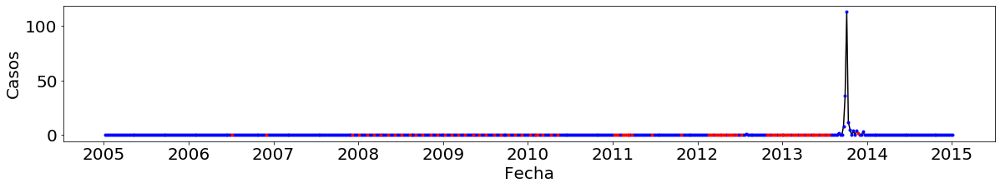

a01-a03 - https://es.wikipedia.org/wiki/enfermedades_infecciosas_intestinales


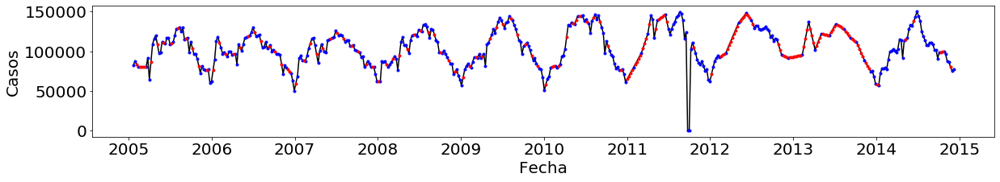

a01.0 - https://es.wikipedia.org/wiki/fiebre_tifoidea


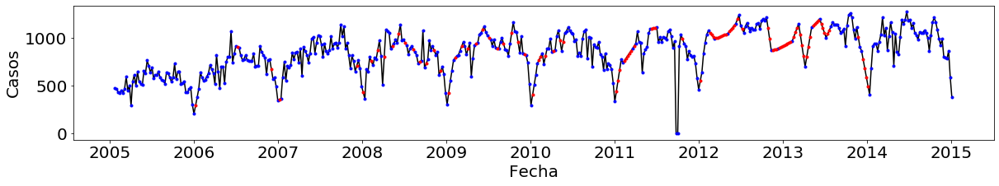

a01.1-a02 - https://es.wikipedia.org/wiki/paratifoidea


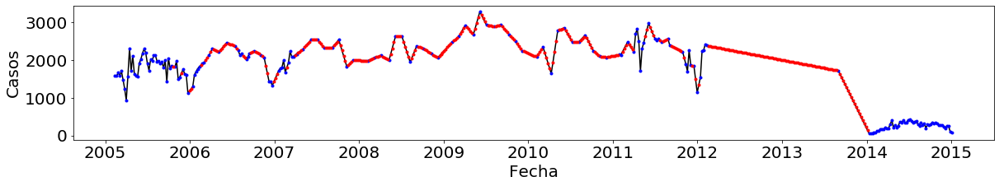

a02 - https://es.wikipedia.org/wiki/otras_salmonelosis


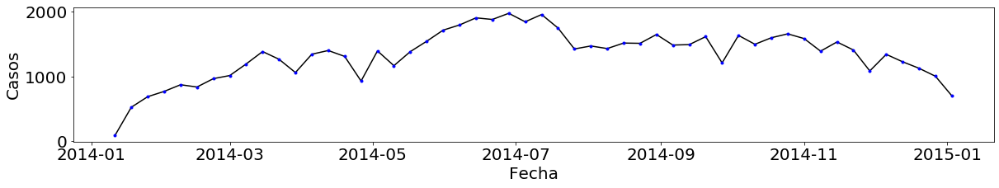

a03 - https://es.wikipedia.org/wiki/shigelosis


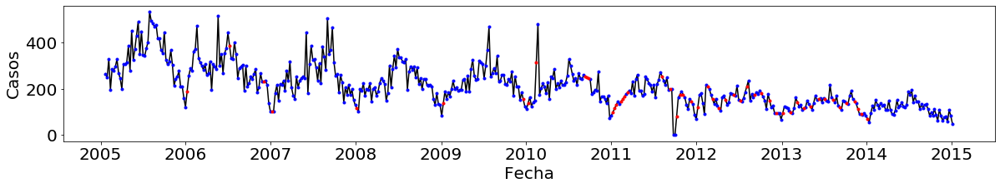

a04 - https://es.wikipedia.org/wiki/infecciones_intestinales_por_otros_organismos


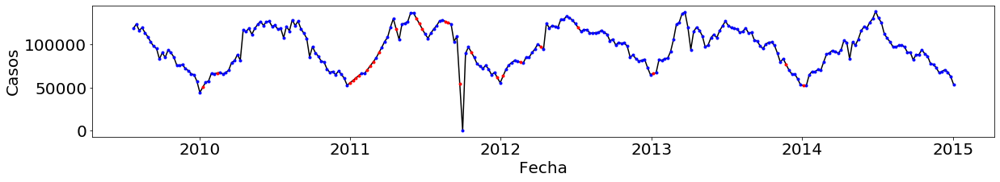

a04 a08-a09 - https://es.wikipedia.org/wiki/infeccion_intestinal_debida_a_virus_y_otros_organismos


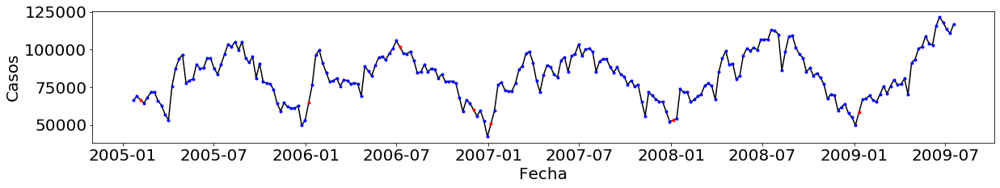

a05 - https://es.wikipedia.org/wiki/intoxicacion_alimentaria_bacteriana


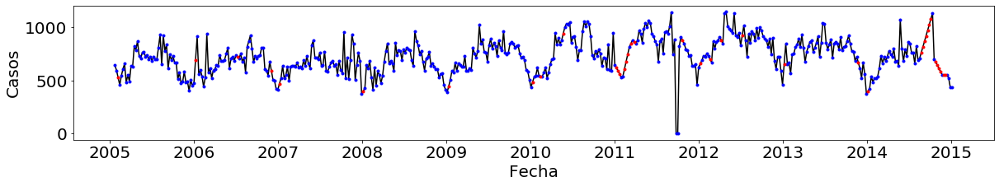

a06.0-a06.3 - https://es.wikipedia.org/wiki/amebiasis_intestinal


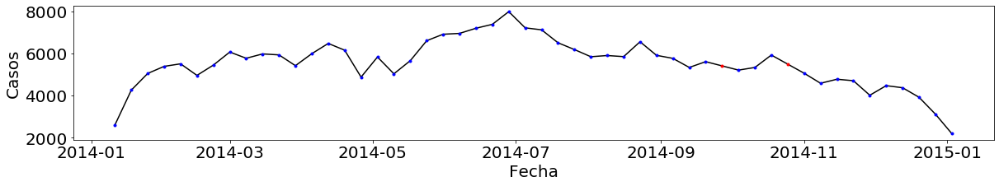

a06.4 - https://es.wikipedia.org/wiki/absceso_hepatico_amebiano


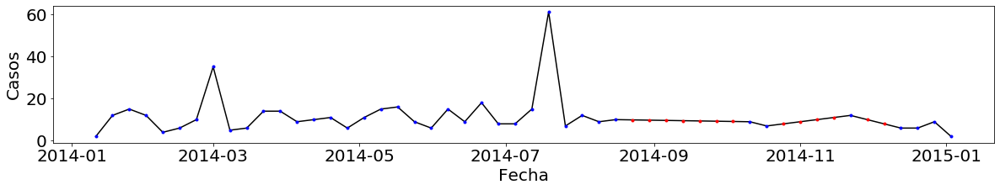

a07.0 - https://es.wikipedia.org/wiki/otras_infecciones_intestinales_debidas_a_protozoarios


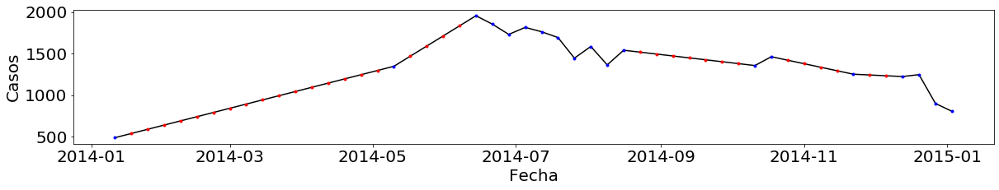

a07.1 - https://es.wikipedia.org/wiki/giardiasis


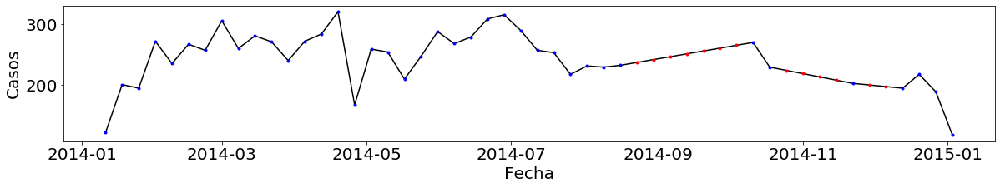

a08.0 - https://es.wikipedia.org/wiki/enteritis_debida_a_rotavirus


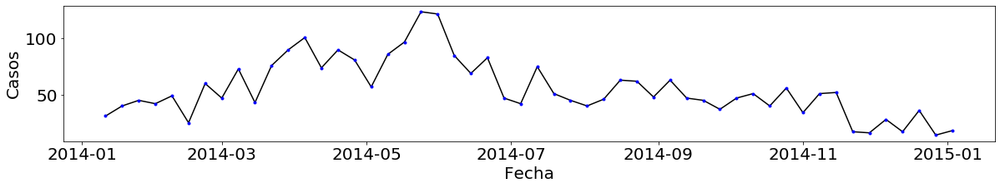

a15-a16 - https://es.wikipedia.org/wiki/tuberculosis_respiratoria


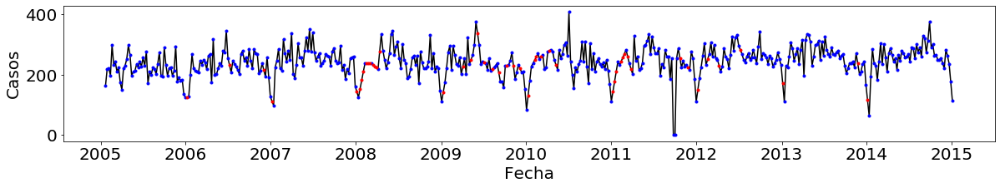

a17.0 - https://es.wikipedia.org/wiki/meningitis_tuberculosa


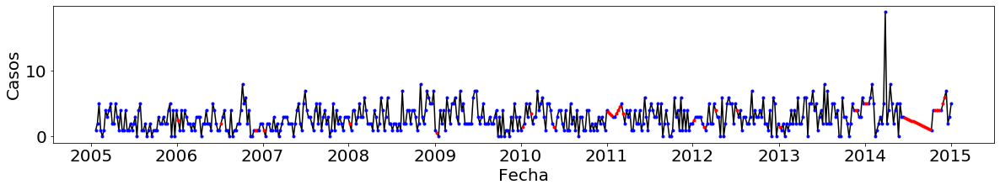

a17.1 - https://es.wikipedia.org/wiki/tuberculosis_otras_formas


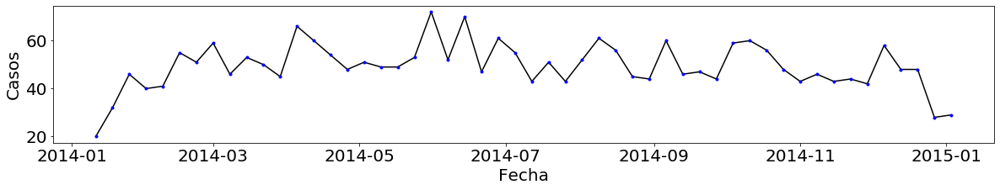

a23 - https://es.wikipedia.org/wiki/brucelosis


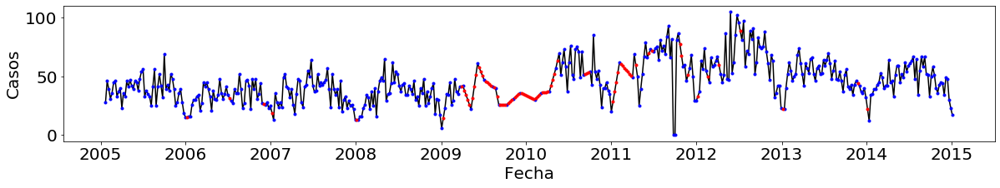

a27 - https://es.wikipedia.org/wiki/leptospirosis


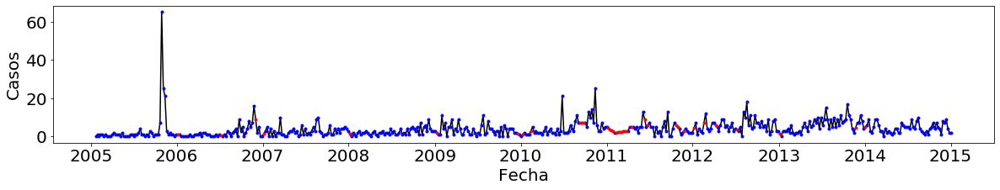

a30 - https://es.wikipedia.org/wiki/lepra


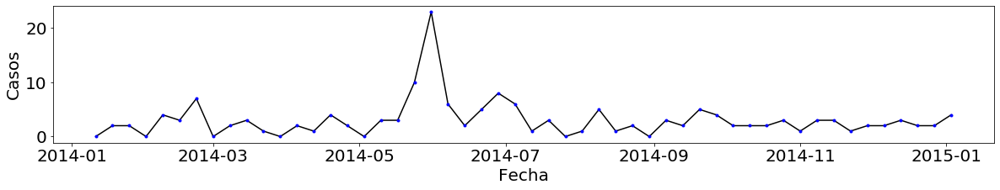

a33 - https://es.wikipedia.org/wiki/tetanos_neonatal


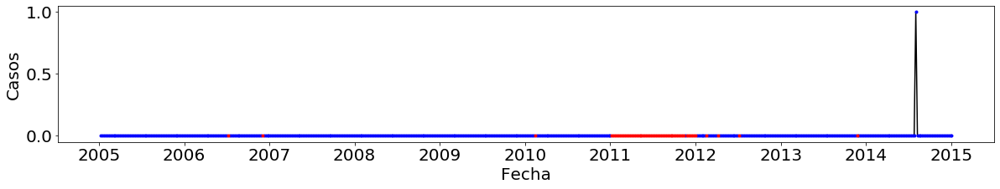

a34 - https://es.wikipedia.org/wiki/tetanos


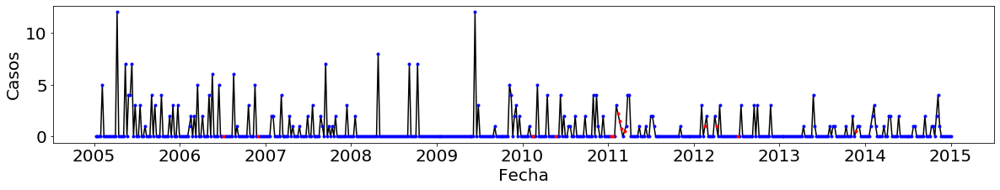

a37 - https://es.wikipedia.org/wiki/tos_ferina


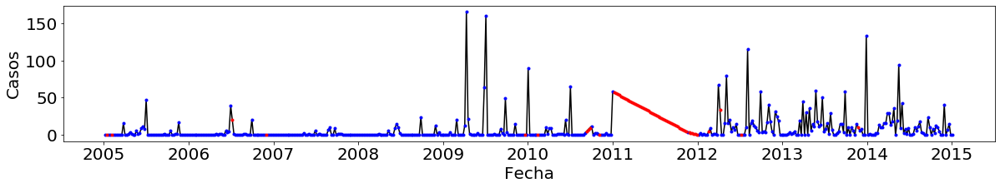

a38 - https://es.wikipedia.org/wiki/escarlatina


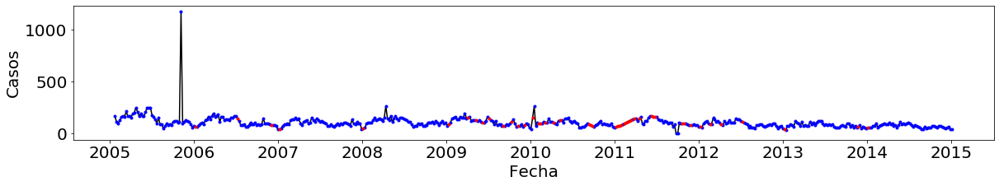

a39.0 - https://es.wikipedia.org/wiki/meningitis_meningococica


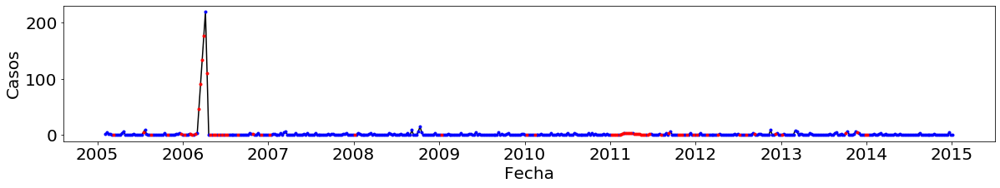

a40.3 - https://es.wikipedia.org/wiki/enfermedad_invasiva_por_neumococo


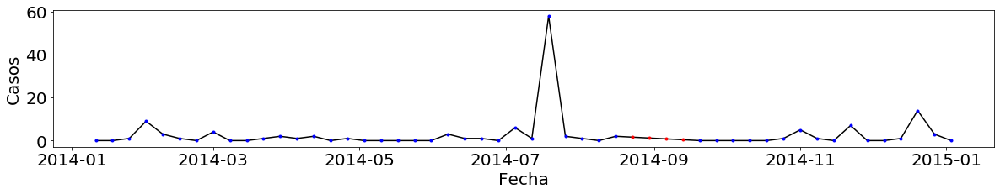

a41.3 - https://es.wikipedia.org/wiki/infecciones_invasivas_por_haemophilus_influenzae


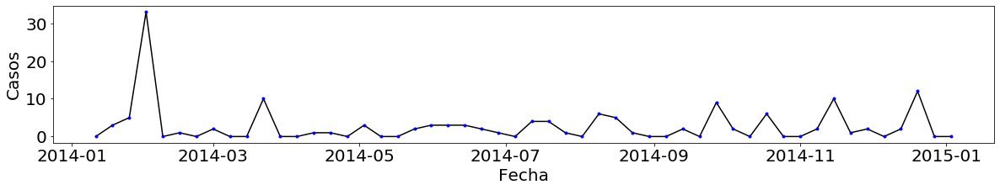

a46 - https://es.wikipedia.org/wiki/erisipela


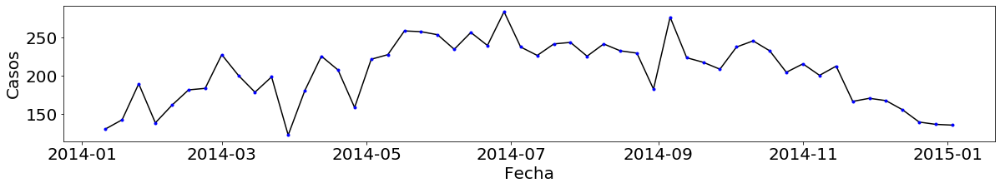

a50 - https://es.wikipedia.org/wiki/sifilis_congenita


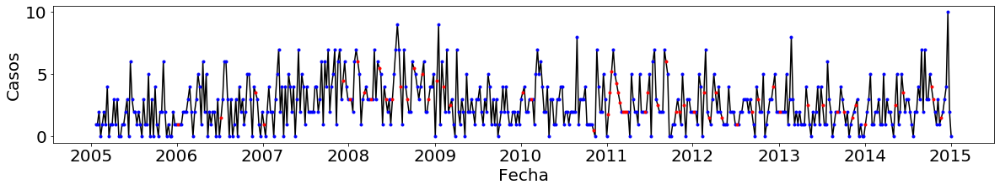

a51-a53 - https://es.wikipedia.org/wiki/sifilis_adquirida


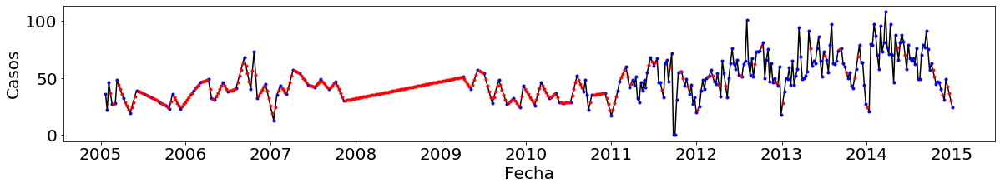

a54.0-a54.2 - https://es.wikipedia.org/wiki/infeccion_gonococica_genitourinaria


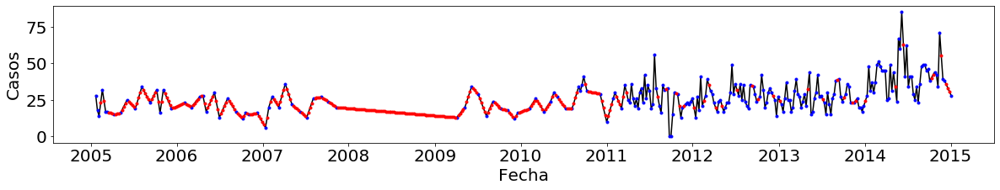

a55 - https://es.wikipedia.org/wiki/linfogranuloma_venereo_por_clamidias


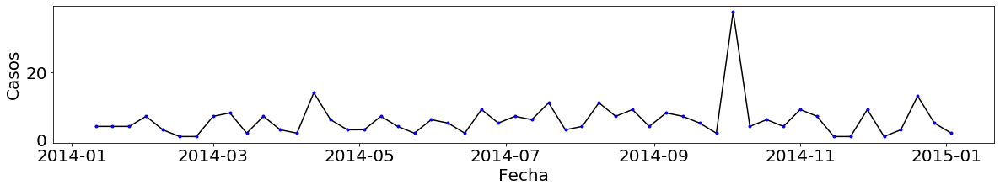

a57 - https://es.wikipedia.org/wiki/chancro_blando


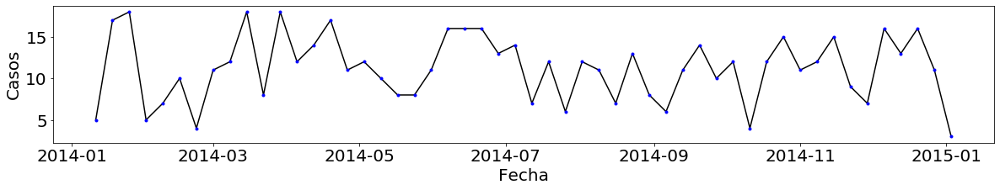

a59.0 - https://es.wikipedia.org/wiki/tricomoniasis_urogenital


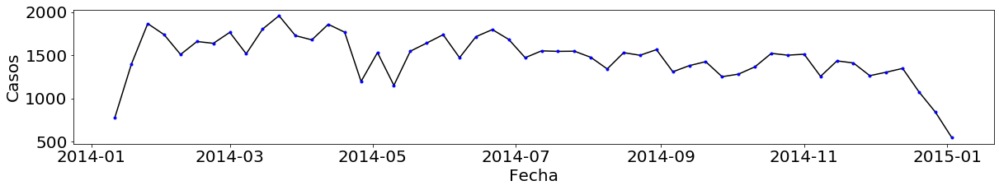

a60.0 - https://es.wikipedia.org/wiki/herpes_genital


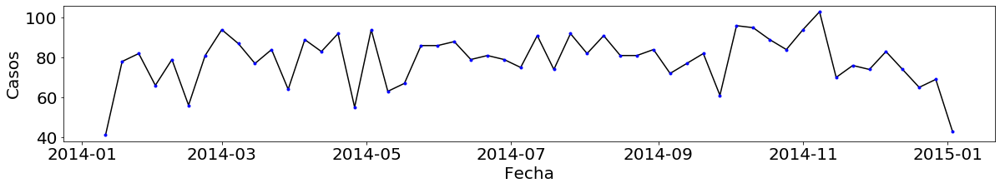

a67 - https://es.wikipedia.org/wiki/mal_del_pinto


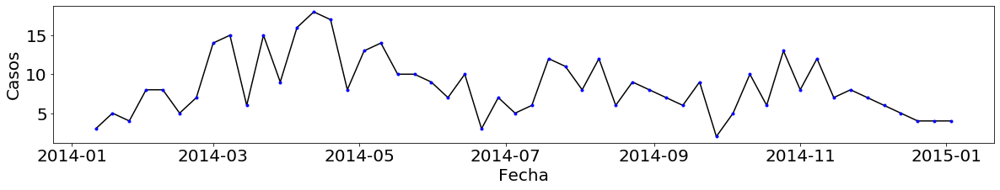

a71 - https://es.wikipedia.org/wiki/tracoma


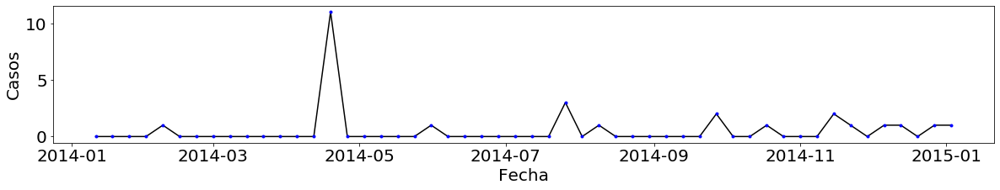

a75.0 - https://es.wikipedia.org/wiki/tifo_epidemico


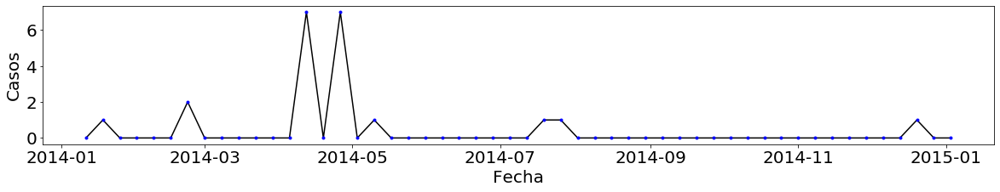

Error a75.2 - https://es.wikipedia.org/wiki/                enfermedad  casos    cie         se
2014-10-18  tifo epidemico      0  a75.0 2014-10-18


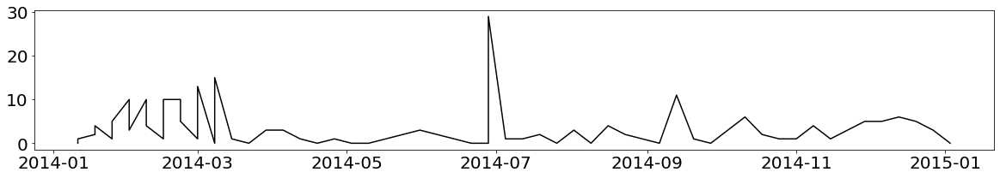

a75.9 - https://es.wikipedia.org/wiki/otras_rickettsiosis


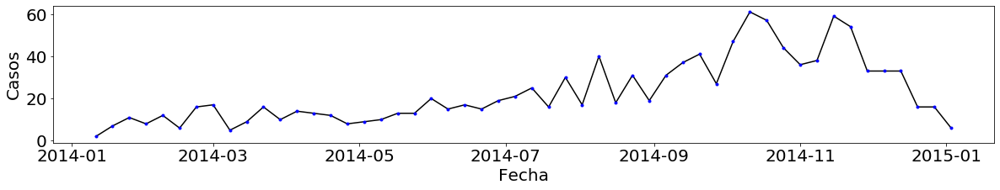

a76.0 - https://es.wikipedia.org/wiki/vulvovaginitis_inespecifica


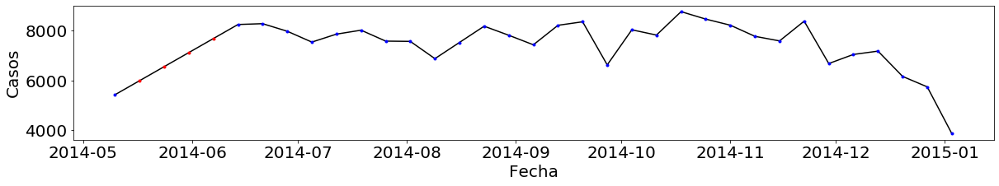

a77.0 - https://es.wikipedia.org/wiki/fiebre_manchada


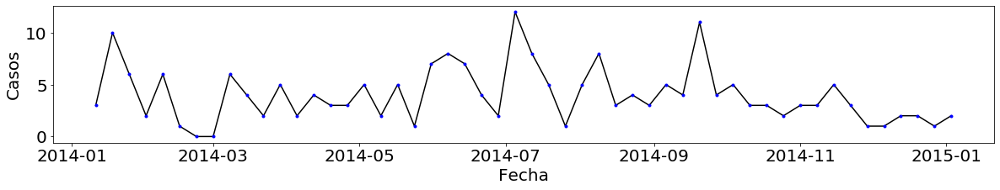

a90 - https://es.wikipedia.org/wiki/dengue_clasico


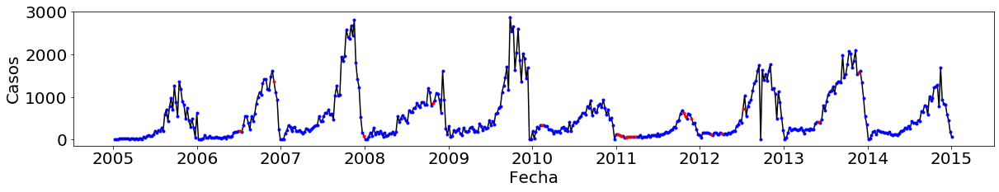

a91 - https://es.wikipedia.org/wiki/fiebre_hemorragica_por_dengue


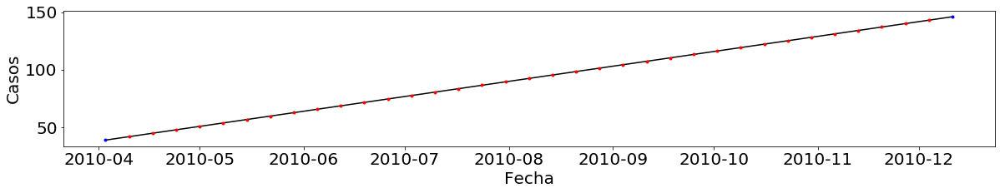

a92.0 - https://es.wikipedia.org/wiki/enfermedad_por_virus_chikungunya


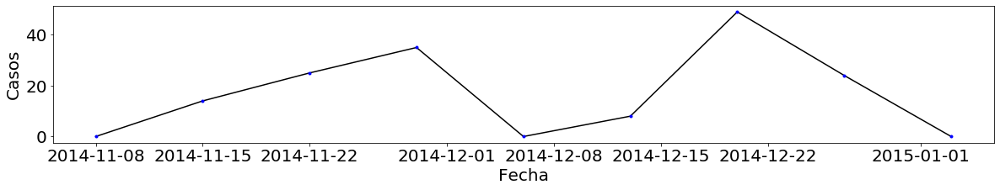

a92.3 - https://es.wikipedia.org/wiki/fiebre_del_oeste_del_nilo


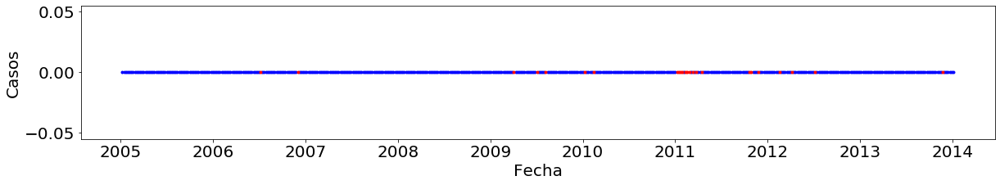

b01 - https://es.wikipedia.org/wiki/varicela


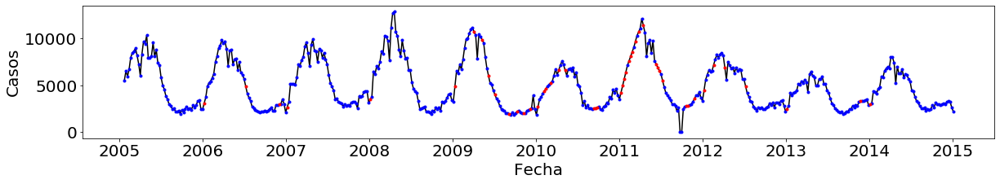

b06 - https://es.wikipedia.org/wiki/rubeola


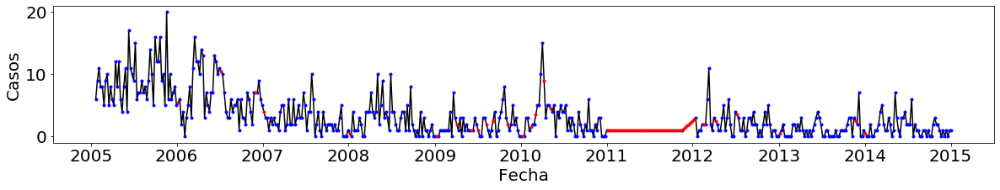

b15 - https://es.wikipedia.org/wiki/hepatitis_virica_a


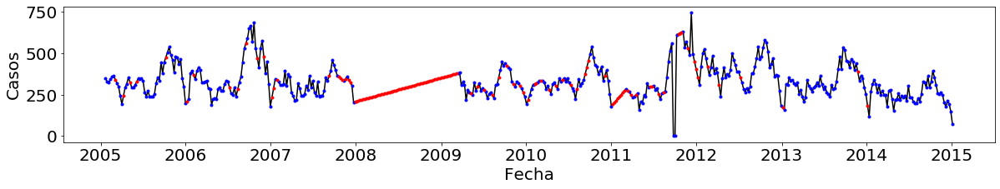

b16 - https://es.wikipedia.org/wiki/hepatitis_virica_b


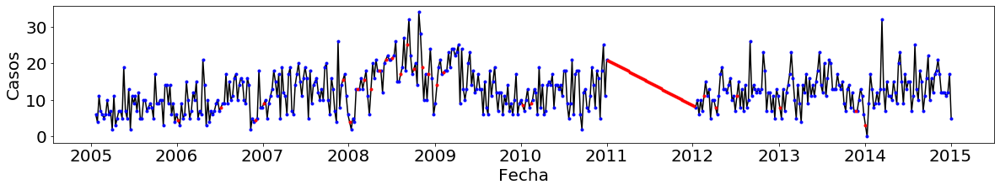

b17-b19 - https://es.wikipedia.org/wiki/otras_hepatitis_viricas


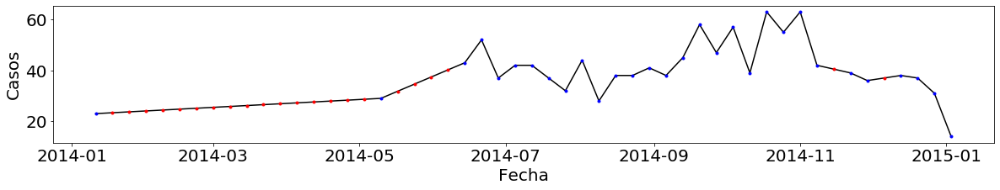

b17.1 - https://es.wikipedia.org/wiki/hepatitis_virica_c


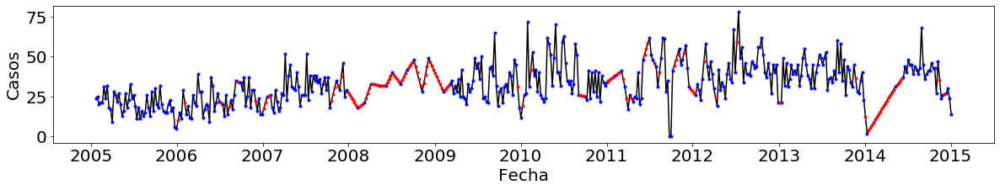

b20-b24 - https://es.wikipedia.org/wiki/sida


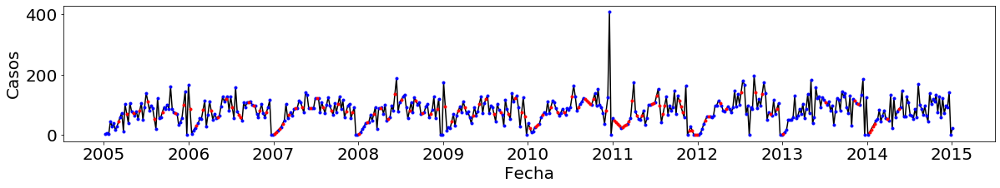

b26 - https://es.wikipedia.org/wiki/parotiditis_infecciosa


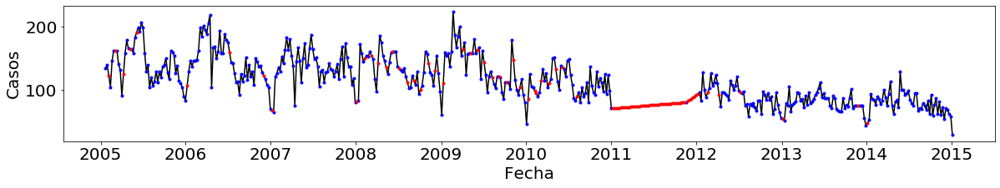

b30 - https://es.wikipedia.org/wiki/conjuntivitis


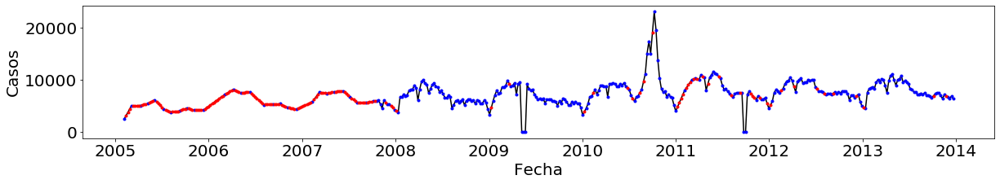

b30.3 - https://es.wikipedia.org/wiki/conjuntivitis_epidemica_aguda_hemorragica


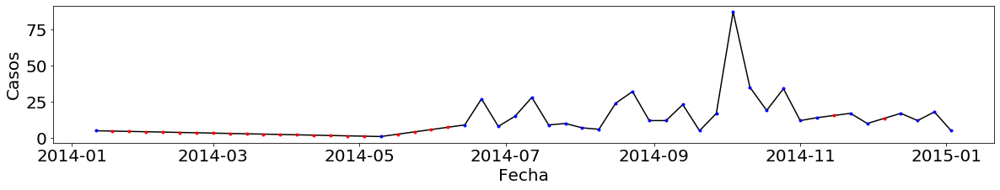

b37.3-b37.4 - https://es.wikipedia.org/wiki/candidiasis_urogenital


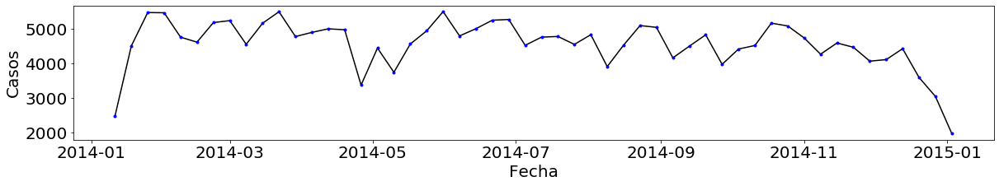

b50 - https://es.wikipedia.org/wiki/paludismo_por_p._falciparum


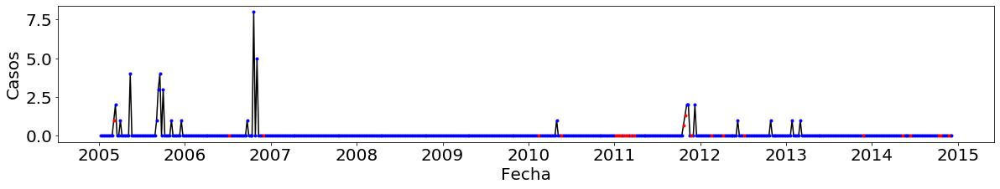

b51 - https://es.wikipedia.org/wiki/paludismo_por_p._vivax


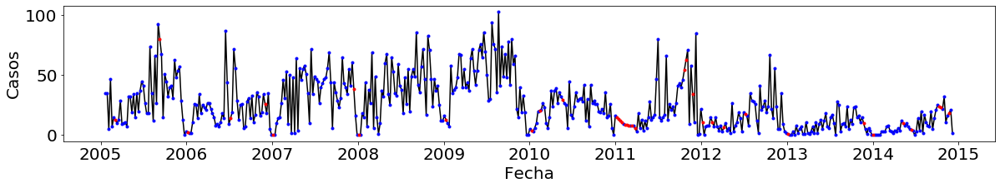

b55.0 - https://es.wikipedia.org/wiki/leishmaniasis_visceral


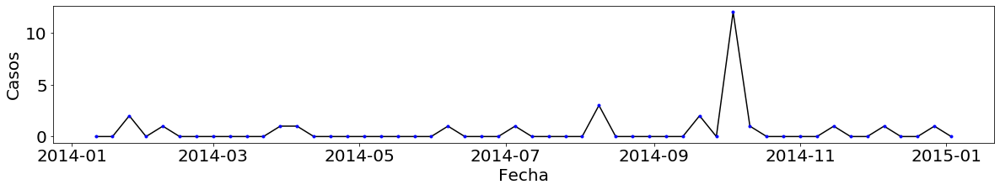

b55.1 - https://es.wikipedia.org/wiki/leishmaniasis_cutanea


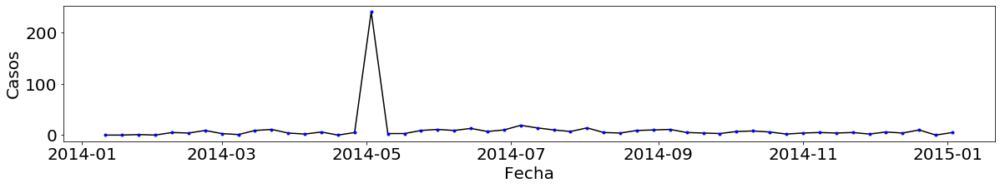

b57 - https://es.wikipedia.org/wiki/tripanosomiasis_americana


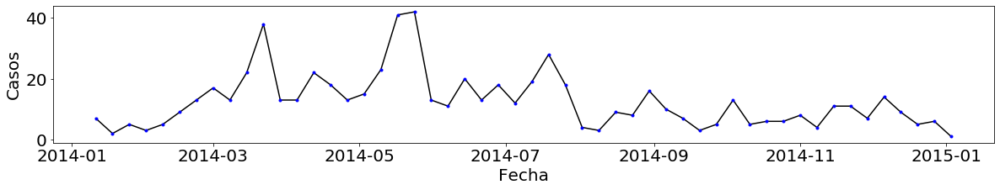

b58 - https://es.wikipedia.org/wiki/toxoplasmosis


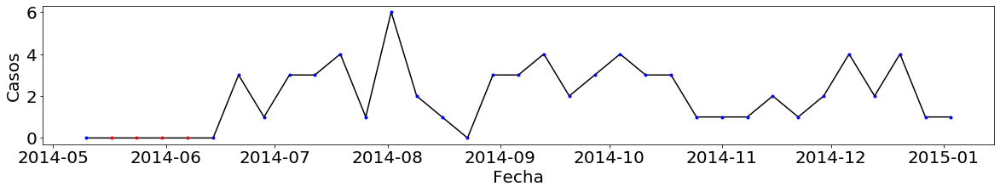

b60.2 - https://es.wikipedia.org/wiki/meningoencefalitis_amebiana_primaria


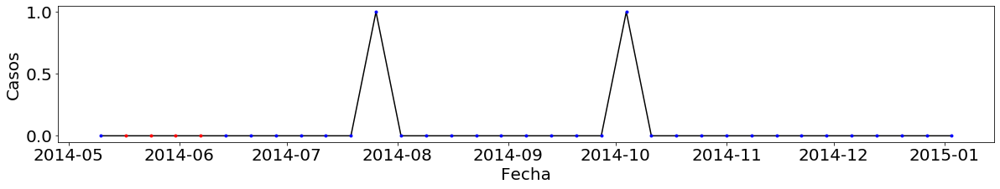

b65-b67 - https://es.wikipedia.org/wiki/otras_helmintiasis


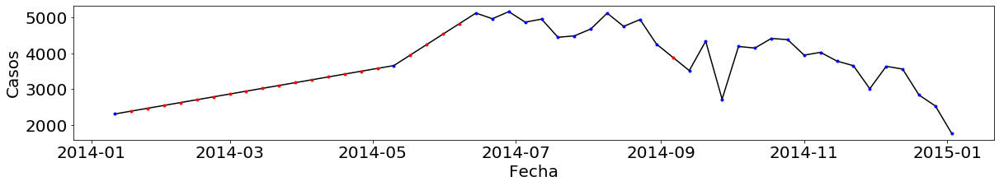

b68 - https://es.wikipedia.org/wiki/teniasis


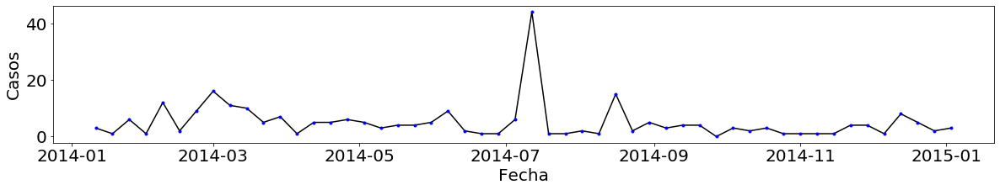

b69 - https://es.wikipedia.org/wiki/cisticercosis


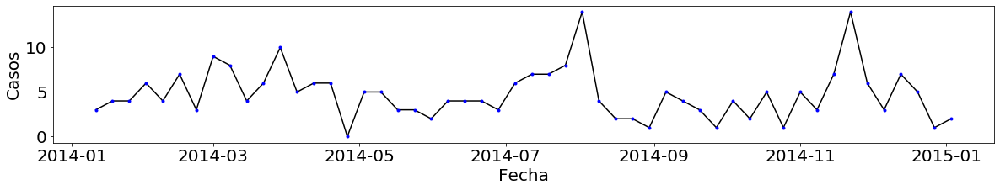

b73 - https://es.wikipedia.org/wiki/oncocercosis


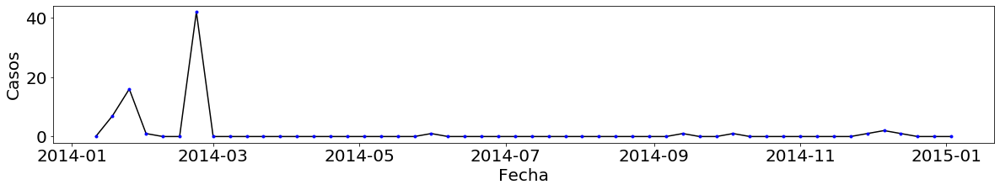

b75 - https://es.wikipedia.org/wiki/triquinosis


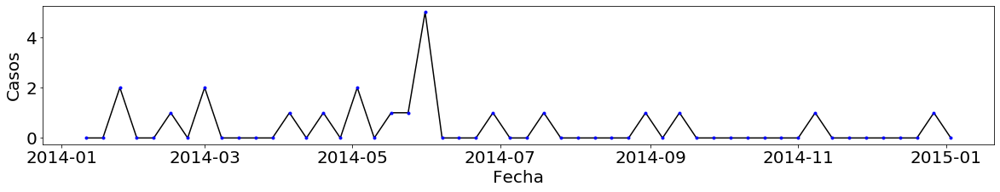

b77 - https://es.wikipedia.org/wiki/ascariasis


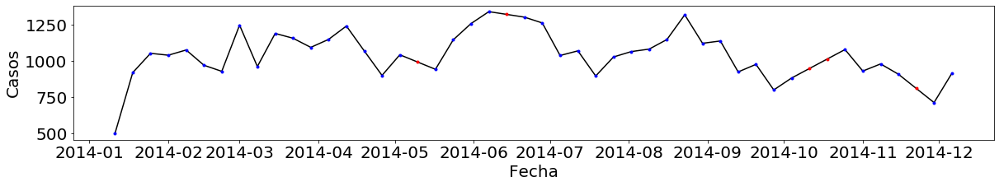

b80 - https://es.wikipedia.org/wiki/enterobiasis


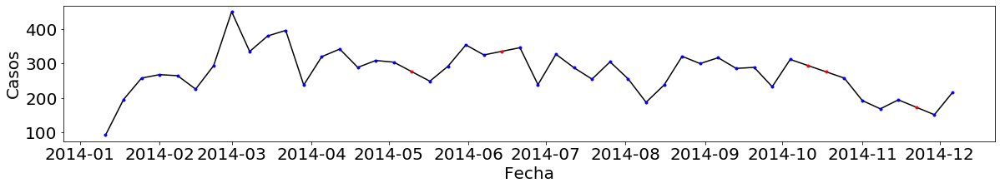

b86 - https://es.wikipedia.org/wiki/escabiosis


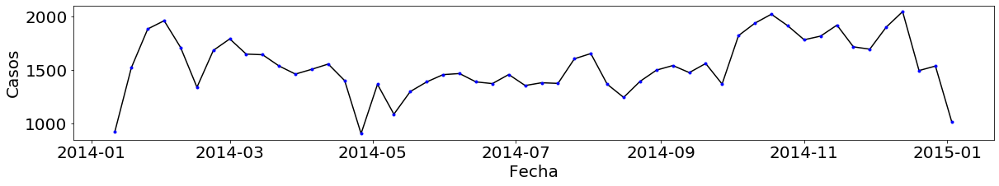

b97.7 - https://es.wikipedia.org/wiki/infeccion_por_virus_de_papiloma_humano


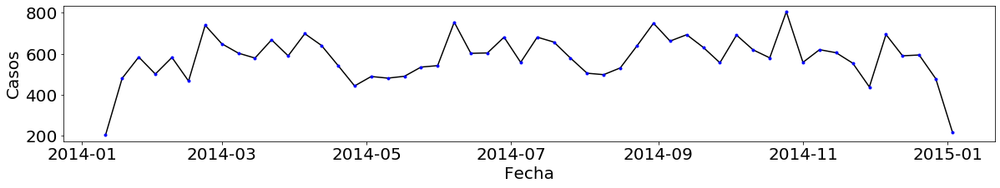

c50 - https://es.wikipedia.org/wiki/tumor_maligno_de_la_mama


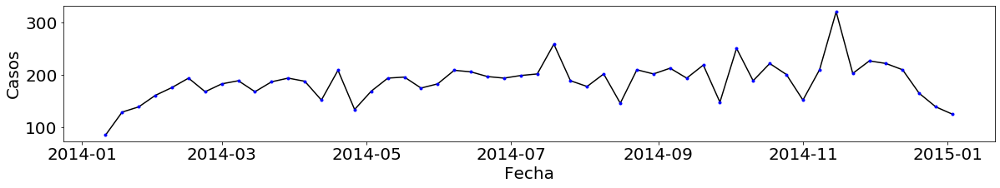

c53 - https://es.wikipedia.org/wiki/tumor_maligno_del_cuello_del_utero


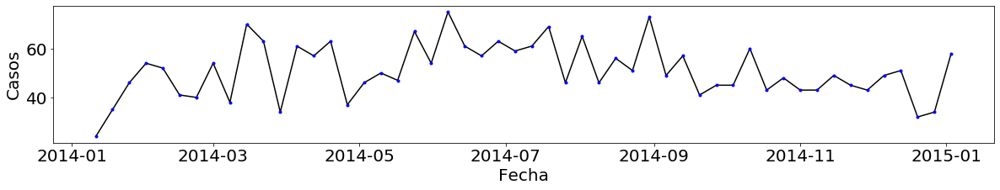

e01 - https://es.wikipedia.org/wiki/bocio


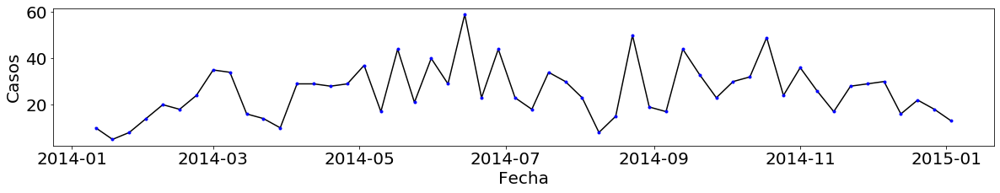

e10 - https://es.wikipedia.org/wiki/diabetes_mellitus_insulinodependiente_(tipo_i)


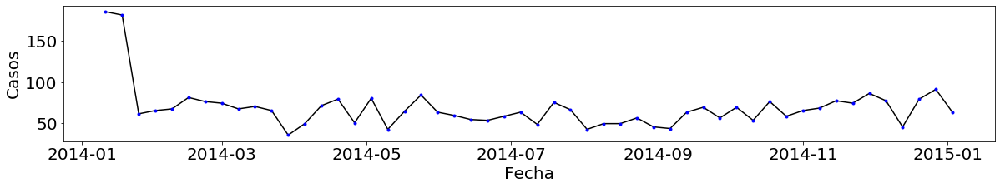

e11-e14 - https://es.wikipedia.org/wiki/diabetes_mellitus_no_insulinodependiente_(tipo_ii)


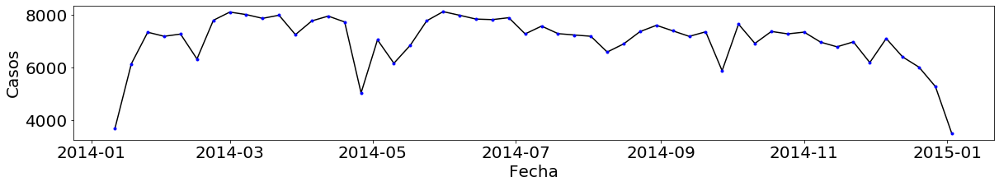

e40-e43 - https://es.wikipedia.org/wiki/desnutricion_severa


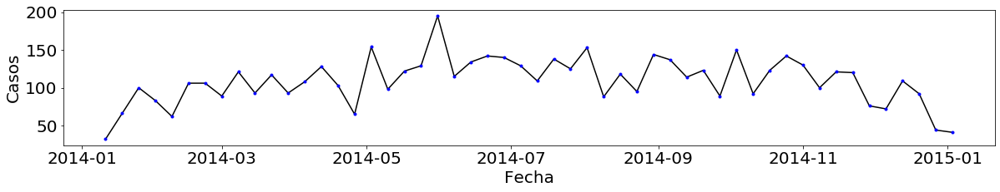

e44.0 - https://es.wikipedia.org/wiki/desnutricion_moderada


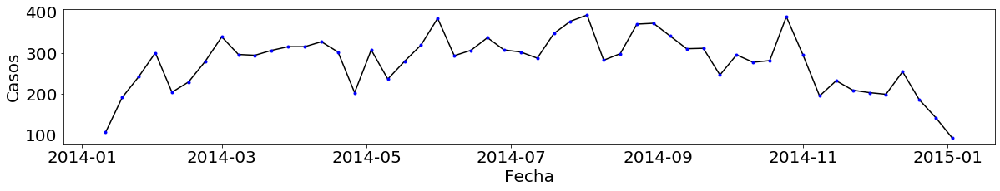

e44.1 - https://es.wikipedia.org/wiki/desnutricion_leve


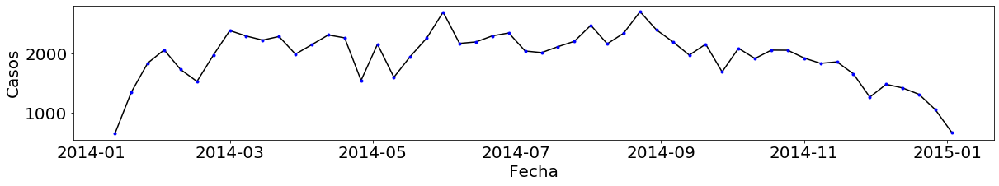

e66 - https://es.wikipedia.org/wiki/obesidad


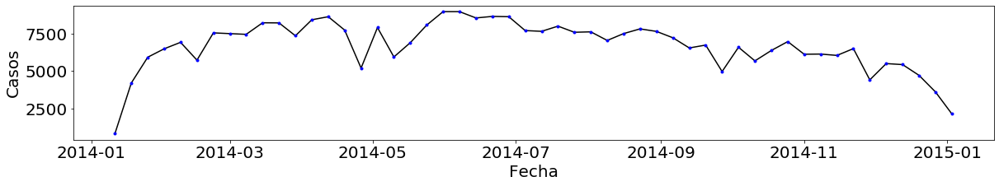

f10-f19 - https://es.wikipedia.org/wiki/adicciones


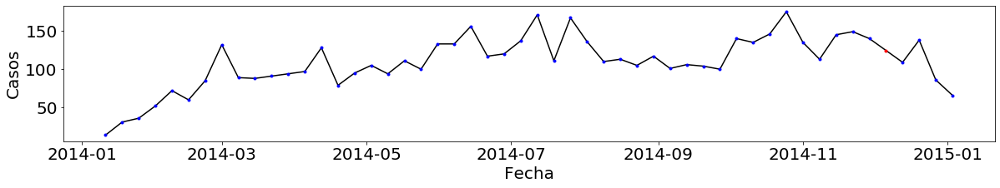

f10.0 - https://es.wikipedia.org/wiki/intoxicacion_aguda_por_alcohol


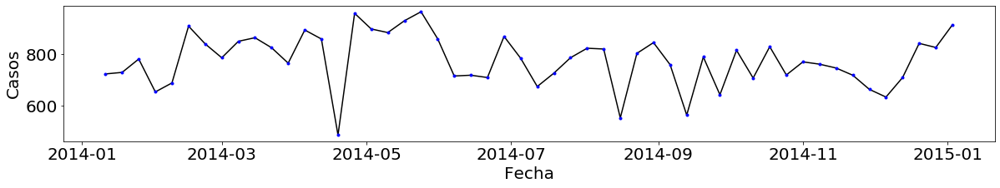

f32 - https://es.wikipedia.org/wiki/depresion


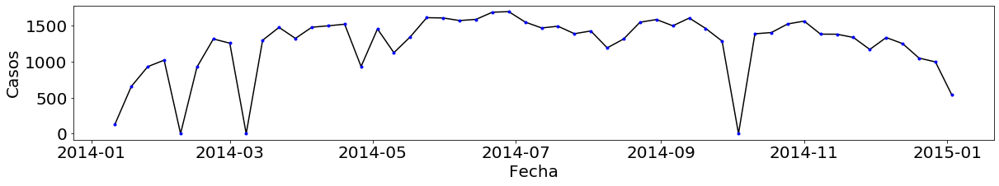

f50 - https://es.wikipedia.org/wiki/anorexia_y_bulimia


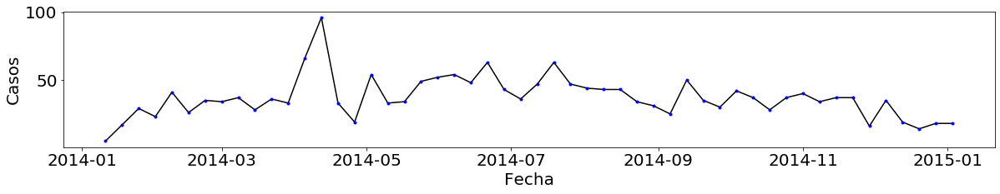

g00-g03 - https://es.wikipedia.org/wiki/meningitis


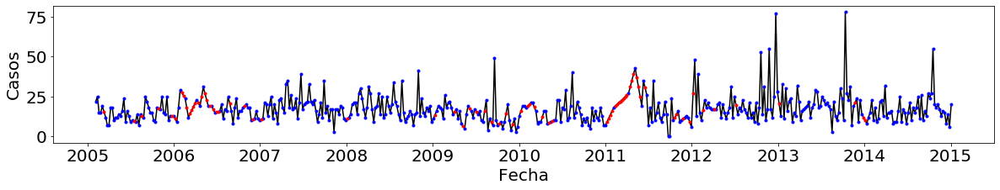

g20 - https://es.wikipedia.org/wiki/enfermedad_de_parkinson


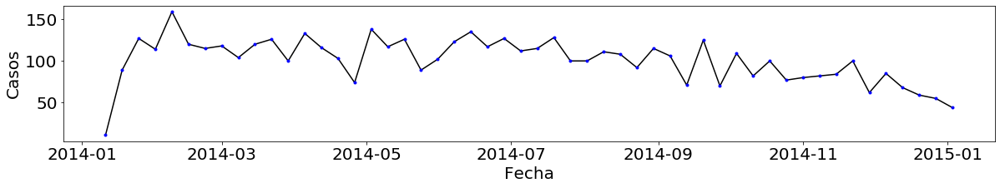

g30 - https://es.wikipedia.org/wiki/enfermedad_de_alzheimer


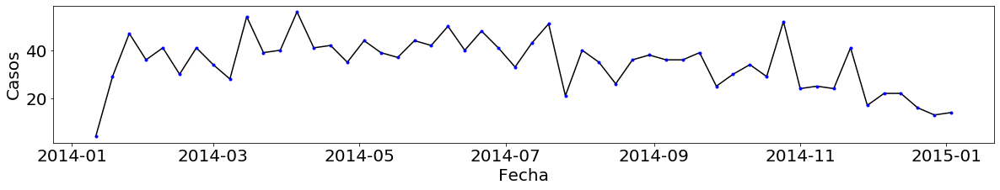

h10 - https://es.wikipedia.org/wiki/conjuntivitis


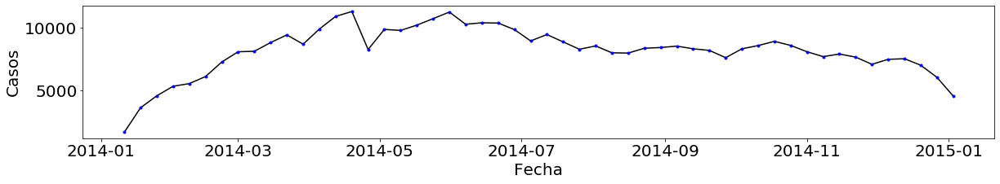

h65.0-h65.1 - https://es.wikipedia.org/wiki/otitis_media_aguda


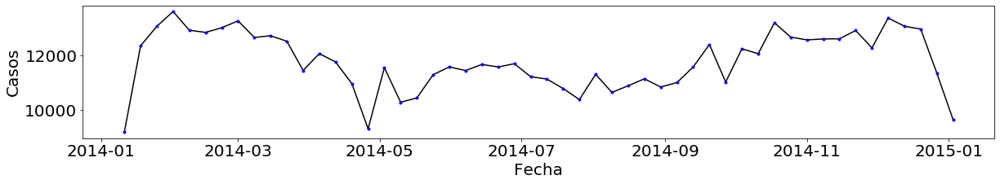

i00-i02 - https://es.wikipedia.org/wiki/fiebre_reumatica_aguda


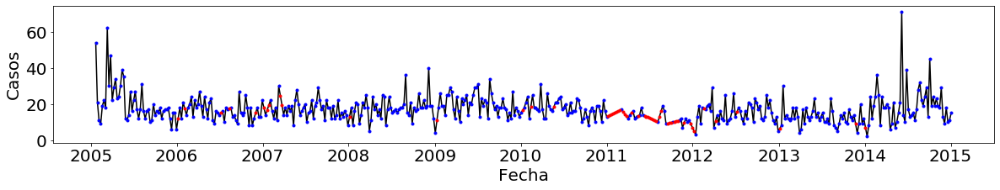

i10-i15 - https://es.wikipedia.org/wiki/hipertension_arterial


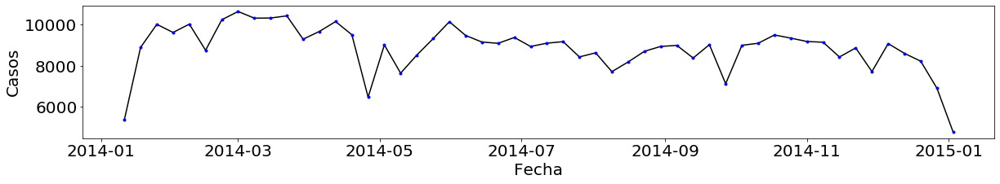

i20 - https://es.wikipedia.org/wiki/enfermedad_isquemica_del_corazon


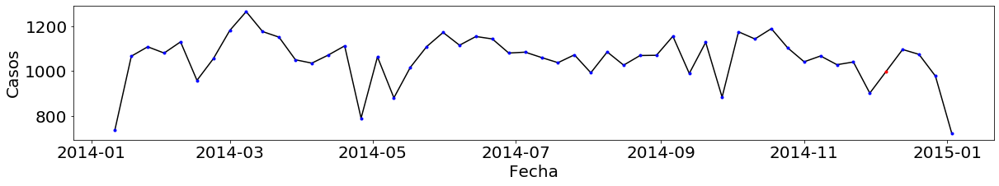

i60-i67 - https://es.wikipedia.org/wiki/enfermedad_cerebrovascular


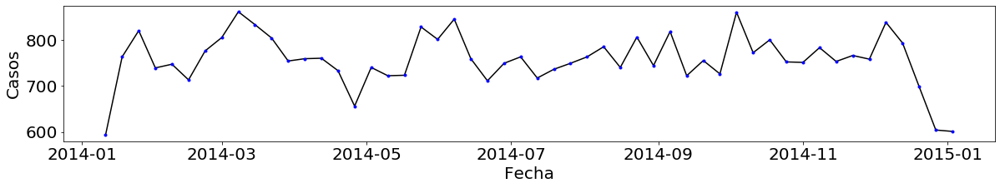

i87.2 - https://es.wikipedia.org/wiki/insuficiencia_venosa_periferica


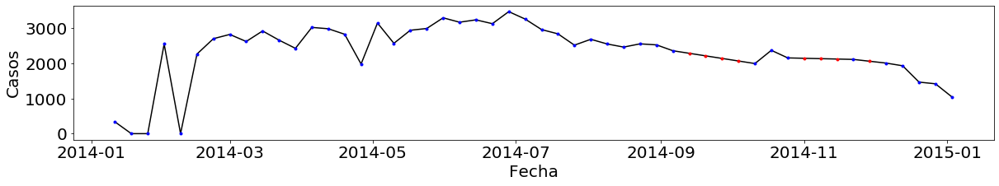

j00-j06 - https://es.wikipedia.org/wiki/infecciones_respiratorias_agudas


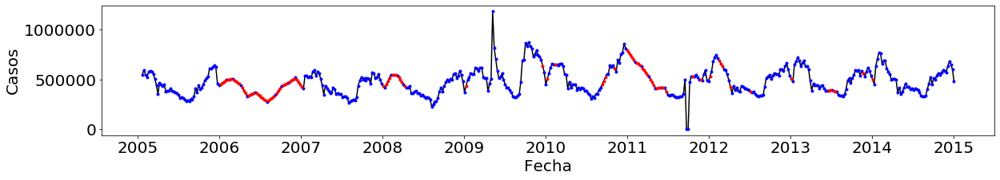

j02.0 - https://es.wikipedia.org/wiki/faringitis_y_amigdalitis_estreptococicas


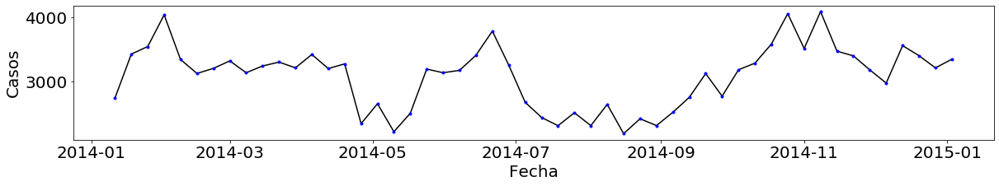

j09 - https://es.wikipedia.org/wiki/influenza_a_h1n1


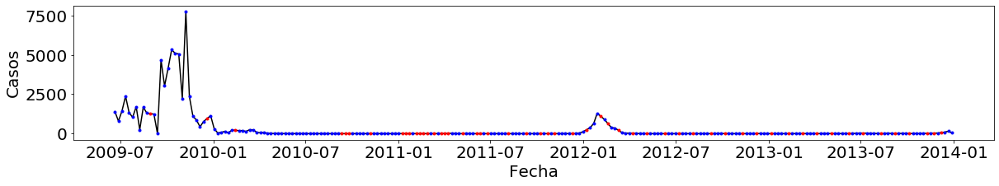

j09-j11 - https://es.wikipedia.org/wiki/influenza


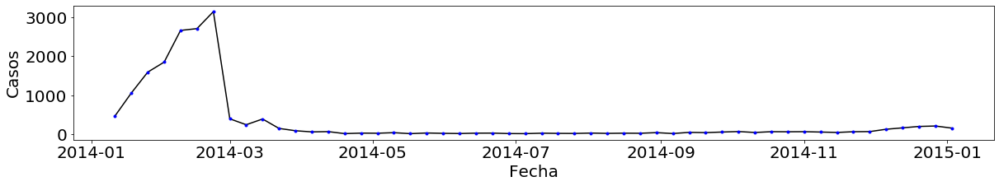

j12 - https://es.wikipedia.org/wiki/neumonias_y_bronconeumonias


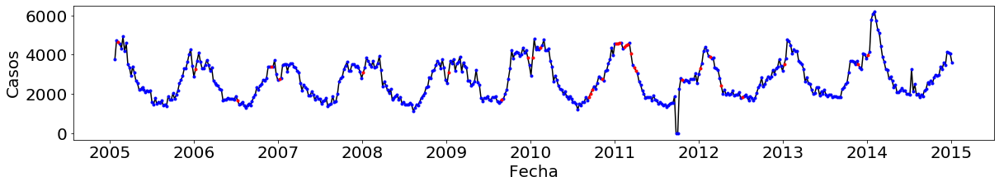

j45 - https://es.wikipedia.org/wiki/asma


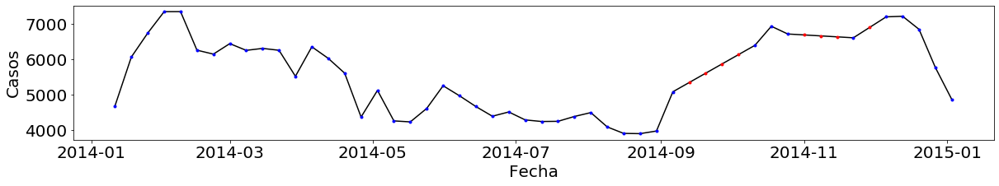

k05 - https://es.wikipedia.org/wiki/gingivitis_y_enfermedad_periodontal


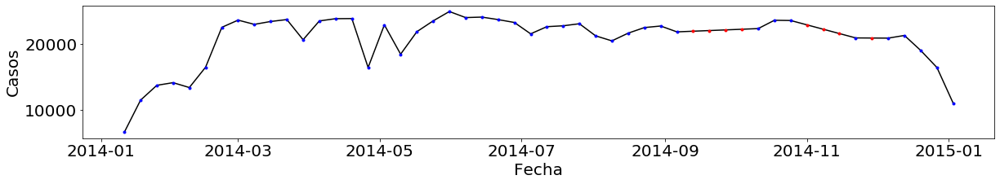

k25-k29 - https://es.wikipedia.org/wiki/ulceras_gastritis_y_duodenitis


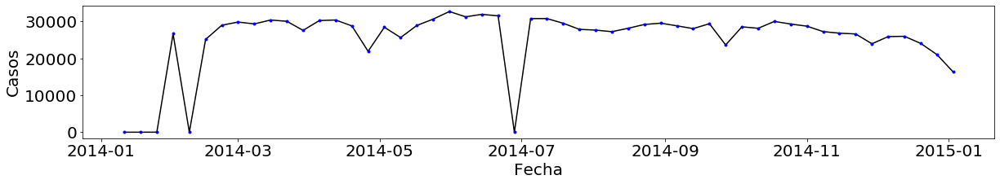

k70 - https://es.wikipedia.org/wiki/enfermedad_alcoholica_del_higado


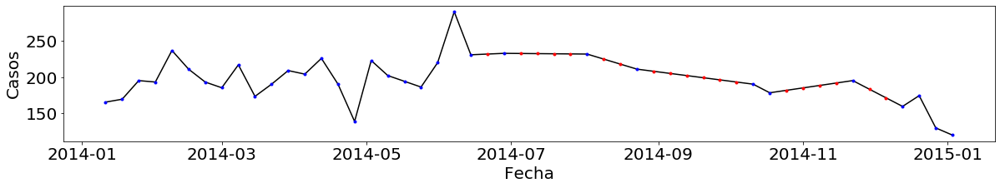

k70.3 - https://es.wikipedia.org/wiki/cirrosis_hepatica


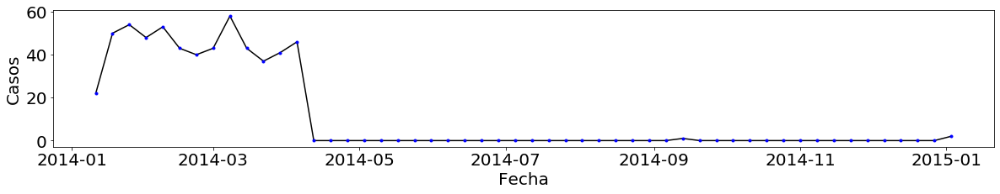

n30 - https://es.wikipedia.org/wiki/infeccion_de_vias_urinarias


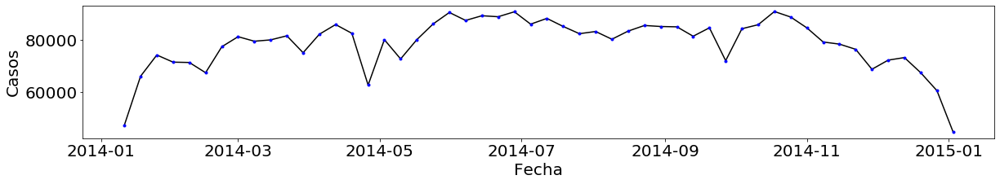

n40 - https://es.wikipedia.org/wiki/hiperplasia_de_prostata


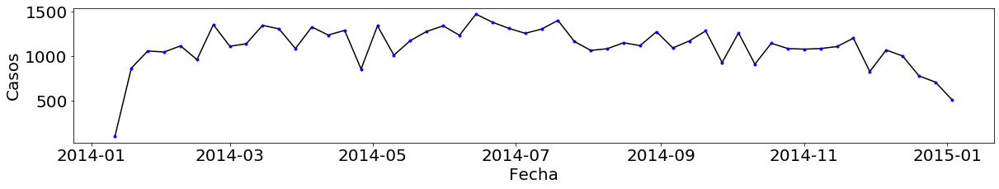

n87.0-n87.1 - https://es.wikipedia.org/wiki/displasia_cervical_leve_y_moderada


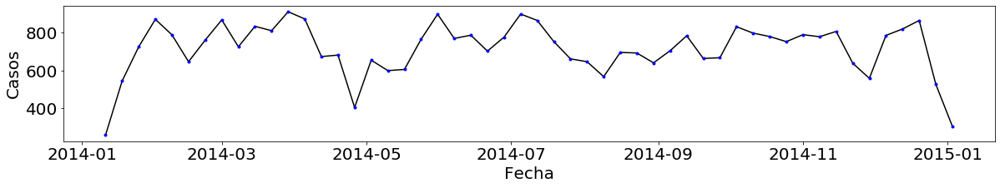

n87.2 - https://es.wikipedia.org/wiki/displasia_cervical_severa_y_cacu_in_situ


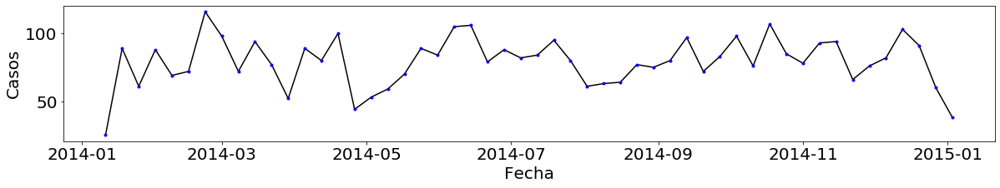

o24.4 - https://es.wikipedia.org/wiki/diabetes_mellitus_en_el_embarazo


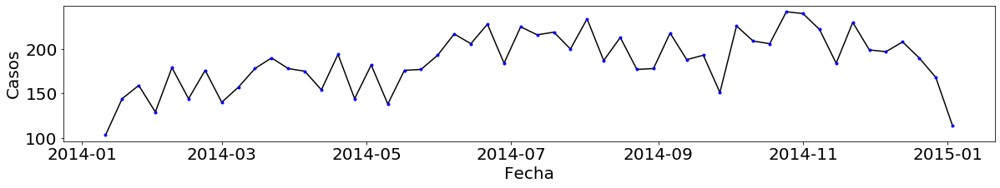

p35.0 - https://es.wikipedia.org/wiki/rubeola_congenita


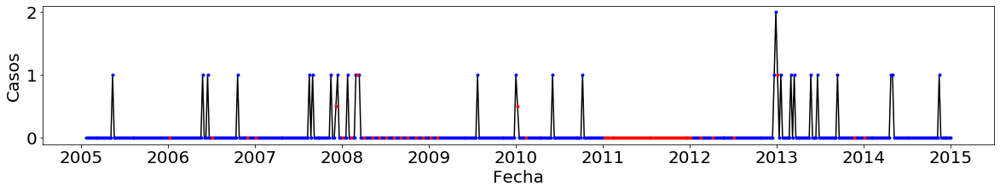

q00 - https://es.wikipedia.org/wiki/anencefalia


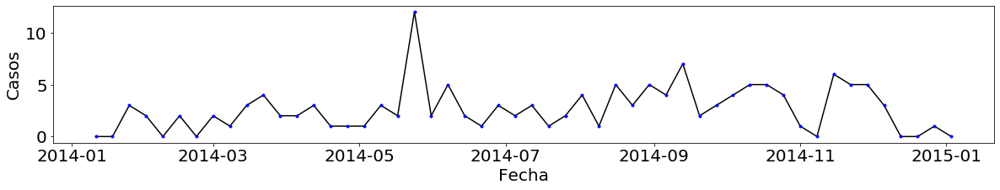

q01 - https://es.wikipedia.org/wiki/encefalocele


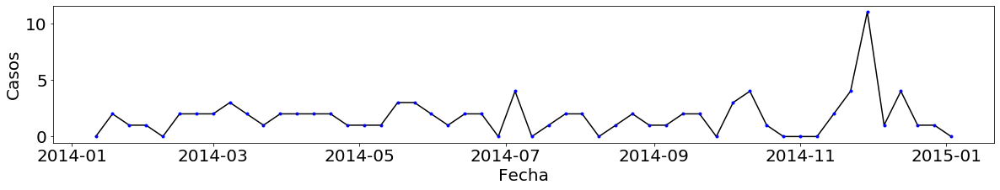

q05 - https://es.wikipedia.org/wiki/espina_bifida


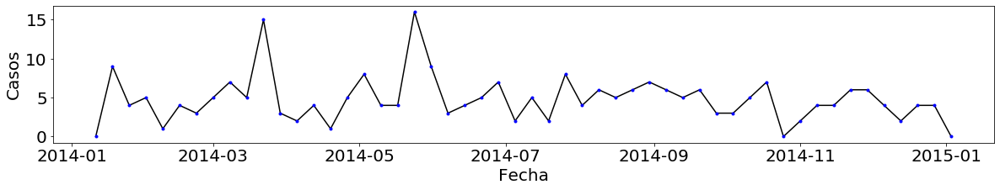

q35-q37 - https://es.wikipedia.org/wiki/labio_y_paladar_hendido


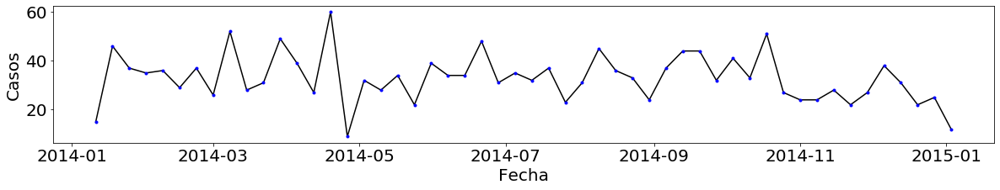

r50 - https://es.wikipedia.org/wiki/sindrome_febril


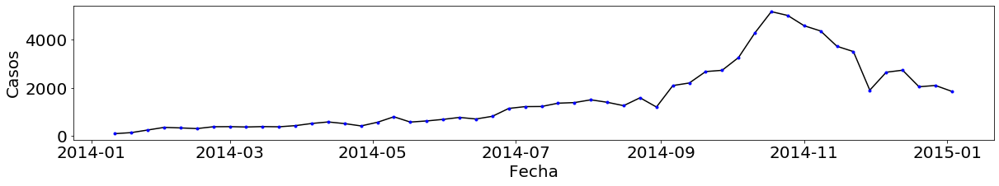

sc_contacto traumatico con avispas - https://es.wikipedia.org/wiki/contacto_traumatico_con_avispas


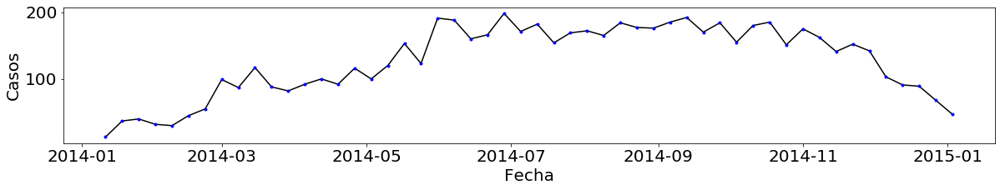

sc_edema proteinuria y otros transt. hipertensivos en el embarazo - https://es.wikipedia.org/wiki/edema_proteinuria_y_otros_transt._hipertensivos_en_el_embarazo


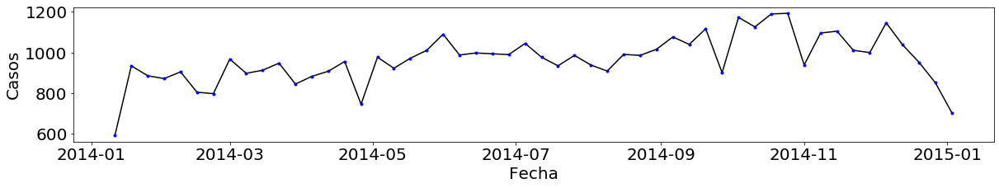

t20-t32 - https://es.wikipedia.org/wiki/quemaduras


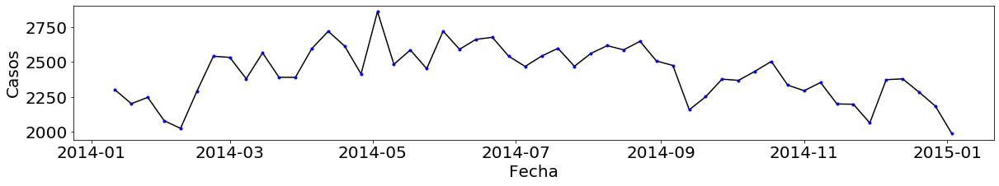

t58 - https://es.wikipedia.org/wiki/intoxicacion_por_monoxido_de_carbono


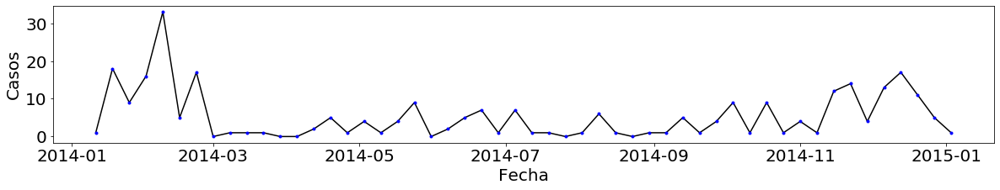

t60 - https://es.wikipedia.org/wiki/intoxicacion_por_plaguicidas


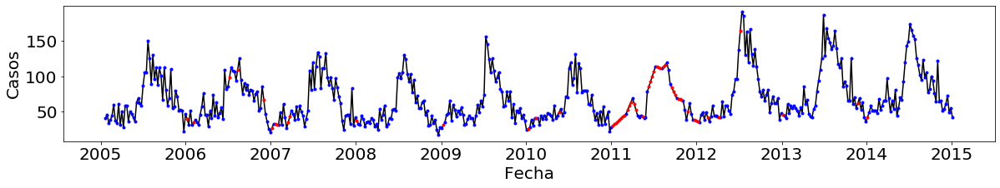

t63 excepto t63.2 - https://es.wikipedia.org/wiki/intoxicacion_por_animales_venenosos


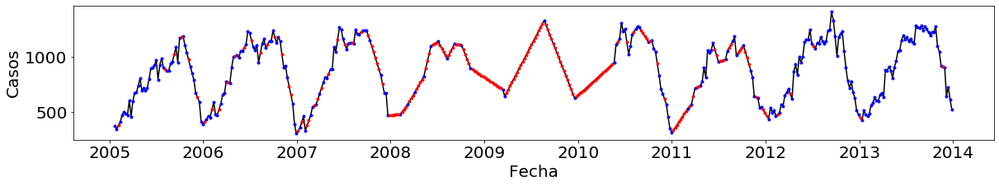

t63.2 - https://es.wikipedia.org/wiki/intoxicacion_por_veneno_de_escorpion


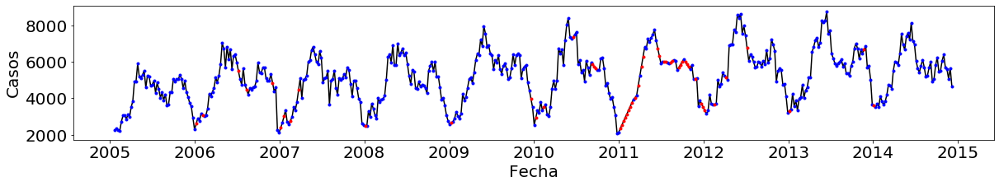

t63x21 - https://es.wikipedia.org/wiki/intoxicacion_por_ponzona_de_animales


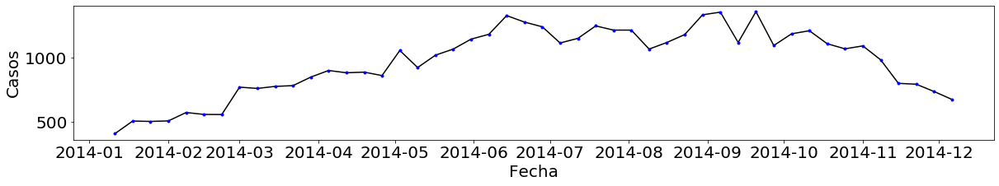

t67 - https://es.wikipedia.org/wiki/efectos_del_calor_y_de_la_luz


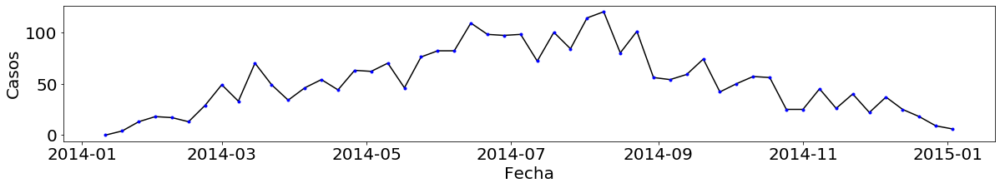

t68 - https://es.wikipedia.org/wiki/hipotermia


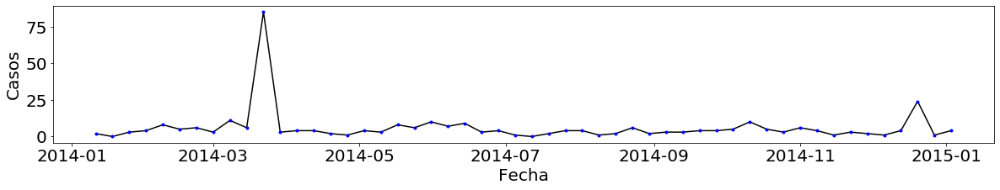

u97 - https://es.wikipedia.org/wiki/enfermedad_febril_exantematica


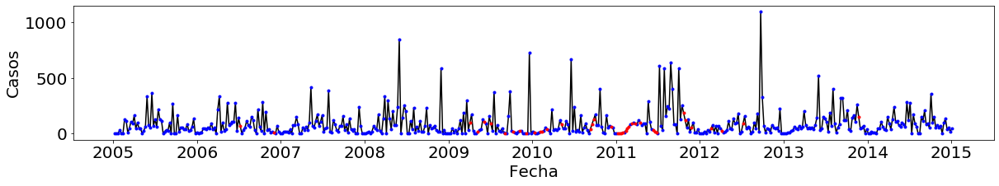

u98 - https://es.wikipedia.org/wiki/paralisis_flacida_aguda


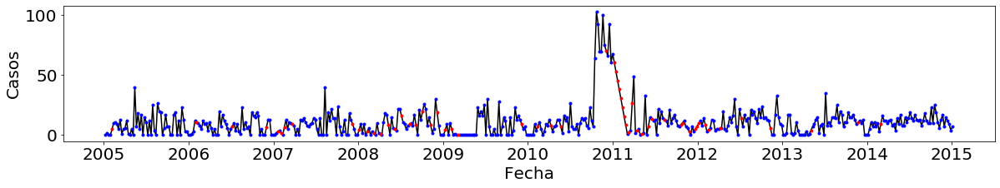

u99 - https://es.wikipedia.org/wiki/sindrome_coqueluchoide


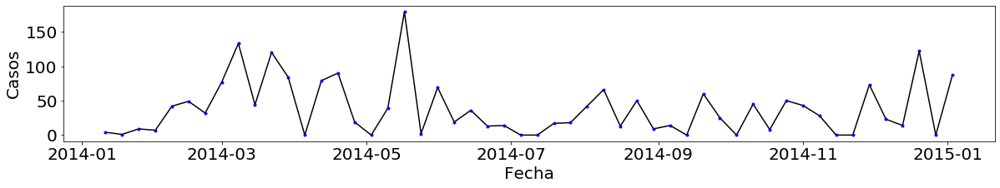

v01-v09 - https://es.wikipedia.org/wiki/peaton_lesionado_en_accidente_de_transporte


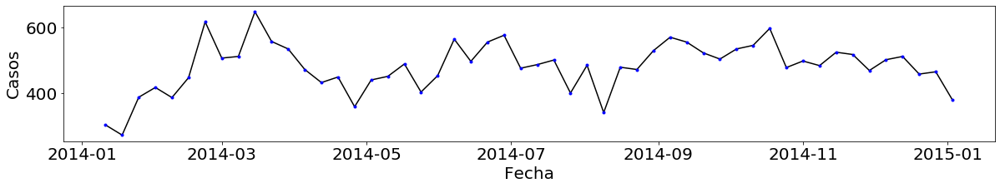

v20-v29 v40-v79 - https://es.wikipedia.org/wiki/accidente_de_transporte_en_vehiculos_con_motor


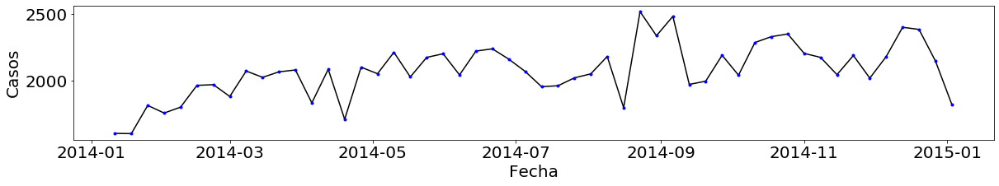

w32-w34 - https://es.wikipedia.org/wiki/herida_por_arma_de_fuego_y_punzocortantes


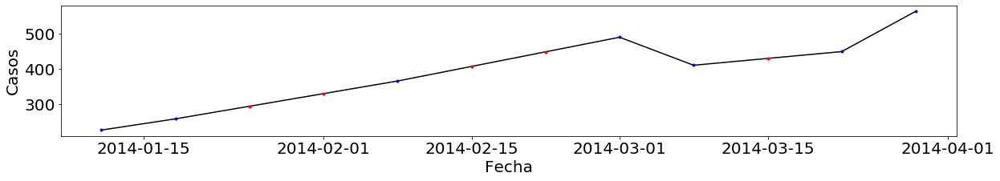

w54 - https://es.wikipedia.org/wiki/mordeduras_por_perro


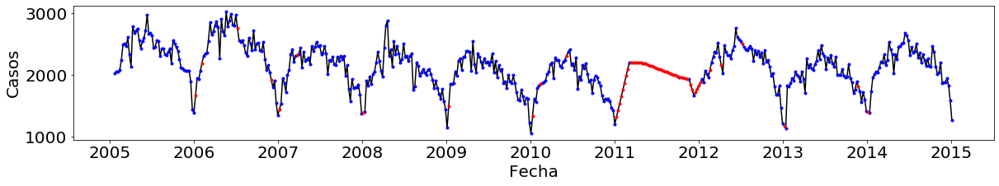

w55 - https://es.wikipedia.org/wiki/mordeduras_por_otros_mamiferos


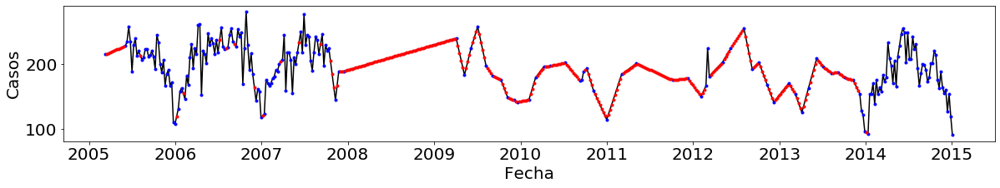

x20 - https://es.wikipedia.org/wiki/mordeduras_por_serpiente


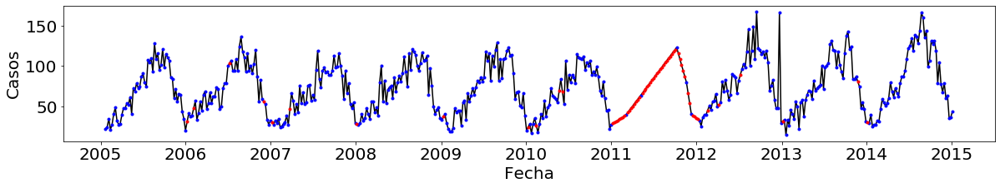

y07.0-y07.2 - https://es.wikipedia.org/wiki/lesiones_por_violencia_intrafamiliar


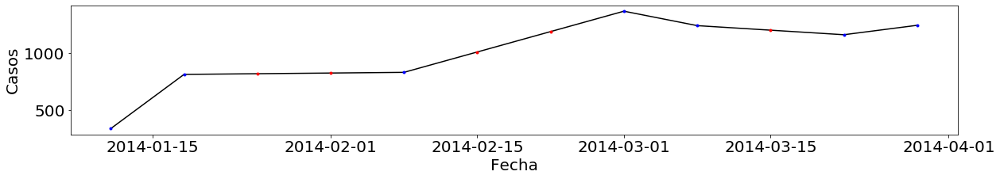

y58 - https://es.wikipedia.org/wiki/efectos_adversos_temporalmente_asociados_a_vacunas


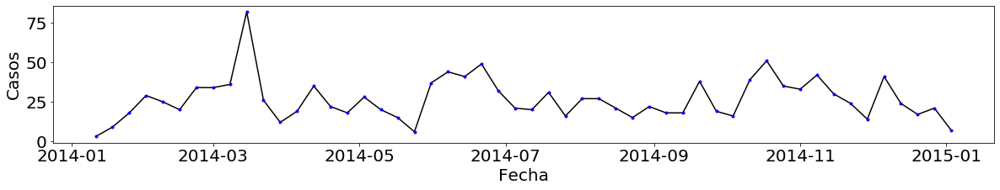

y95 - https://es.wikipedia.org/wiki/afeccion_nosocomial


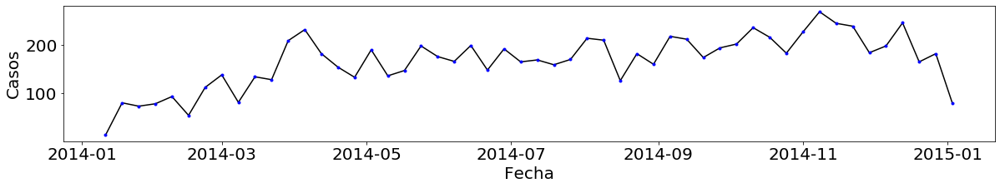

z21 - https://es.wikipedia.org/wiki/infeccion_asintomatica_por_vih


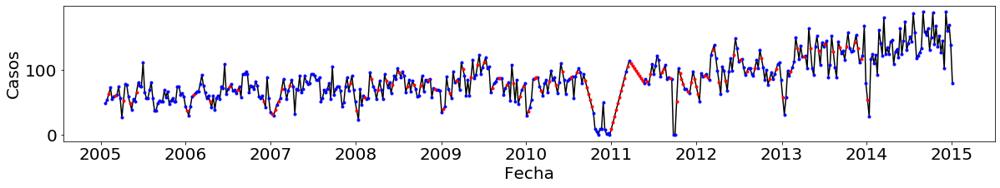

In [26]:
# https://machinelearningmastery.com/time-series-data-visualization-with-python/

cie = df.groupby('cie')

import matplotlib.pyplot as plt
import numpy as np
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

plt.rcParams.update({'font.size': 20})

debug = True

df_copy = pd.DataFrame()
for name, group in cie:
    group = group.set_index(pd.DatetimeIndex(group.se))
    r = pd.date_range(start=np.min(group.se), end=np.max(group.se), freq='W-SAT')
    # https://stackoverflow.com/a/638443/3113008
    if debug:
        plt.figure(figsize=(20, 3))
        plt.plot(group.index, group.casos, 'k')

    try:
        # https://stackoverflow.com/a/19324591
        group = group.reindex(r)
        group.se = r
    
        t = group.iloc[0, 0].replace(' ', '_')
        print('{0} - https://es.wikipedia.org/wiki/{1}'.format(name, t))

        t = group.sample(1)
        # https://medium.com/@drnesr/filling-gaps-of-a-time-series-using-python-d4bfddd8c460
        group = group.assign(inter=group.casos.interpolate(method='time'))
        for index, row in group.iterrows():
            if not np.isnan(group.loc[index, 'casos']):
                group.loc[index, 'inter'] = np.nan
            else:
                group.loc[index, 'cie'] = list(t.cie)
                group.loc[index, 'enfermedad'] = list(t.enfermedad)

        if debug:
            # https://stackoverflow.com/a/19079248/3113008
            plt.plot(group.index, group.casos, '.b')
            plt.plot(group.index, group.inter, '.r')
            plt.xlabel("Fecha")
            plt.ylabel("Casos")
        
        group = group.assign(inter=group.casos.interpolate(method='time'))
        
        df_copy = df_copy.append(group)
        
    except:
        print('Error {0} - https://es.wikipedia.org/wiki/{1}'.format(name, t))
    
    if debug:
        if name == 'a03' or name == 'a02' or name == 'w55':
            plt.savefig(name + '.eps', format='eps')
        plt.show()

In [8]:
print(df_copy[df_copy.casos.isna()])

cie_copy = df_copy.groupby('cie')

df_copy

           enfermedad  casos  cie         se  inter
2006-07-08        NaN    NaN  NaN 2006-07-08    0.0
2006-12-02        NaN    NaN  NaN 2006-12-02    0.0
2007-12-08        NaN    NaN  NaN 2007-12-08    0.0
2008-01-05        NaN    NaN  NaN 2008-01-05    0.0
2008-02-09        NaN    NaN  NaN 2008-02-09    0.0
...               ...    ...  ...        ...    ...
2013-10-05        NaN    NaN  NaN 2013-10-05  136.0
2013-11-09        NaN    NaN  NaN 2013-11-09  141.5
2013-11-23        NaN    NaN  NaN 2013-11-23  133.0
2013-12-07        NaN    NaN  NaN 2013-12-07  117.0
2014-01-04        NaN    NaN  NaN 2014-01-04   54.0

[4390 rows x 5 columns]


,enfermedad,casos,cie,se,inter
2005-01-08,colera,0.0,a00,2005-01-08,0.0
2005-01-15,colera,0.0,a00,2005-01-15,0.0
2005-01-22,colera,0.0,a00,2005-01-22,0.0
2005-01-29,colera,0.0,a00,2005-01-29,0.0
2005-02-05,colera,0.0,a00,2005-02-05,0.0
...,...,...,...,...,...
2014-12-06,infeccion asintomatica por vih,189.0,z21,2014-12-06,189.0
2014-12-13,infeccion asintomatica por vih,160.0,z21,2014-12-13,160.0
2014-12-20,infeccion asintomatica por vih,169.0,z21,2014-12-20,169.0
2014-12-27,infeccion asintomatica por vih,138.0,z21,2014-12-27,138.0


In [9]:
print(cie_copy.agg('count').sum())

diezAnios = cie_copy.filter(lambda x: x.index.min() < date(2006,1,1) and x.index.max() > date(2014,11,30))

diezAniosGrupos = diezAnios.groupby('cie')

print(len(diezAniosGrupos))

cieG = diezAnios.groupby(diezAnios.cie.str[0])

for n, g in cieG:
    print(n)
    print(g.cie.unique())
    print(g.enfermedad.unique())

enfermedad    26635
casos         23659
se            26635
inter         26635
dtype: int64
41
a
['a00' 'a01-a03' 'a01.0' 'a01.1-a02' 'a03' 'a05' 'a15-a16' 'a17.0' 'a23'
 'a27' 'a33' 'a34' 'a37' 'a38' 'a39.0' 'a50' 'a51-a53' 'a54.0-a54.2' 'a90']
['colera' 'enfermedades infecciosas intestinales' 'fiebre tifoidea'
 'paratifoidea' 'fiebre paratifoidea' 'shigelosis'
 'intoxicacion alimentaria bacteriana' 'tuberculosis respiratoria'
 'meningitis tuberculosa' 'brucelosis' 'leptospirosis' 'tetanos neonatal'
 'tetanos' 'tos ferina' 'escarlatina' 'meningitis meningococica'
 'sifilis congenita' 'sifilis adquirida'
 'infeccion gonococica genitourinaria' 'dengue clasico']
b
['b01' 'b06' 'b15' 'b16' 'b17.1' 'b20-b24' 'b26' 'b50' 'b51']
['varicela' 'rubeola' 'hepatitis virica a' 'hepatitis virica b'
 'hepatitis virica c' 'sida' 'parotiditis infecciosa'
 'paludismo por p. falciparum' 'paludismo por p. vivax']
g
['g00-g03']
['meningitis']
i
['i00-i02']
['fiebre reumatica aguda']
j
['j00-j06' 'j12']
[

a00 - https://es.wikipedia.org/wiki/colera
pendiente significativa


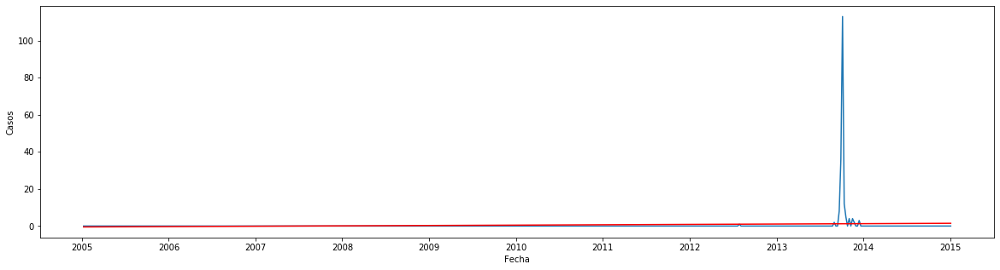

a01-a03 - https://es.wikipedia.org/wiki/enfermedades_infecciosas_intestinales
pendiente significativa


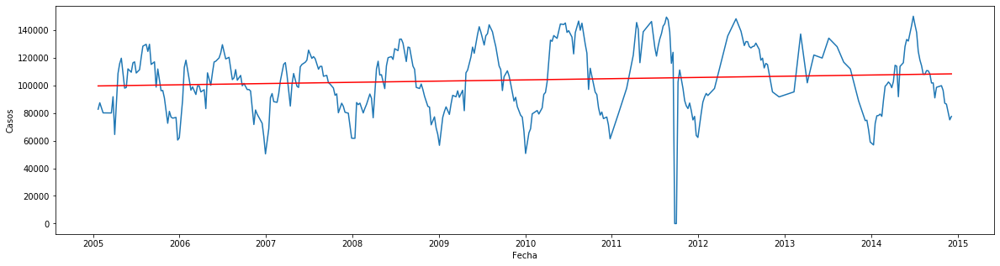

a01.0 - https://es.wikipedia.org/wiki/fiebre_tifoidea
pendiente significativa


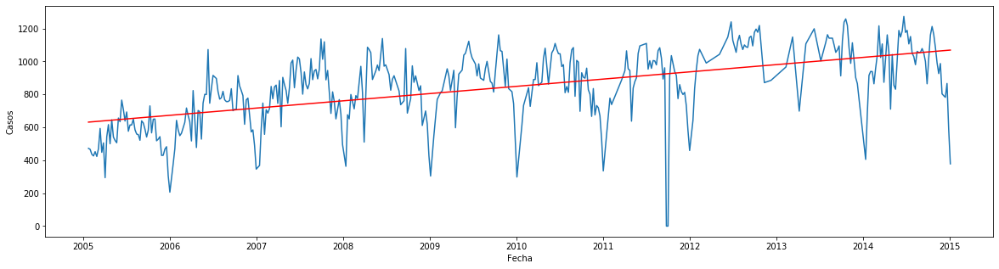

a01.1-a02 - https://es.wikipedia.org/wiki/paratifoidea
pendiente significativa


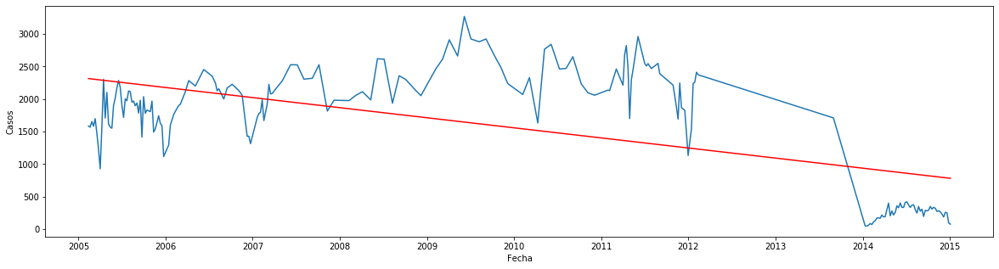

a03 - https://es.wikipedia.org/wiki/shigelosis
pendiente significativa


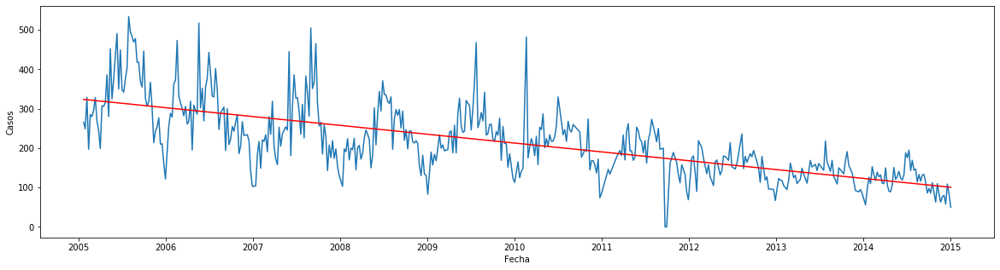

a05 - https://es.wikipedia.org/wiki/intoxicacion_alimentaria_bacteriana
pendiente significativa


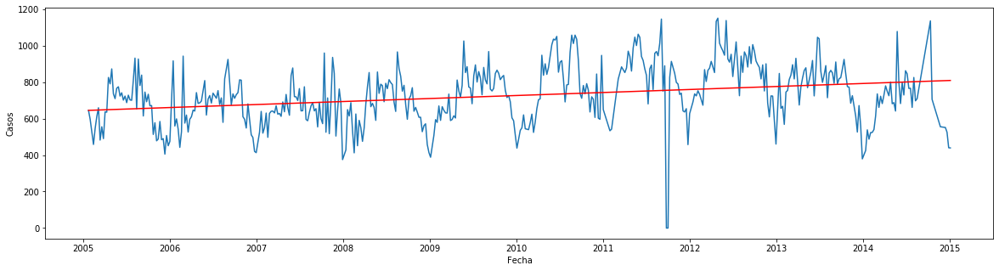

a15-a16 - https://es.wikipedia.org/wiki/tuberculosis_respiratoria
pendiente significativa


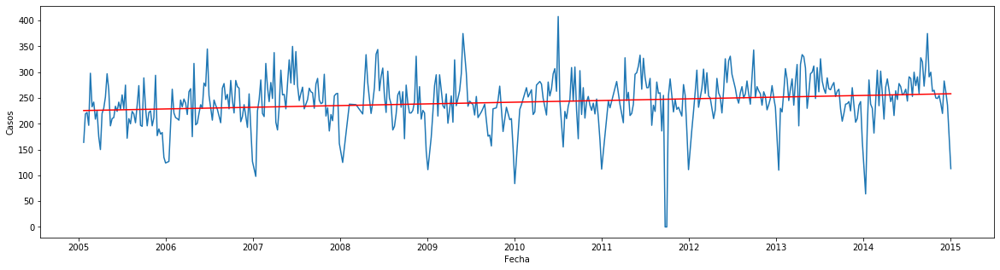

a17.0 - https://es.wikipedia.org/wiki/meningitis_tuberculosa
pendiente significativa


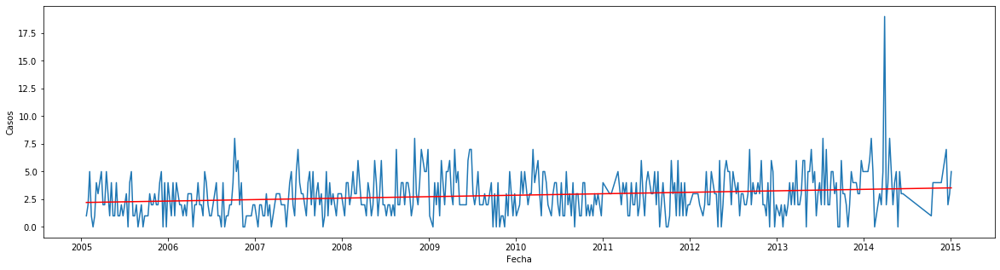

a23 - https://es.wikipedia.org/wiki/brucelosis
pendiente significativa


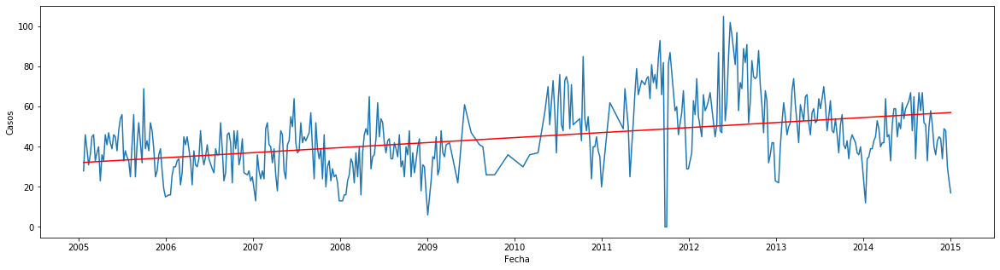

a27 - https://es.wikipedia.org/wiki/leptospirosis
pendiente significativa


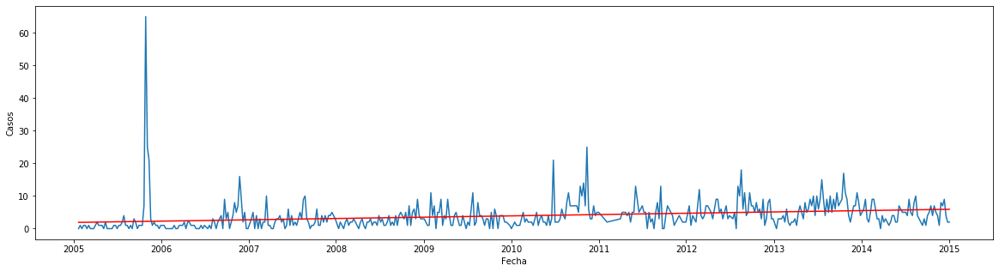

a33 - https://es.wikipedia.org/wiki/tetanos_neonatal
pendiente no significativa


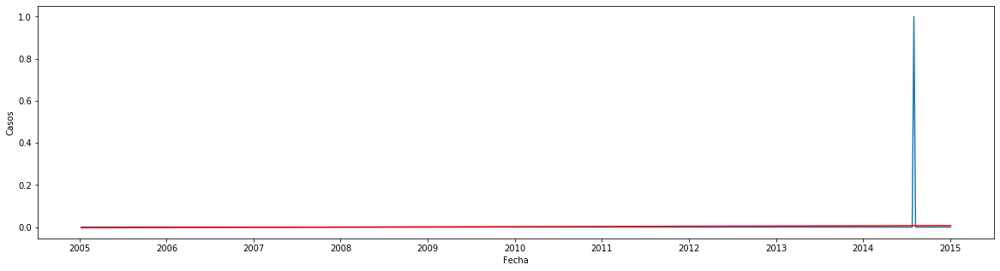

a34 - https://es.wikipedia.org/wiki/tetanos
pendiente significativa


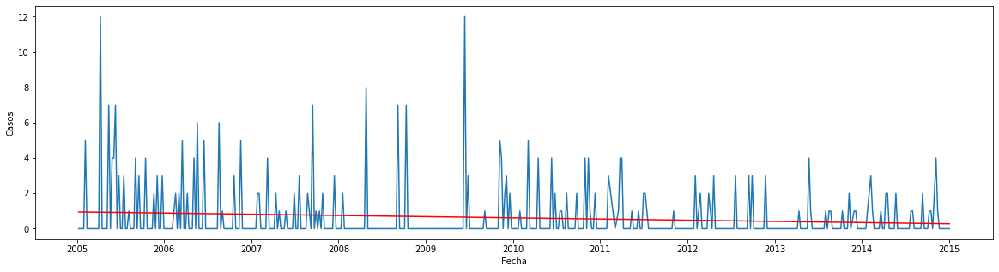

a37 - https://es.wikipedia.org/wiki/tos_ferina
pendiente significativa


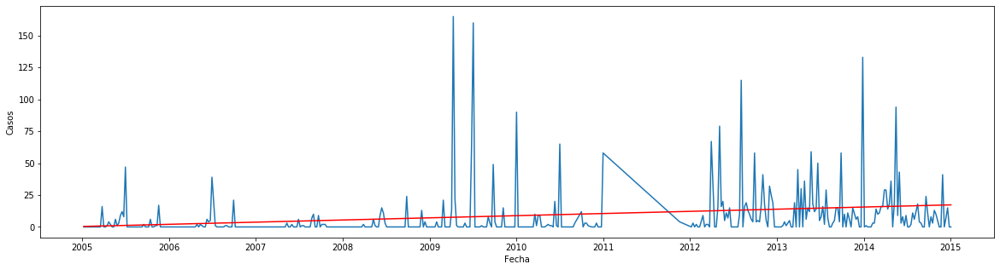

a38 - https://es.wikipedia.org/wiki/escarlatina
pendiente significativa


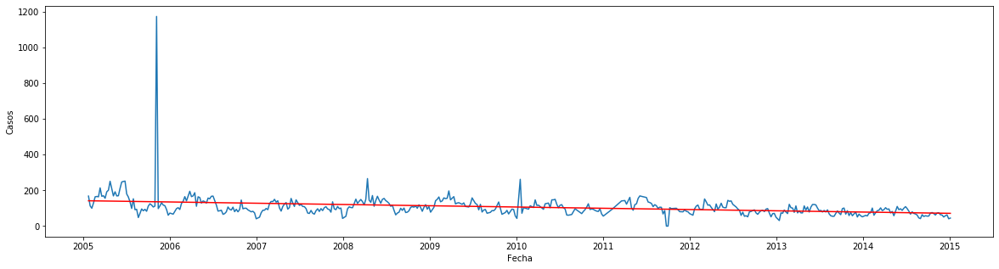

a39.0 - https://es.wikipedia.org/wiki/meningitis_meningococica
pendiente significativa


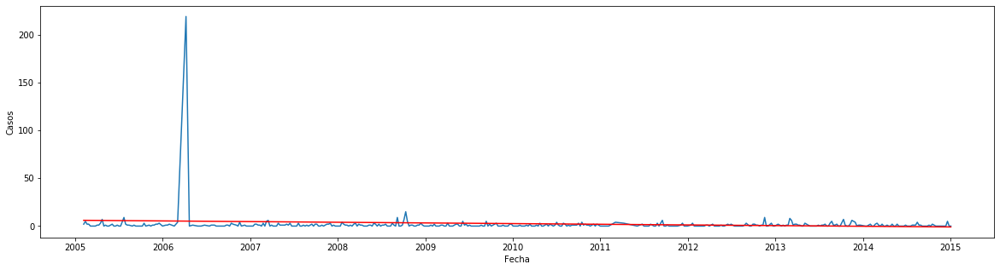

a50 - https://es.wikipedia.org/wiki/sifilis_congenita
pendiente no significativa


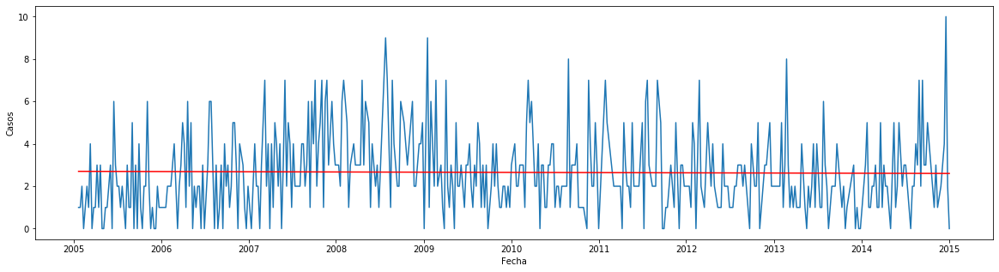

a51-a53 - https://es.wikipedia.org/wiki/sifilis_adquirida
pendiente significativa


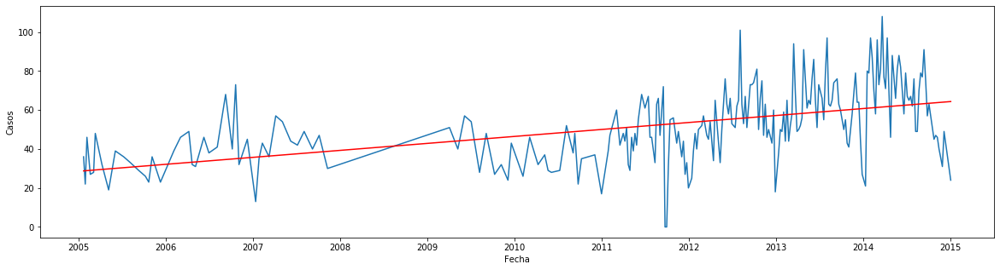

a54.0-a54.2 - https://es.wikipedia.org/wiki/infeccion_gonococica_genitourinaria
pendiente significativa


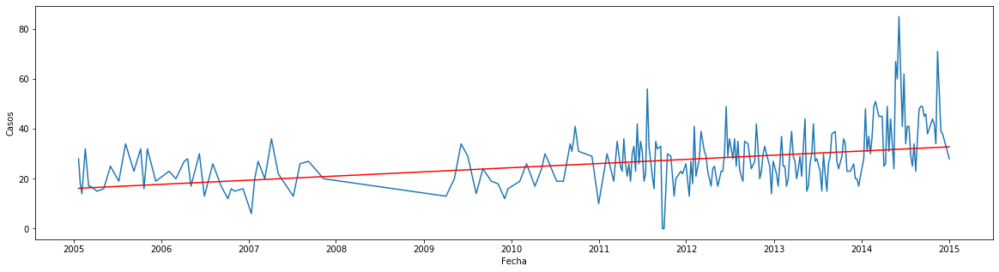

a90 - https://es.wikipedia.org/wiki/dengue_clasico
pendiente significativa


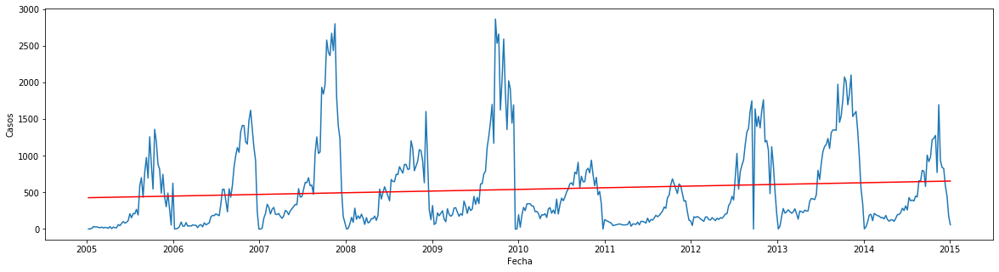

b01 - https://es.wikipedia.org/wiki/varicela
pendiente significativa


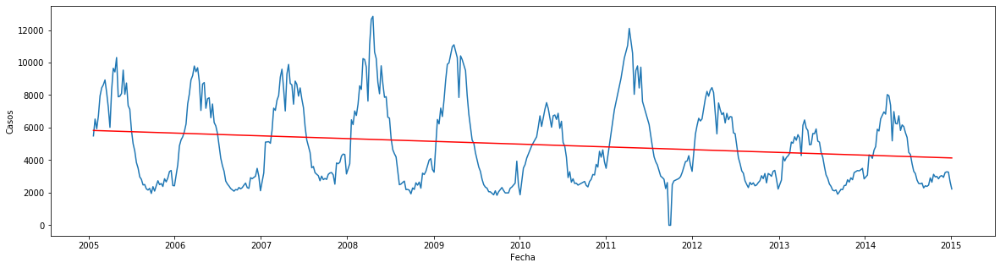

b06 - https://es.wikipedia.org/wiki/rubeola
pendiente significativa


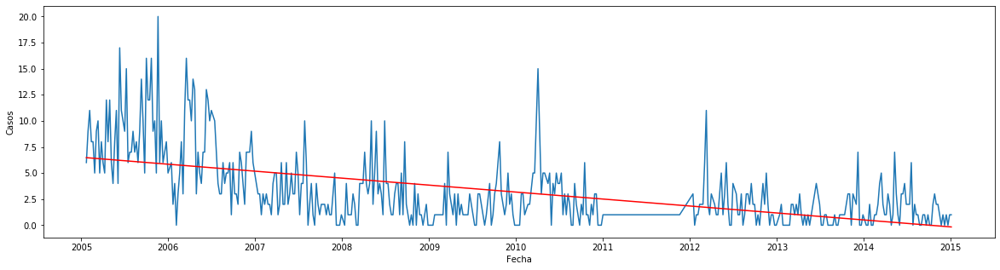

b15 - https://es.wikipedia.org/wiki/hepatitis_virica_a
pendiente no significativa


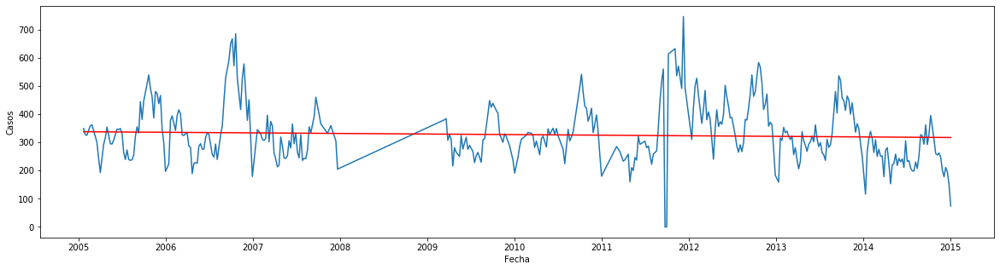

b16 - https://es.wikipedia.org/wiki/hepatitis_virica_b
pendiente significativa


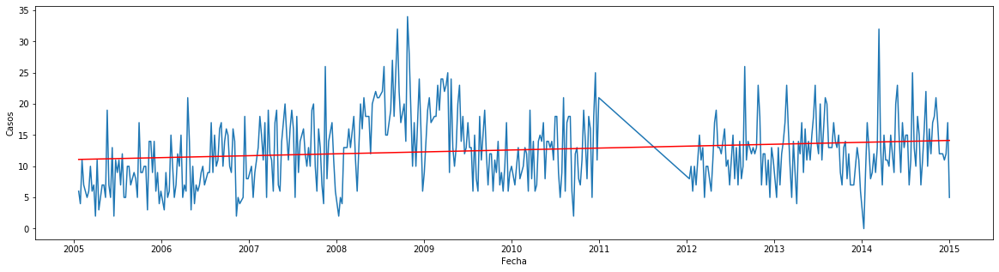

b17.1 - https://es.wikipedia.org/wiki/hepatitis_virica_c
pendiente significativa


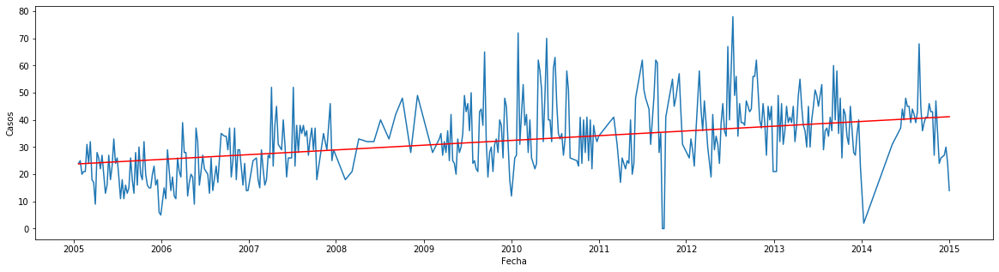

b20-b24 - https://es.wikipedia.org/wiki/sida
pendiente significativa


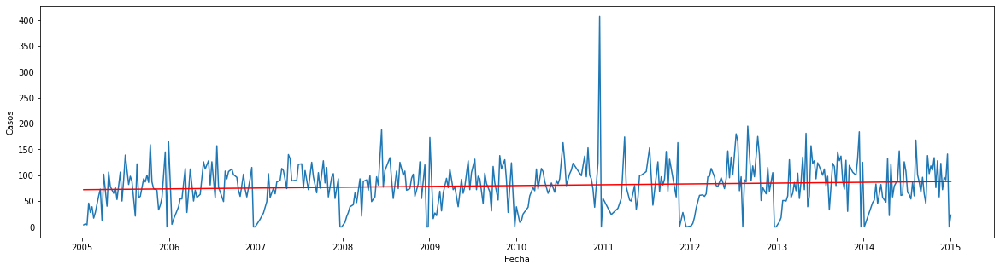

b26 - https://es.wikipedia.org/wiki/parotiditis_infecciosa
pendiente significativa


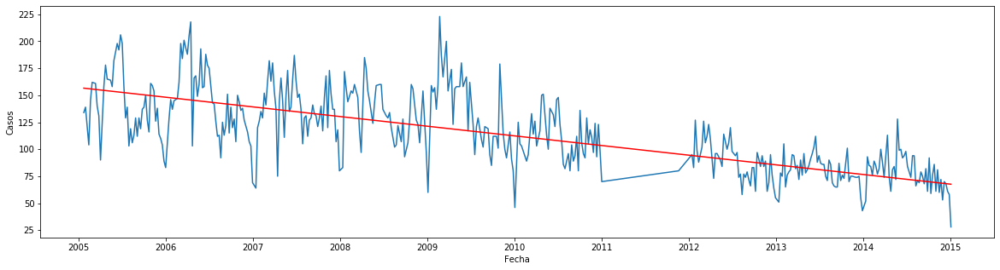

b50 - https://es.wikipedia.org/wiki/paludismo_por_p._falciparum
pendiente significativa


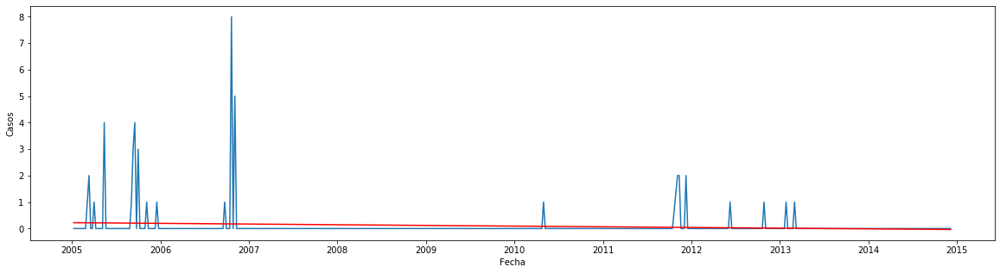

b51 - https://es.wikipedia.org/wiki/paludismo_por_p._vivax
pendiente significativa


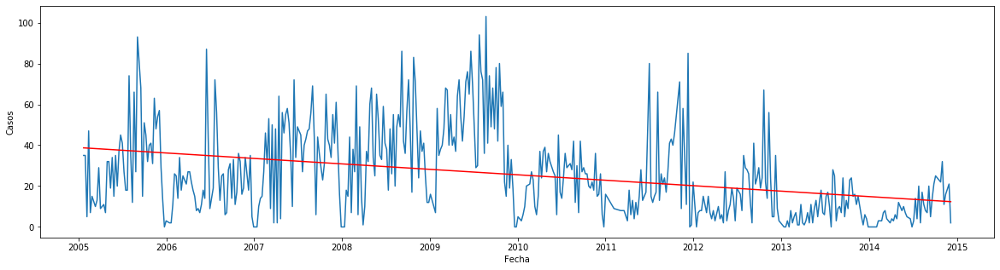

g00-g03 - https://es.wikipedia.org/wiki/meningitis
pendiente no significativa


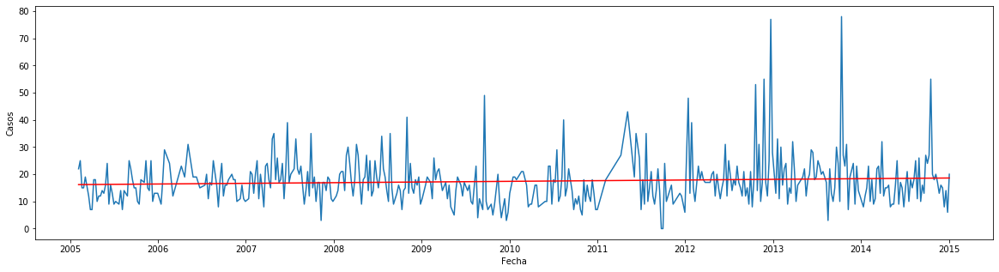

i00-i02 - https://es.wikipedia.org/wiki/fiebre_reumatica_aguda
pendiente significativa


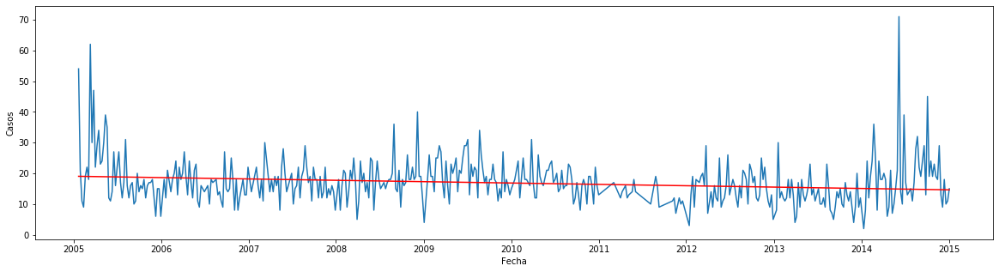

j00-j06 - https://es.wikipedia.org/wiki/infecciones_respiratorias_agudas
pendiente significativa


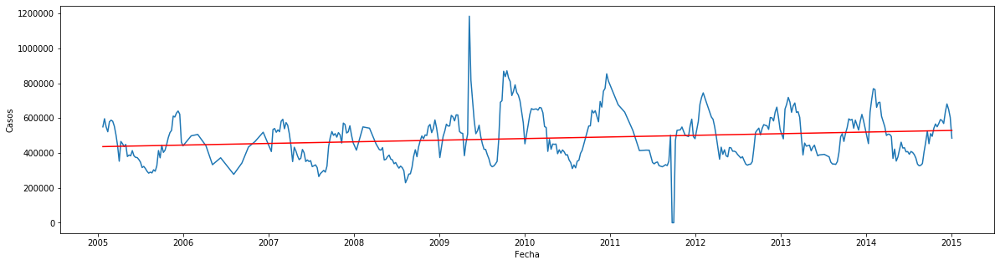

j12 - https://es.wikipedia.org/wiki/neumonias_y_bronconeumonias
pendiente significativa


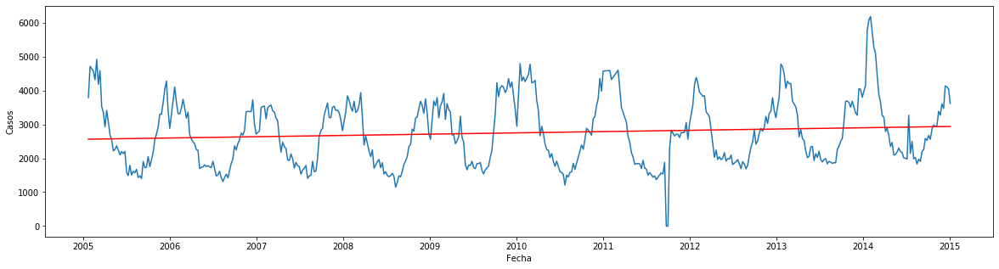

p35.0 - https://es.wikipedia.org/wiki/rubeola_congenita
pendiente no significativa


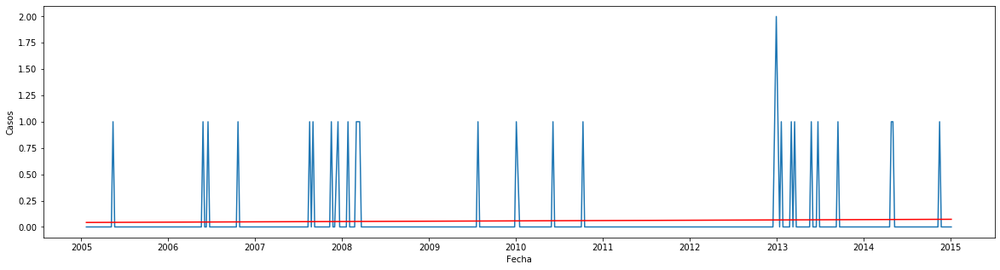

t60 - https://es.wikipedia.org/wiki/intoxicacion_por_plaguicidas
pendiente significativa


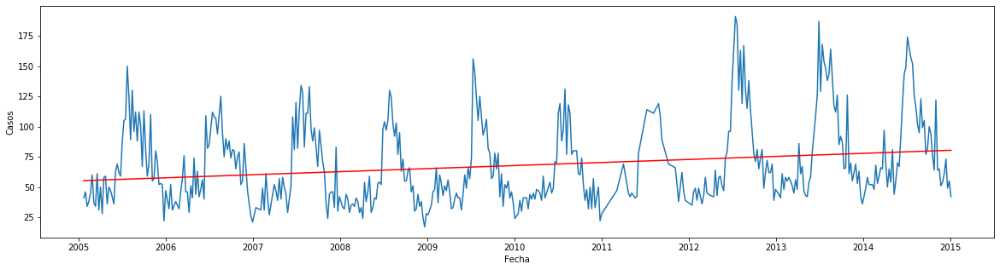

t63.2 - https://es.wikipedia.org/wiki/intoxicacion_por_veneno_de_escorpion
pendiente significativa


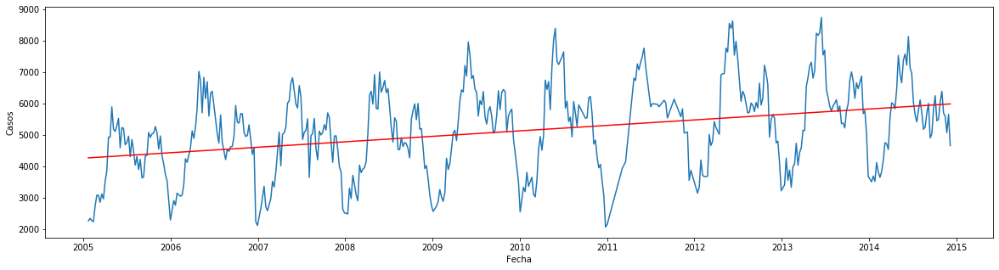

u97 - https://es.wikipedia.org/wiki/enfermedad_febril_exantematica
pendiente no significativa


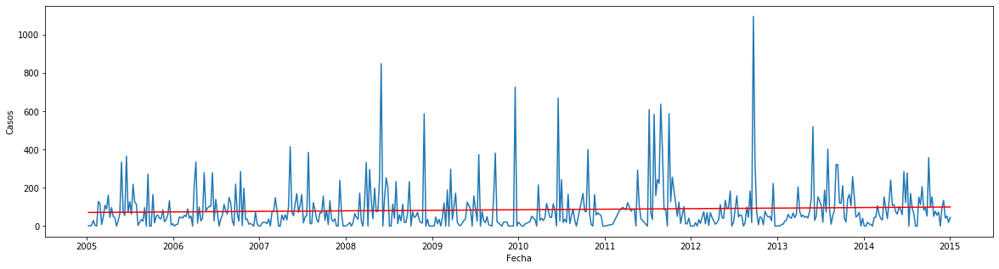

u98 - https://es.wikipedia.org/wiki/paralisis_flacida_aguda
pendiente significativa


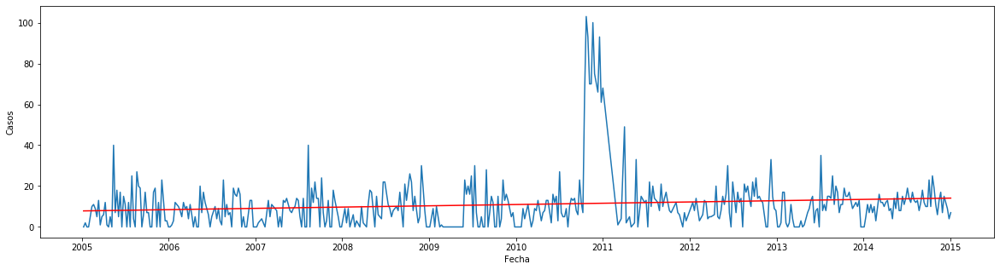

w54 - https://es.wikipedia.org/wiki/mordeduras_por_perro
pendiente significativa


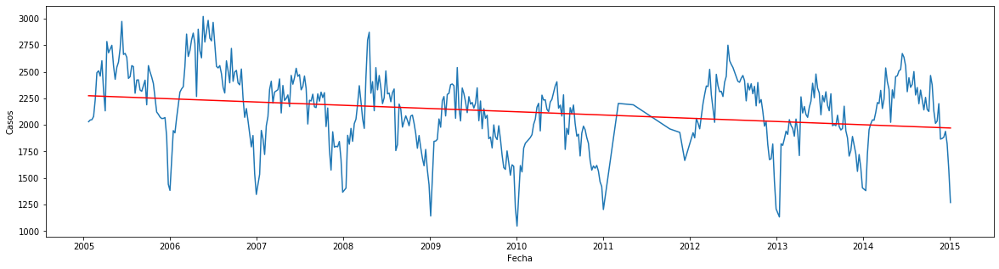

w55 - https://es.wikipedia.org/wiki/mordeduras_por_otros_mamiferos
pendiente significativa


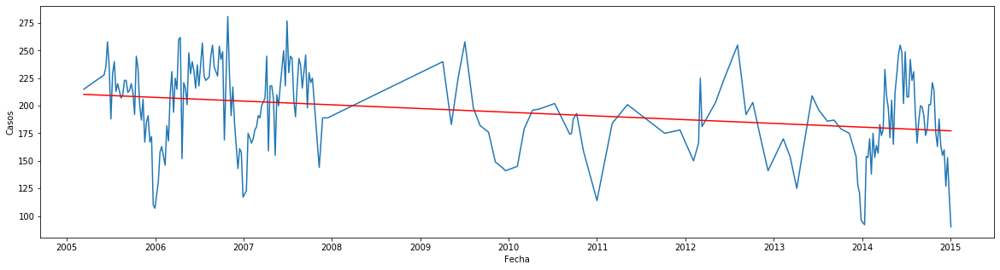

x20 - https://es.wikipedia.org/wiki/mordeduras_por_serpiente
pendiente significativa


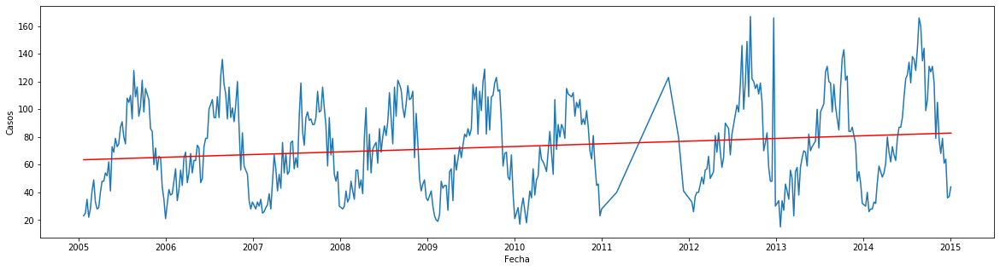

z21 - https://es.wikipedia.org/wiki/infeccion_asintomatica_por_vih
pendiente significativa


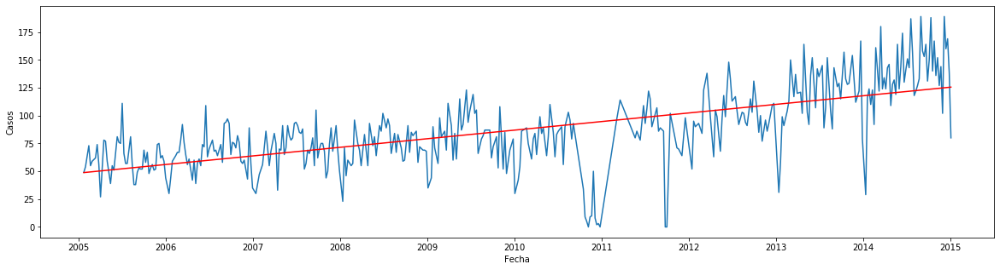

In [10]:
from scipy import stats

cieM = pd.DataFrame()
for name, group in diezAniosGrupos:
    
    a, b, r, p, e = stats.linregress(group.index.astype(int), group.inter)
    
    t = group.iloc[0, 0].replace(' ', '_')
    print('{0} - https://es.wikipedia.org/wiki/{1}'.format(name, t))
    print("pendiente {:s}significativa".format("no " if p >= 0.05 else ""))
    # https://stackoverflow.com/a/638443/3113008
    if debug:
        plt.figure(figsize=(20, 5))
        # https://stackoverflow.com/a/19079248/3113008
        plt.plot(group.index, group.inter)
        plt.plot(group.index, (a * group.index.astype(int) + b), label = 'y = {:.1f}x + {:.0f}'.format(a, b), color = 'red')
        plt.xlabel("Fecha")
        plt.ylabel("Casos")
        if name == 'j00-j06':
            plt.savefig(name + '.eps', format='eps')
        plt.show()
    
    group = group.drop(columns=['casos', 'inter', 'se'])
    group = group.assign(m=a)
    if p < 0.05:
        cieM = cieM.append(group.sample(1))

cieM = cieM.set_index('cie')

In [11]:
cieM.sort_values(by=['m'], ascending=False)

,enfermedad,m
cie,,
j00-j06,infecciones respiratorias agudas,2.955696e-13
a01-a03,enfermedades infecciosas intestinales,2.801382e-14
t63.2,intoxicacion por veneno de escorpion,5.509529e-15
a01.0,fiebre tifoidea,1.393143e-15
j12,neumonias y bronconeumonias,1.195533e-15
a90,dengue clasico,7.214810e-16
a05,intoxicacion alimentaria bacteriana,5.219741e-16
z21,infeccion asintomatica por vih,2.444598e-16
a51-a53,sifilis adquirida,1.133682e-16


C:\Users\bena8\AppData\Local\Programs\Python\Python37-32\lib\site-packages\pandas\core\indexing.py:494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


a00 - https://es.wikipedia.org/wiki/colera


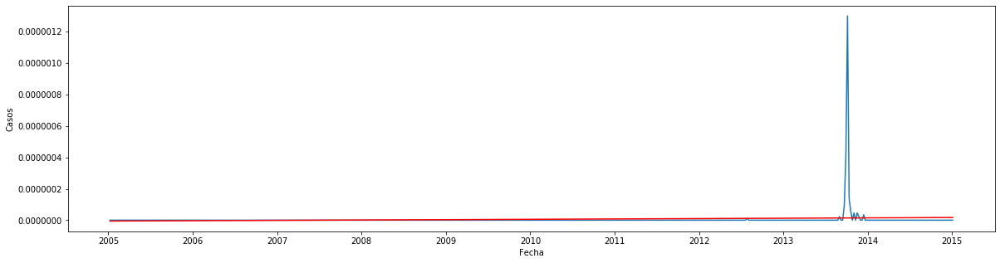

a01-a03 - https://es.wikipedia.org/wiki/enfermedades_infecciosas_intestinales


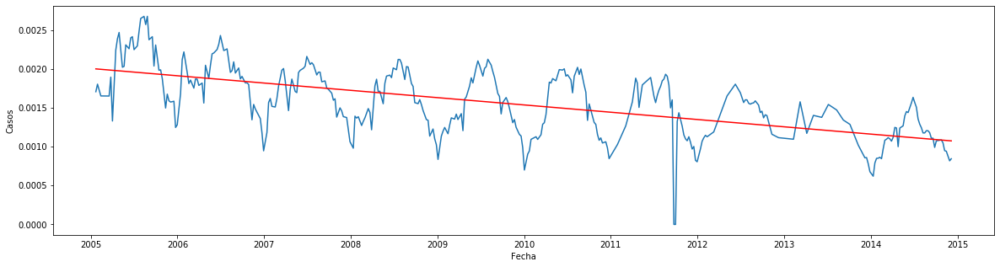

a01.0 - https://es.wikipedia.org/wiki/fiebre_tifoidea


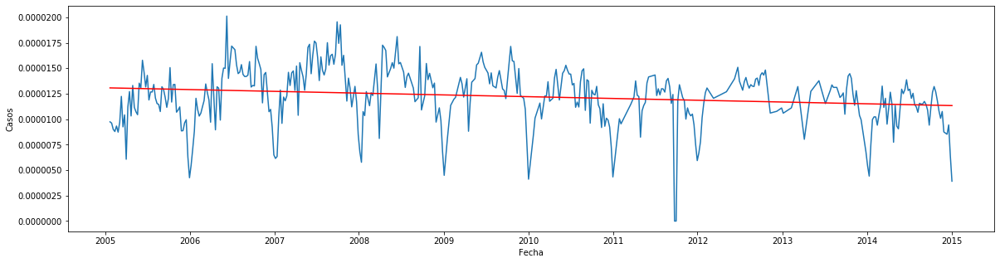

a01.1-a02 - https://es.wikipedia.org/wiki/paratifoidea


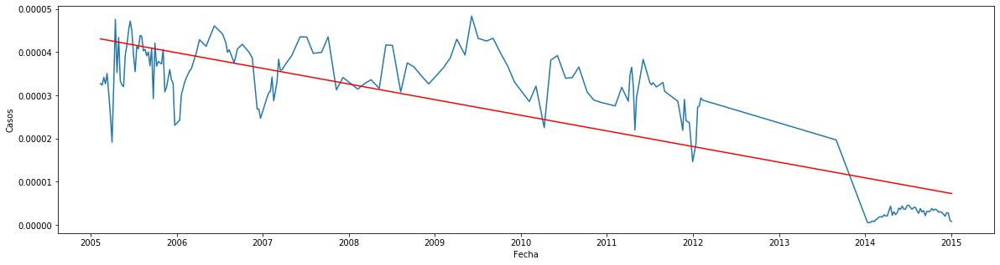

a03 - https://es.wikipedia.org/wiki/shigelosis


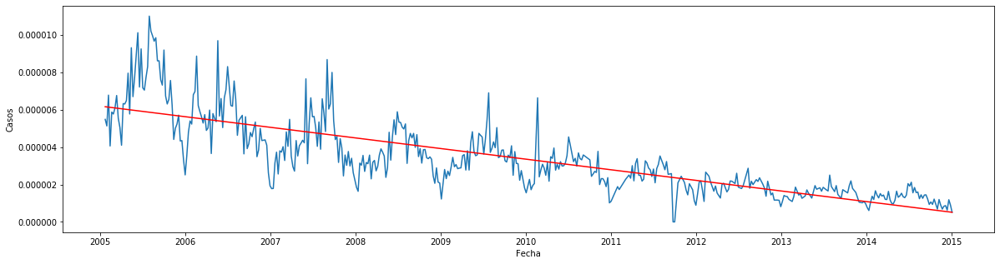

a05 - https://es.wikipedia.org/wiki/intoxicacion_alimentaria_bacteriana


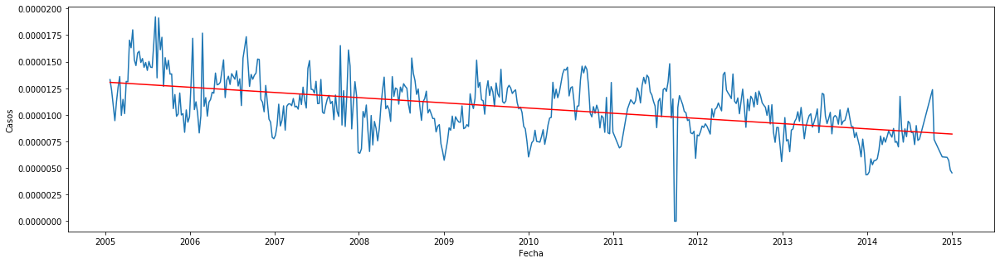

a15-a16 - https://es.wikipedia.org/wiki/tuberculosis_respiratoria


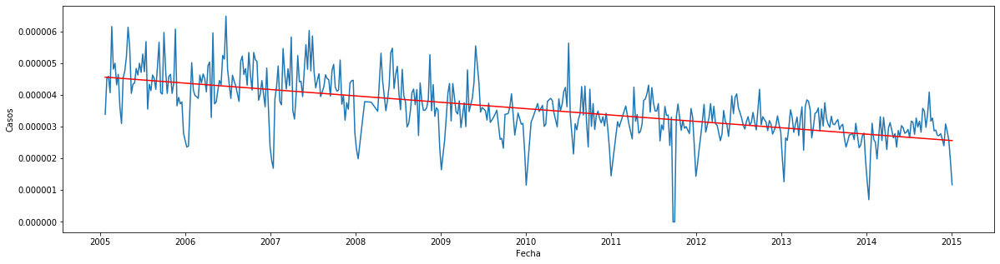

a17.0 - https://es.wikipedia.org/wiki/meningitis_tuberculosa


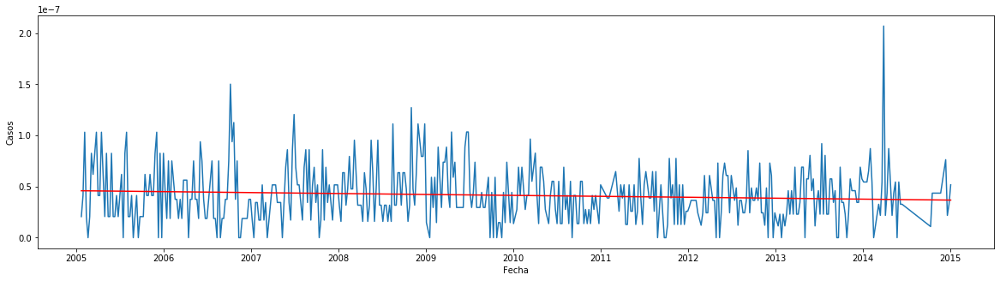

a23 - https://es.wikipedia.org/wiki/brucelosis


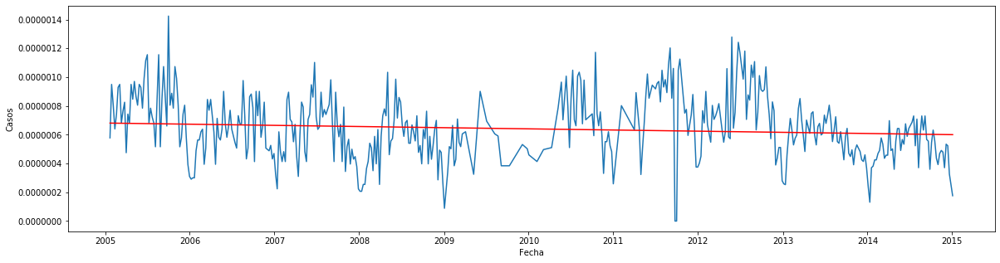

a27 - https://es.wikipedia.org/wiki/leptospirosis


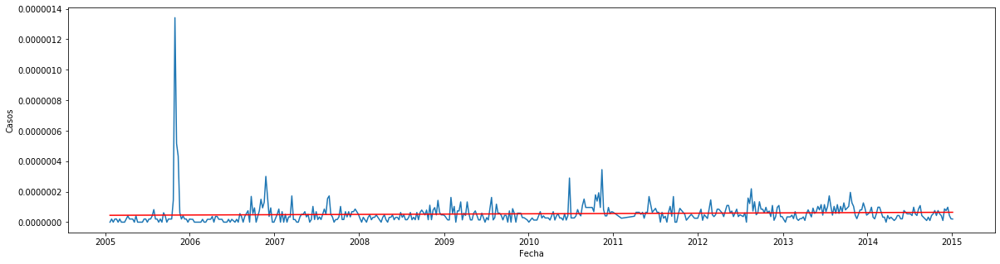

a33 - https://es.wikipedia.org/wiki/tetanos_neonatal


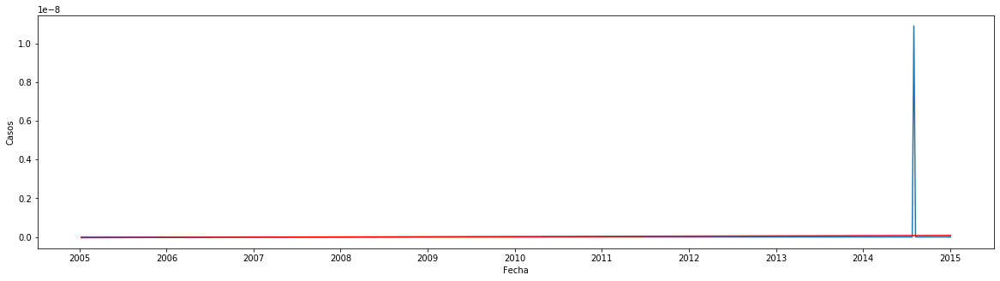

a34 - https://es.wikipedia.org/wiki/tetanos


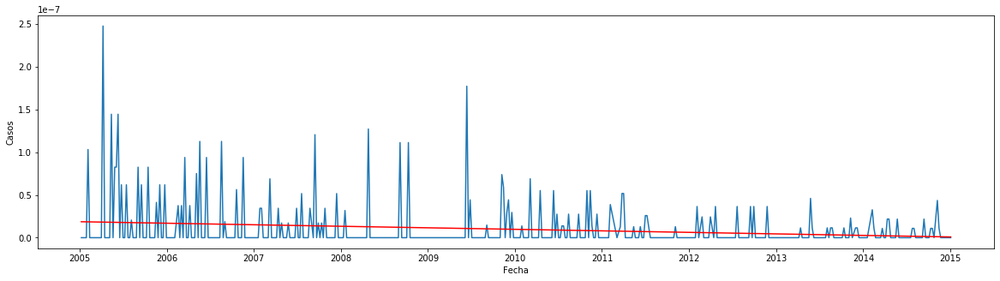

a37 - https://es.wikipedia.org/wiki/tos_ferina


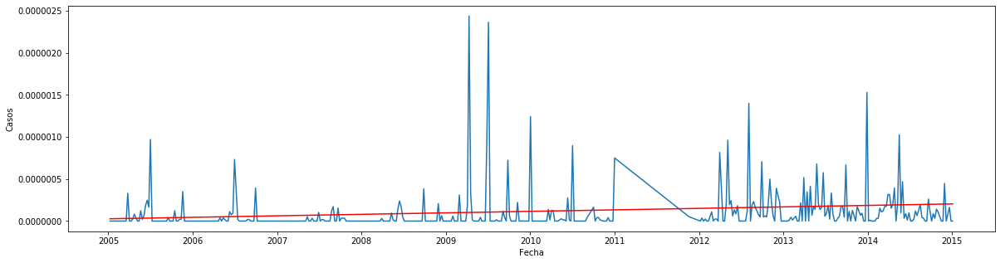

a38 - https://es.wikipedia.org/wiki/escarlatina


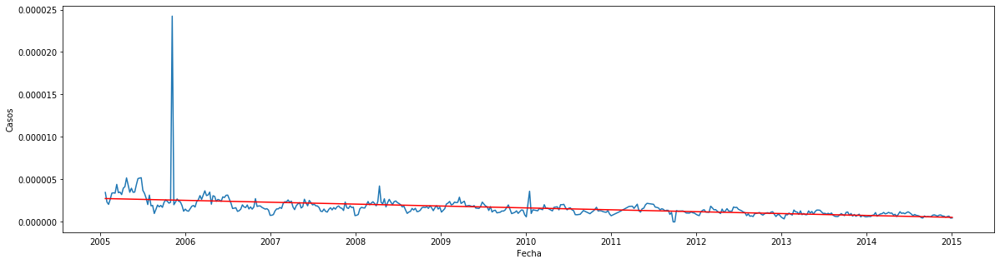

a39.0 - https://es.wikipedia.org/wiki/meningitis_meningococica


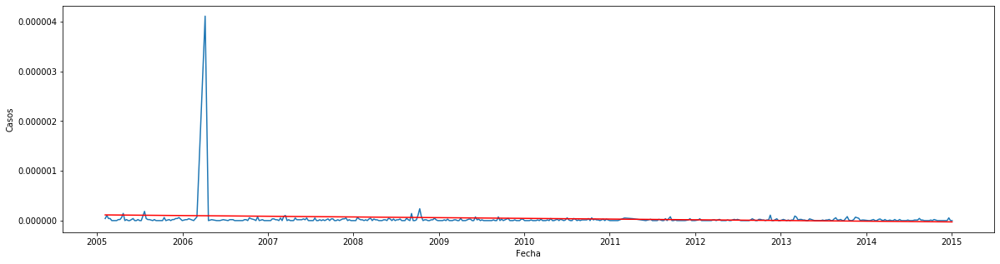

a50 - https://es.wikipedia.org/wiki/sifilis_congenita


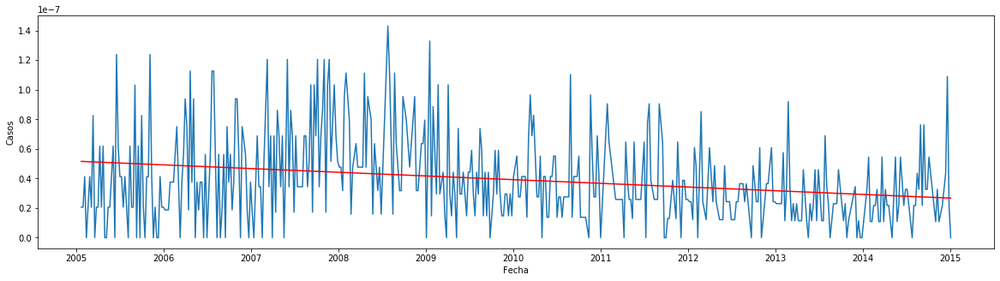

a51-a53 - https://es.wikipedia.org/wiki/sifilis_adquirida


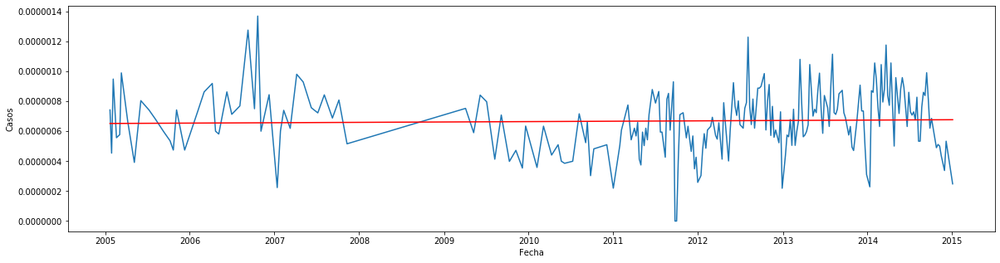

a54.0-a54.2 - https://es.wikipedia.org/wiki/infeccion_gonococica_genitourinaria


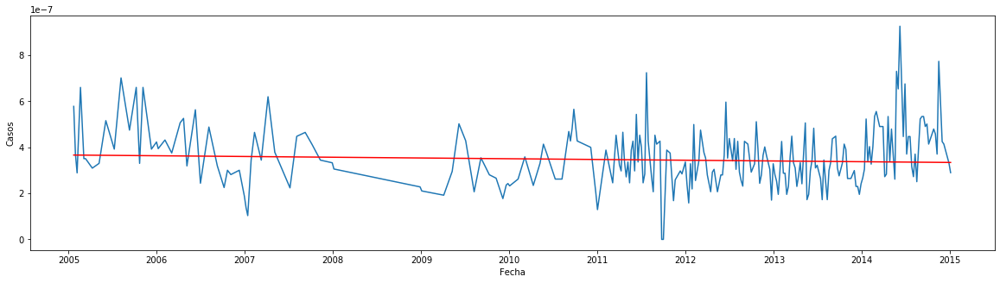

a90 - https://es.wikipedia.org/wiki/dengue_clasico


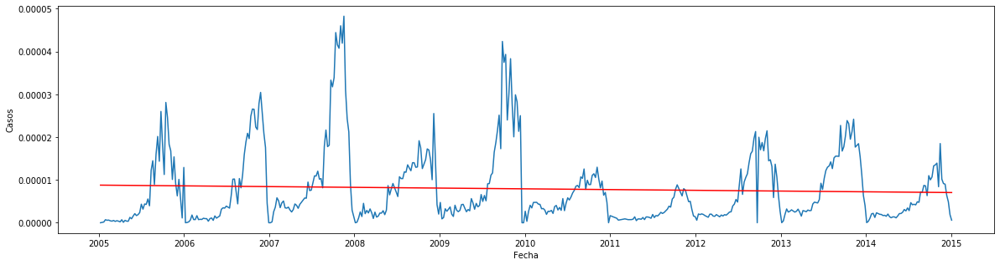

b01 - https://es.wikipedia.org/wiki/varicela


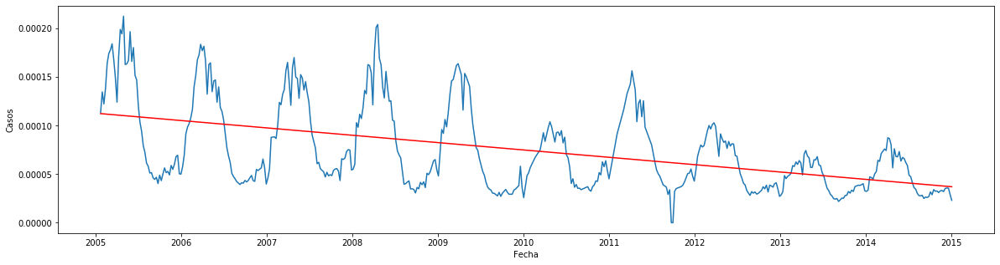

b06 - https://es.wikipedia.org/wiki/rubeola


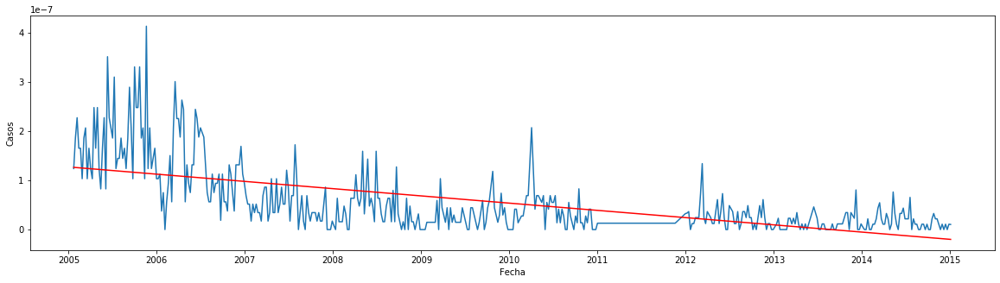

b15 - https://es.wikipedia.org/wiki/hepatitis_virica_a


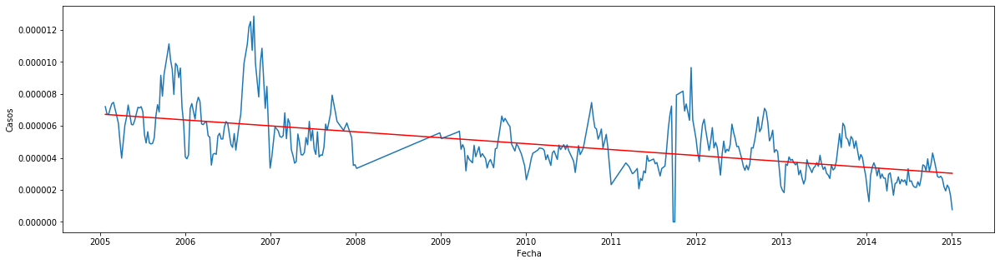

b16 - https://es.wikipedia.org/wiki/hepatitis_virica_b


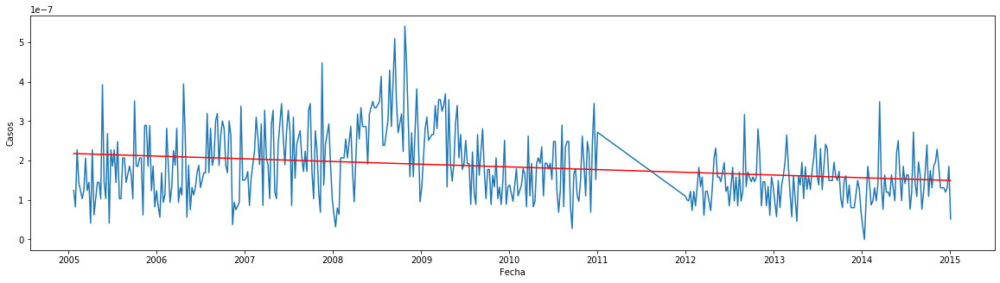

b17.1 - https://es.wikipedia.org/wiki/hepatitis_virica_c


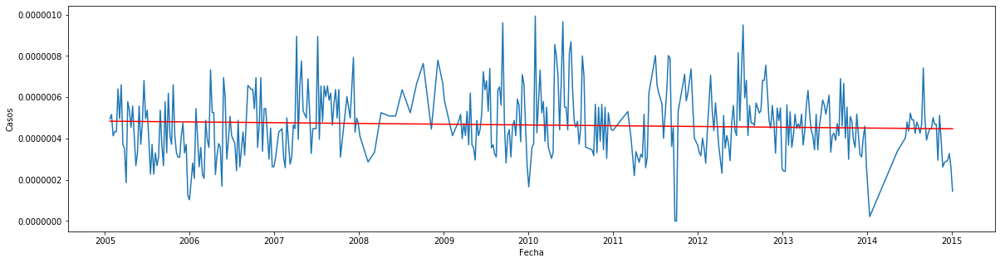

b20-b24 - https://es.wikipedia.org/wiki/sida


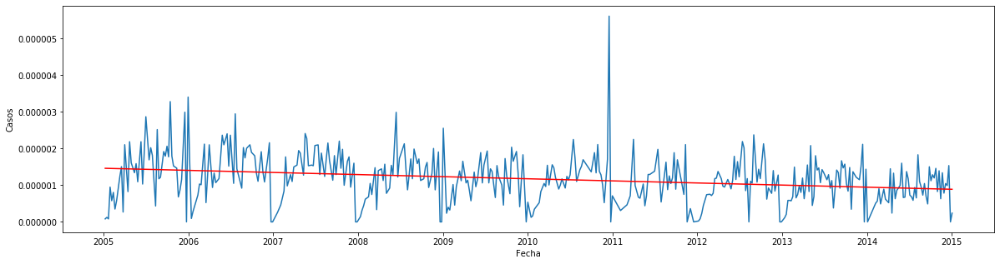

b26 - https://es.wikipedia.org/wiki/parotiditis_infecciosa


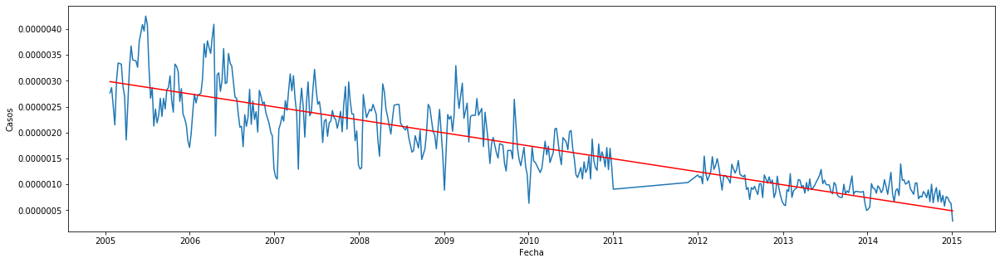

b50 - https://es.wikipedia.org/wiki/paludismo_por_p._falciparum


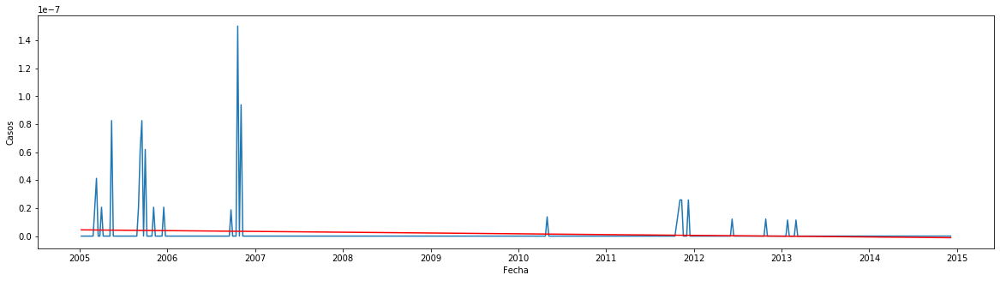

b51 - https://es.wikipedia.org/wiki/paludismo_por_p._vivax


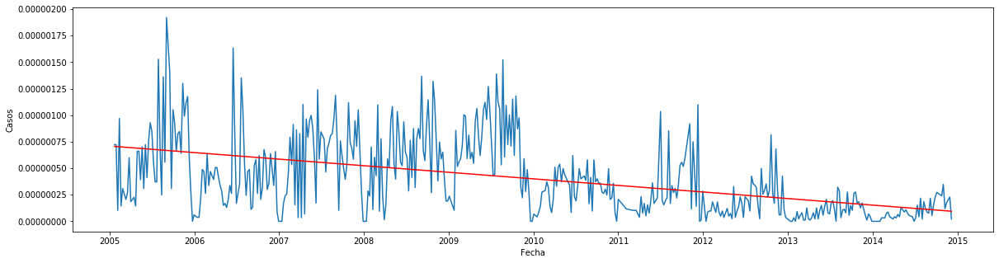

g00-g03 - https://es.wikipedia.org/wiki/meningitis


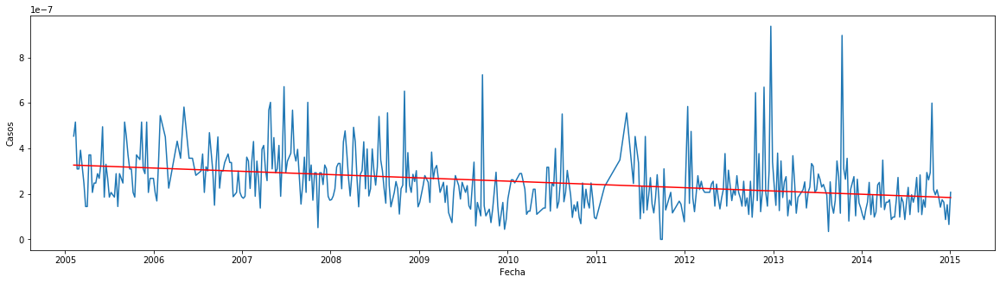

i00-i02 - https://es.wikipedia.org/wiki/fiebre_reumatica_aguda


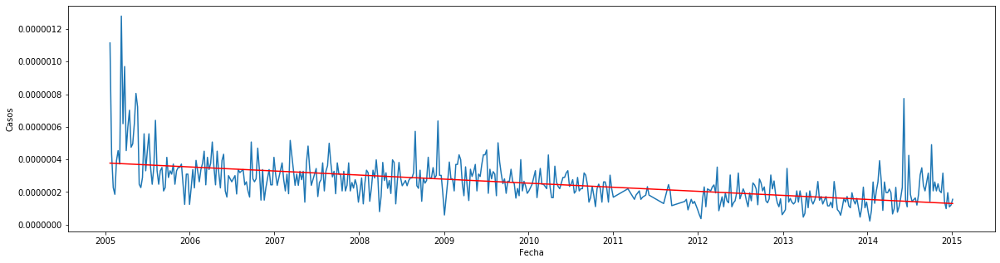

j00-j06 - https://es.wikipedia.org/wiki/infecciones_respiratorias_agudas


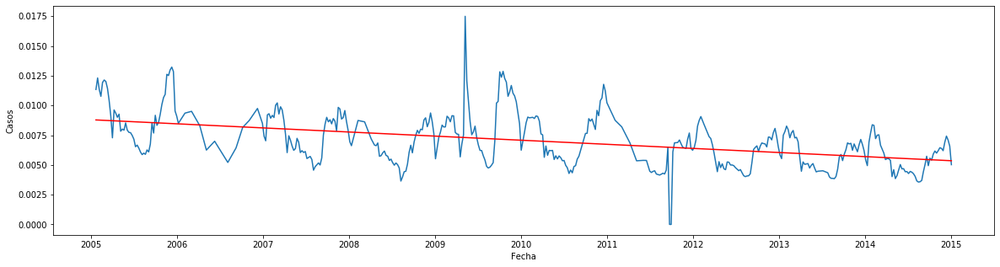

j12 - https://es.wikipedia.org/wiki/neumonias_y_bronconeumonias


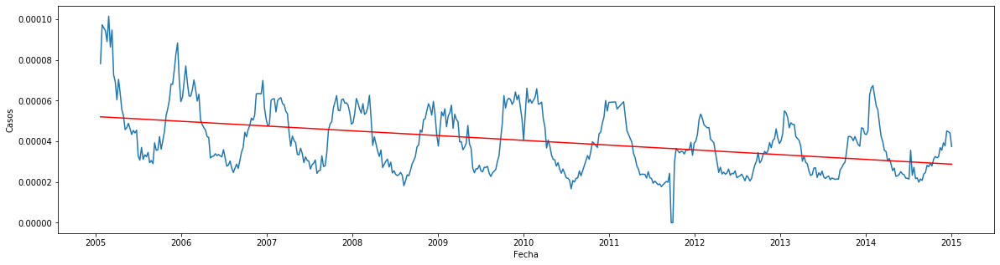

p35.0 - https://es.wikipedia.org/wiki/rubeola_congenita


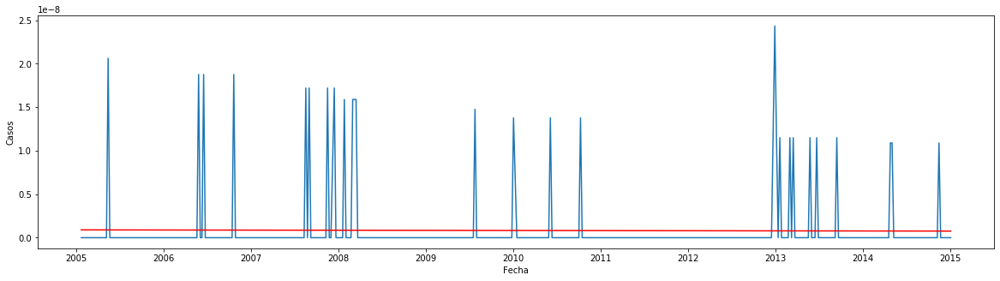

t60 - https://es.wikipedia.org/wiki/intoxicacion_por_plaguicidas


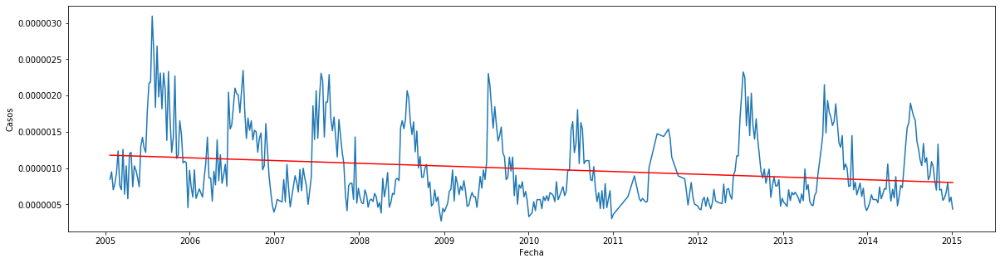

t63.2 - https://es.wikipedia.org/wiki/intoxicacion_por_veneno_de_escorpion


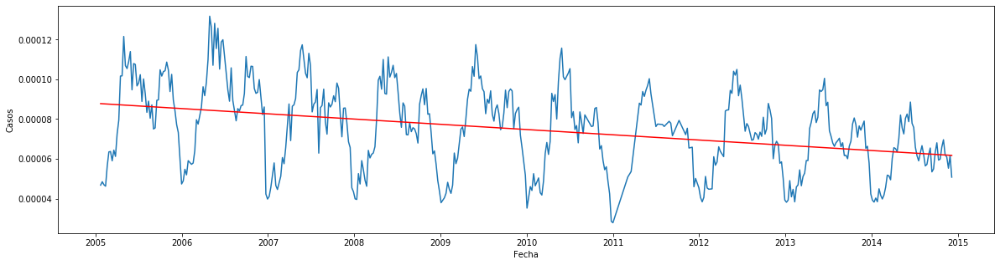

u97 - https://es.wikipedia.org/wiki/enfermedad_febril_exantematica


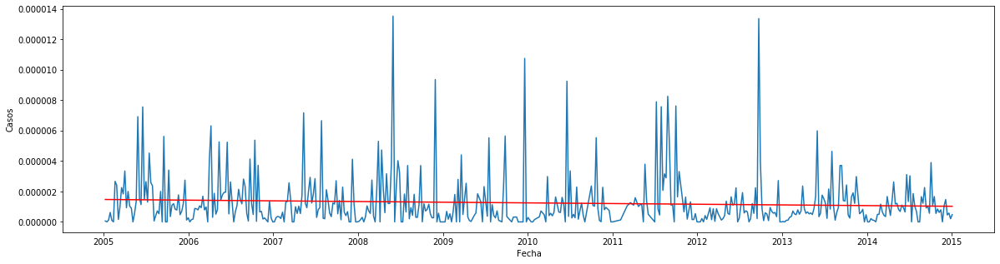

u98 - https://es.wikipedia.org/wiki/paralisis_flacida_aguda


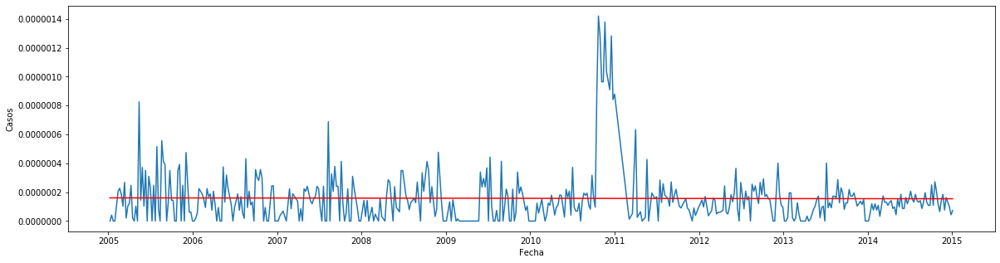

w54 - https://es.wikipedia.org/wiki/mordeduras_por_perro


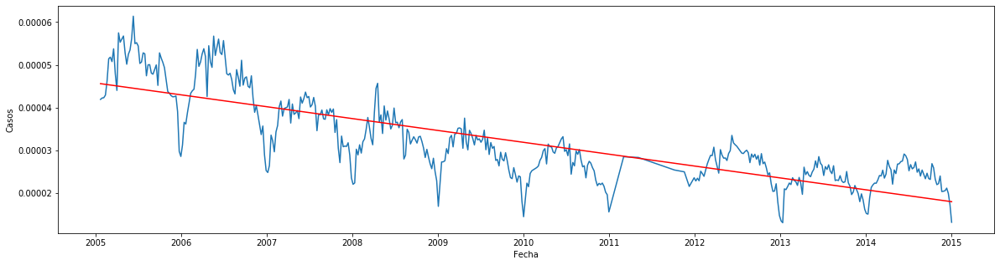

w55 - https://es.wikipedia.org/wiki/mordeduras_por_otros_mamiferos


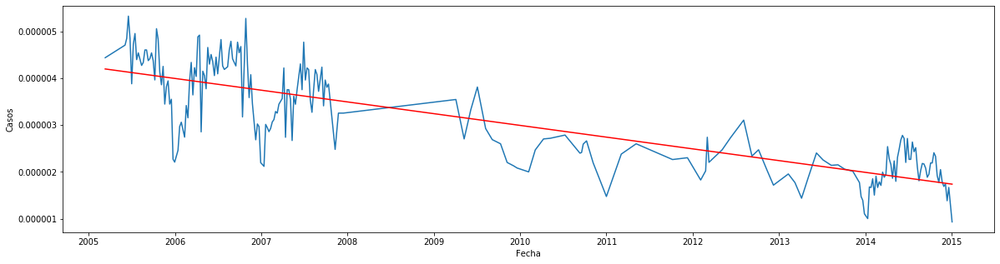

x20 - https://es.wikipedia.org/wiki/mordeduras_por_serpiente


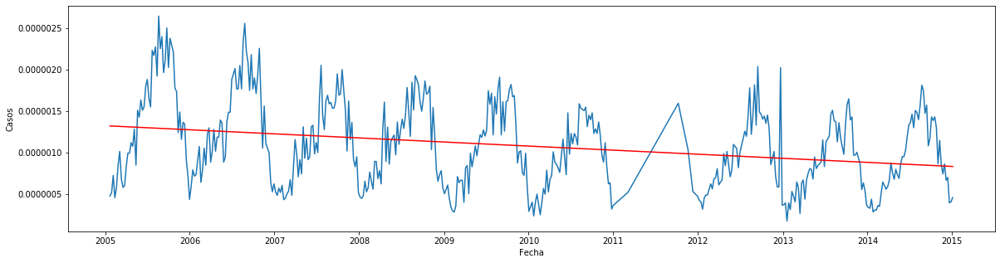

z21 - https://es.wikipedia.org/wiki/infeccion_asintomatica_por_vih


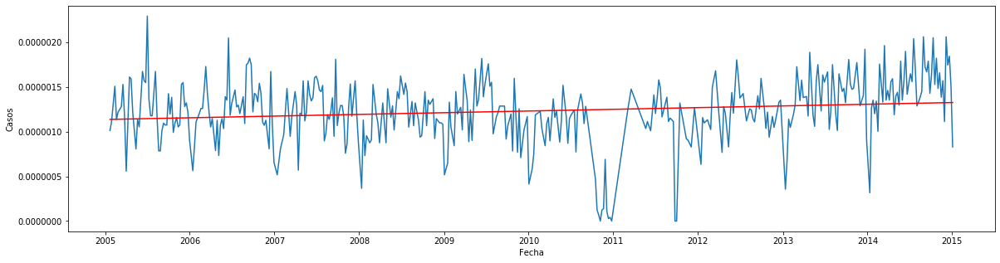

In [12]:
dh = np.array([48452418, 72514513])
a, b, r, p, e = stats.linregress([2005, 2010], dh)
dh = []
for i in range(2005, 2016):
    dh.append(a * i + b)
dh = pd.Series(dh)

diezAnios = cie_copy.filter(lambda x: x.index.min() < date(2006,1,1) and x.index.max() > date(2014,11,30))

for name, group in diezAnios.groupby(diezAnios.index.year):
    diezAnios.loc[diezAnios.index.year == name, 'inter'] = diezAnios.loc[diezAnios.index.year == name, 'inter'] / dh[name - 2005]
    
diezAniosGrupos = diezAnios.groupby('cie')

cieM = pd.DataFrame()
for name, group in diezAniosGrupos:
    
    a, b, r, p, e = stats.linregress(group.index.astype(int), group.inter)
    
    
    # print("y = f(x) = {} x + {}".format(a, b))
    # print("error", e)
    # print("p = ", p)
    # print("pendiente {:s}significativa".format("no " if p >= 0.05 else ""))
    # print("R^2", r**2)
    # https://stackoverflow.com/a/638443/3113008
    if debug:
        t = group.iloc[0, 0].replace(' ', '_')
        print('{0} - https://es.wikipedia.org/wiki/{1}'.format(name, t))
        plt.figure(figsize=(20, 5))
        # https://stackoverflow.com/a/19079248/3113008
        plt.plot(group.index, group.inter)
        plt.plot(group.index, (a * group.index.astype(int) + b), label = 'y = {:.1f}x + {:.0f}'.format(a, b), color = 'red')
        plt.xlabel("Fecha")
        plt.ylabel("Casos")
        if name == 'j00-j06' or name == 'a37' or name == 'z21' or name == 'a00':
            plt.savefig(name + 'norm.eps', format='eps')
        plt.show()
    
    group = group.drop(columns=['casos', 'inter', 'se'])
    group = group.assign(m=a)
    if p < 0.05:
        sig = True
    else:
        sig = False
    group = group.assign(significativa= sig)
    cieM = cieM.append(group.sample(1))

cieM = cieM.set_index('cie')

In [13]:
cieM.sort_values(by=['m'], ascending=False)

,enfermedad,m,significativa
cie,,,
z21,infeccion asintomatica por vih,5.995504e-25,True
a37,tos ferina,5.607001e-25,True
a51-a53,sifilis adquirida,7.963158e-26,False
a00,colera,7.156242e-26,True
a27,leptospirosis,6.339809e-26,False
a33,tetanos neonatal,3.625557e-28,False
p35.0,rubeola congenita,-4.453581e-28,False
b50,paludismo por p. falciparum,-1.790889e-26,True
u98,paralisis flacida aguda,-1.977607e-26,False


In [14]:
diezAnios.cie = diezAnios.cie.apply(lambda x: str.upper(x))

cieG = diezAnios.groupby(diezAnios.cie.str[0])

C:\Users\bena8\AppData\Local\Programs\Python\Python37-32\lib\site-packages\pandas\core\generic.py:5208: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


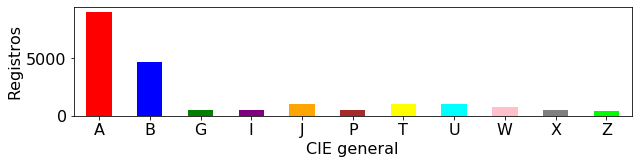

C:\Users\bena8\AppData\Local\Programs\Python\Python37-32\lib\site-packages\pandas\core\generic.py:5208: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


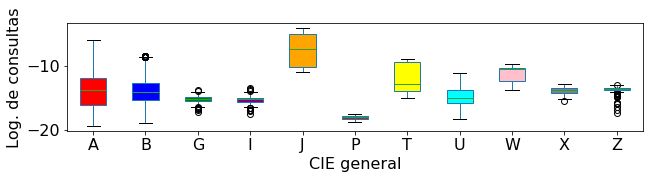

In [15]:
plt.rcParams.update({'font.size': 16})

colors = ['r', 'b', 'green', 'purple', 'orange', 'brown', 'yellow', 'cyan', 'pink', 'gray', 'lime']
plt.figure(figsize=(10,2))
cieG.size().plot(kind='bar', color=colors)
plt.xlabel('CIE general')
plt.ylabel('Registros')
# https://stackoverflow.com/a/11269325
plt.xticks(rotation=0)
plt.savefig('cieFreq.eps', format='eps')
plt.show()

t = diezAnios[diezAnios.inter > 0]

t.inter = np.log(t.inter)

boxx = t.boxplot(column=['inter'], by=t.cie.str[0], patch_artist=True, return_type='both', figsize=(10,2))
for row_key, (ax,row) in boxx.iteritems():
    ax.set_xlabel('')
    for i,box in enumerate(row['boxes']):
        box.set_facecolor(colors[i])
plt.suptitle('')
plt.title('')
plt.xlabel('CIE general')
plt.ylabel('Log. de consultas')
plt.grid(False)
plt.savefig('cieCasosLog.eps', format='eps')
plt.show()

C:\Users\bena8\AppData\Local\Programs\Python\Python37-32\lib\site-packages\statsmodels\compat\pandas.py:49: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  data_klasses = (pandas.Series, pandas.DataFrame, pandas.Panel)


a00 - https://es.wikipedia.org/wiki/colera


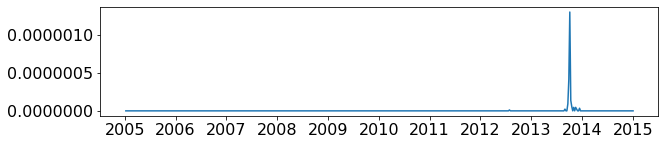

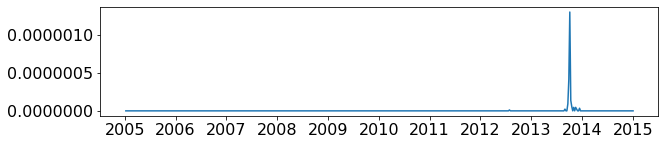

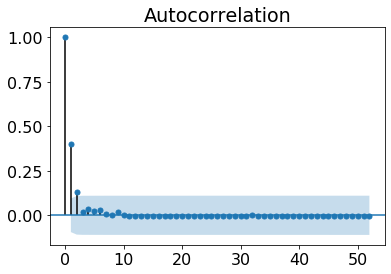

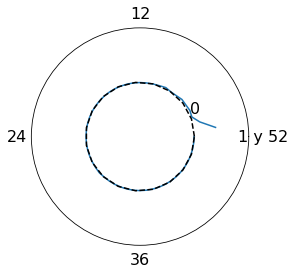

a01-a03 - https://es.wikipedia.org/wiki/enfermedades_infecciosas_intestinales


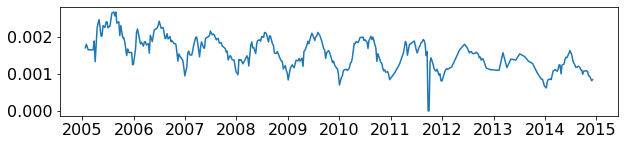

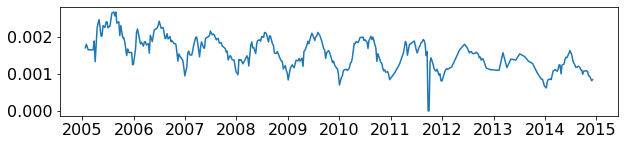

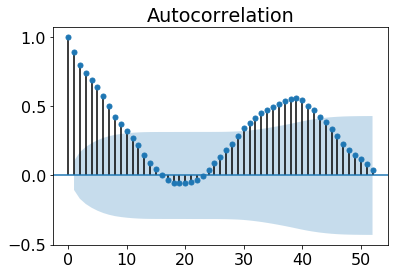

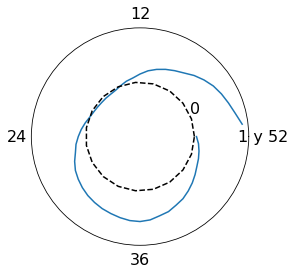

a01.0 - https://es.wikipedia.org/wiki/fiebre_tifoidea


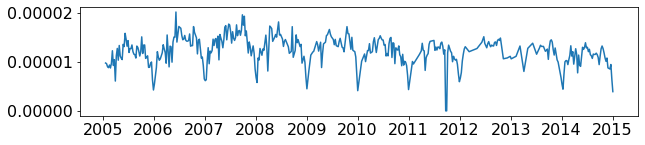

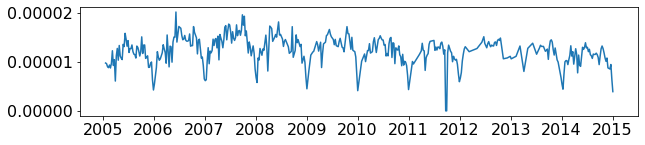

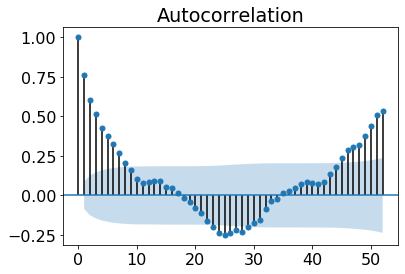

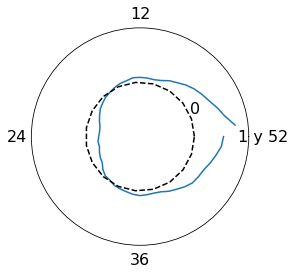

a01.1-a02 - https://es.wikipedia.org/wiki/paratifoidea


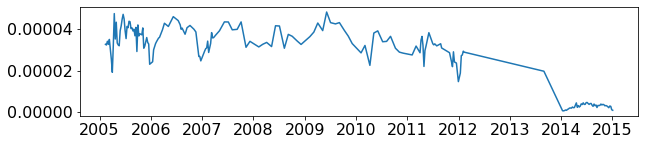

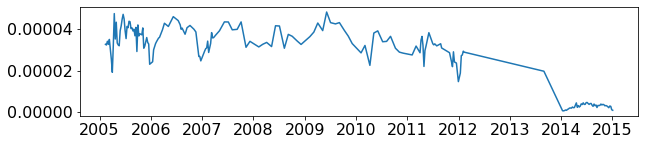

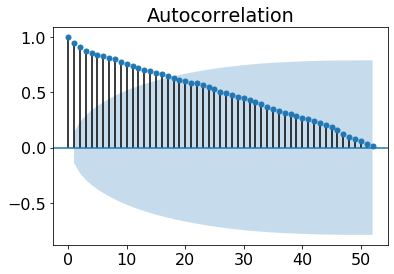

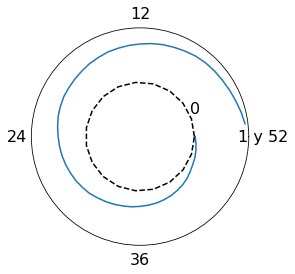

a03 - https://es.wikipedia.org/wiki/shigelosis


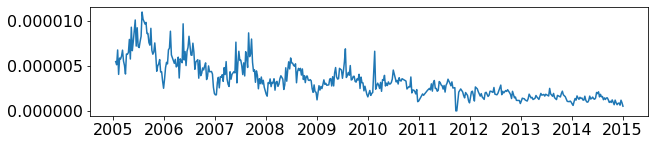

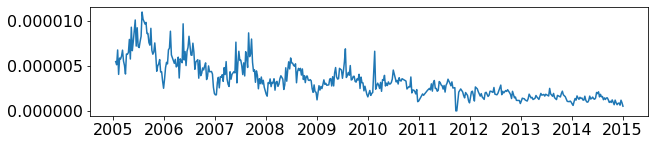

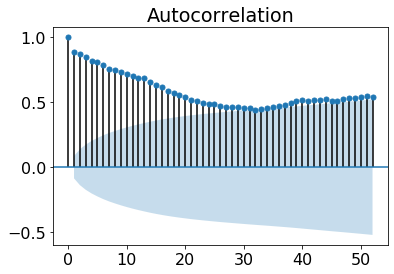

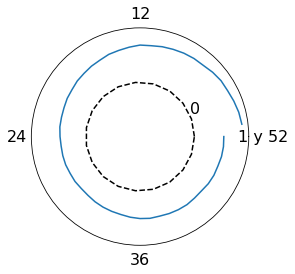

a05 - https://es.wikipedia.org/wiki/intoxicacion_alimentaria_bacteriana


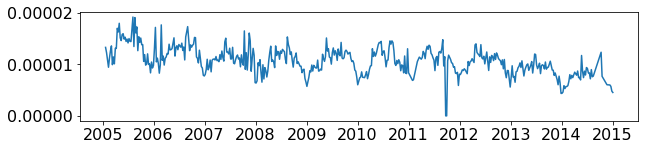

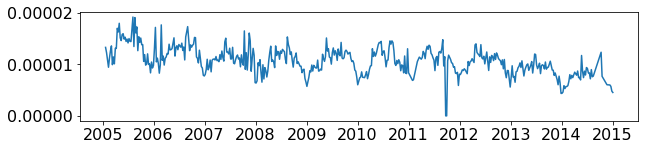

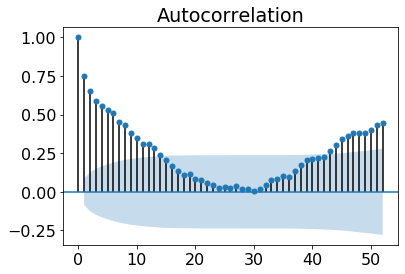

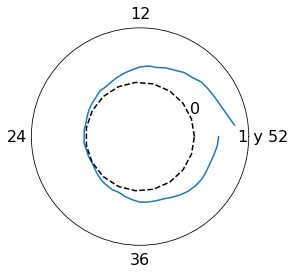

a15-a16 - https://es.wikipedia.org/wiki/tuberculosis_respiratoria


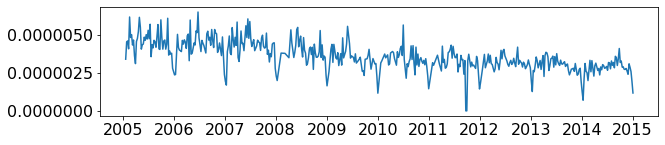

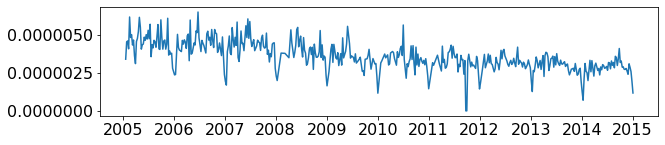

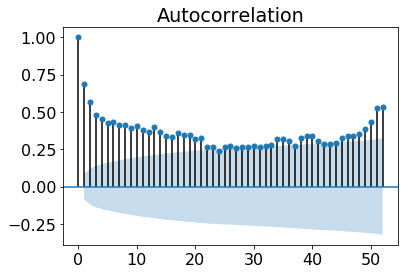

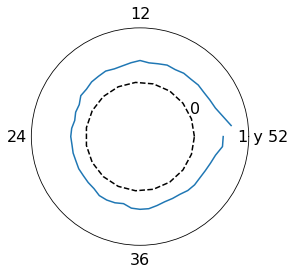

a17.0 - https://es.wikipedia.org/wiki/meningitis_tuberculosa


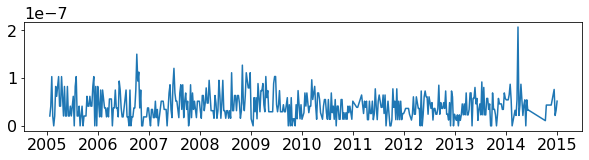

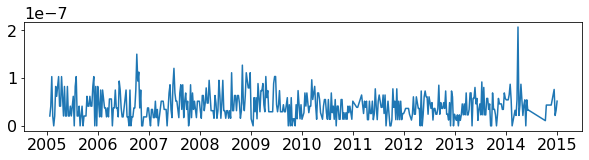

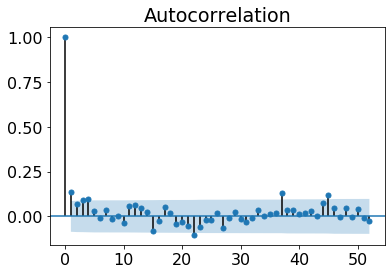

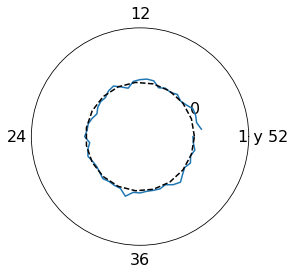

a23 - https://es.wikipedia.org/wiki/brucelosis


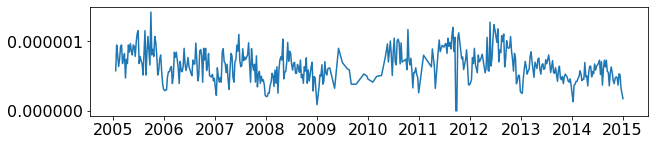

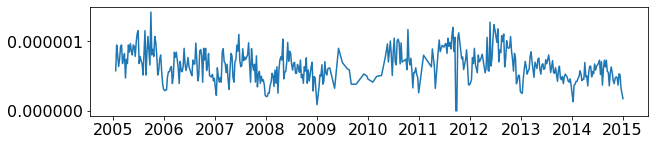

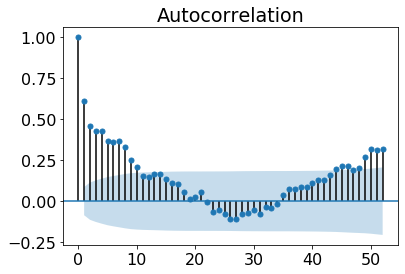

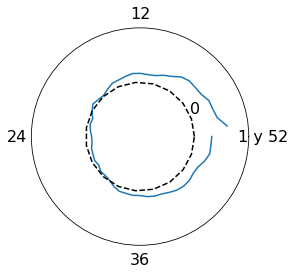

a27 - https://es.wikipedia.org/wiki/leptospirosis


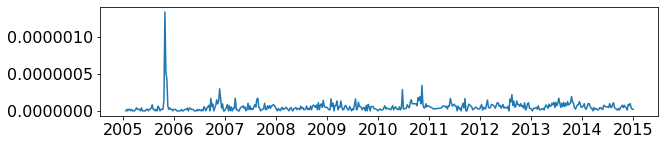

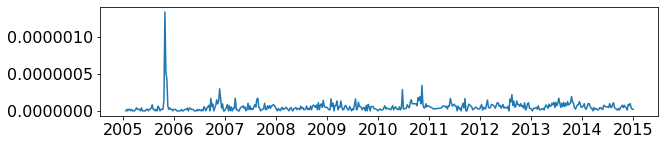

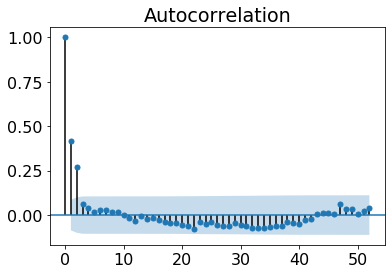

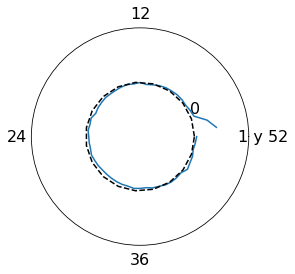

a33 - https://es.wikipedia.org/wiki/tetanos_neonatal


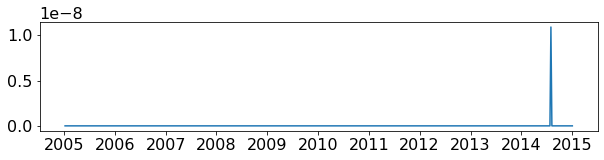

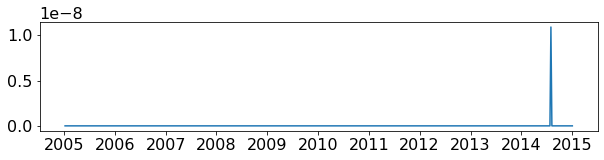

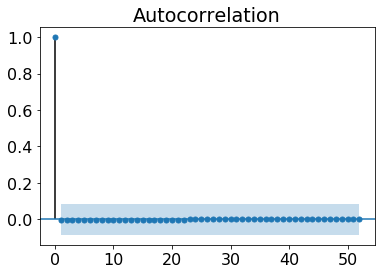

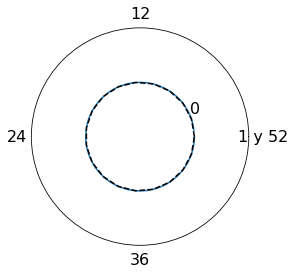

a34 - https://es.wikipedia.org/wiki/tetanos


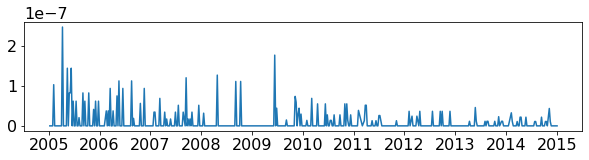

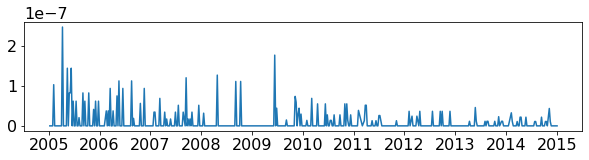

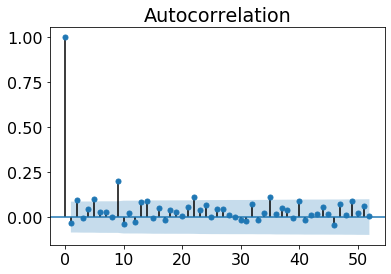

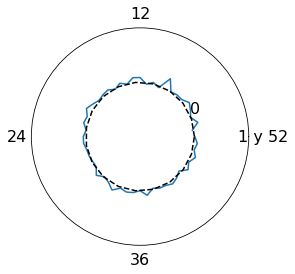

a37 - https://es.wikipedia.org/wiki/tos_ferina


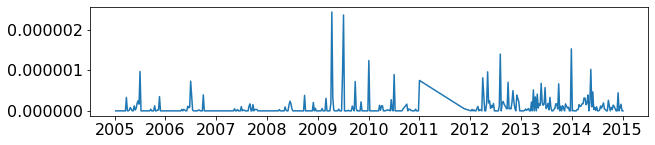

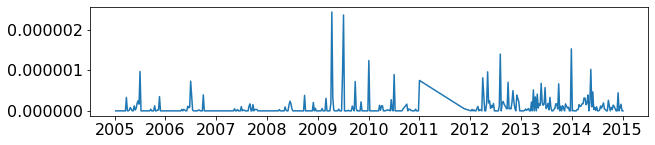

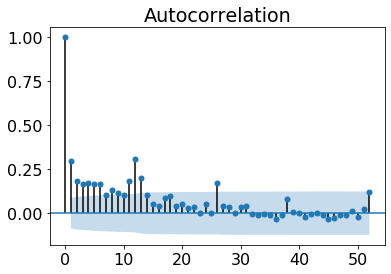

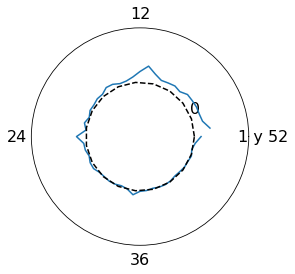

a38 - https://es.wikipedia.org/wiki/escarlatina


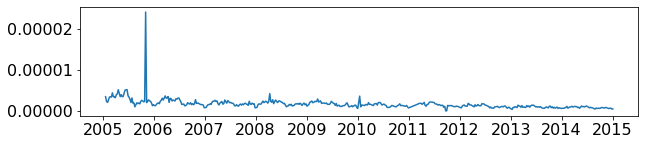

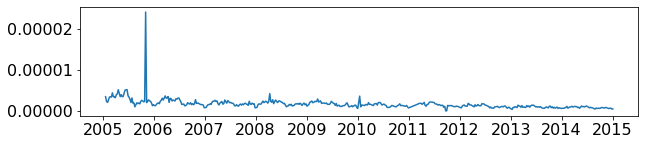

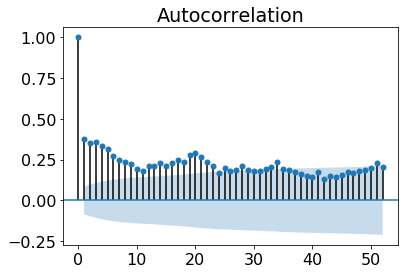

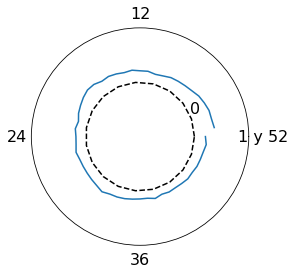

a39.0 - https://es.wikipedia.org/wiki/meningitis_meningococica


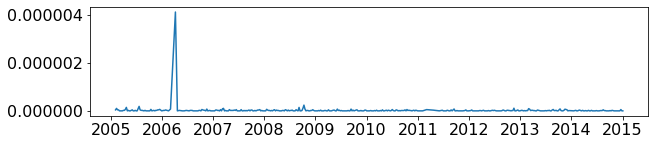

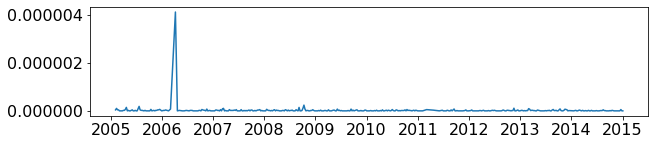

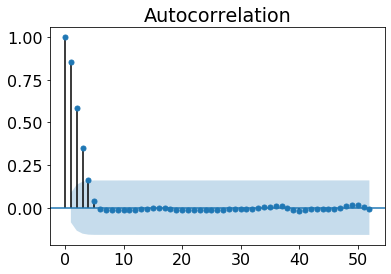

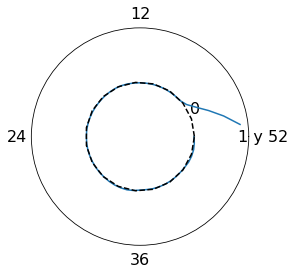

a50 - https://es.wikipedia.org/wiki/sifilis_congenita


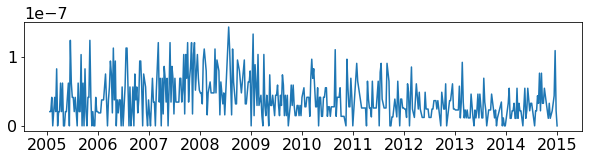

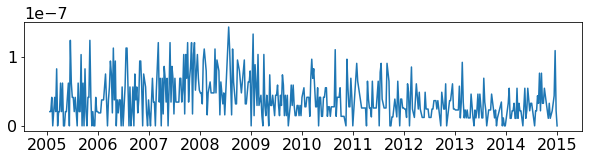

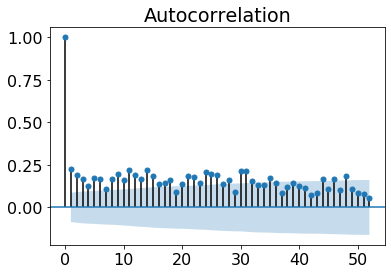

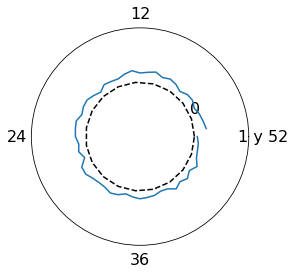

a51-a53 - https://es.wikipedia.org/wiki/sifilis_adquirida


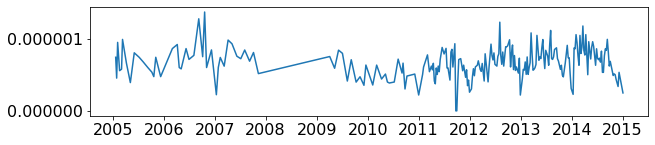

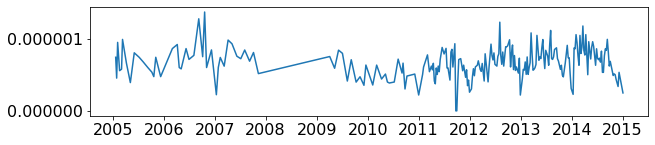

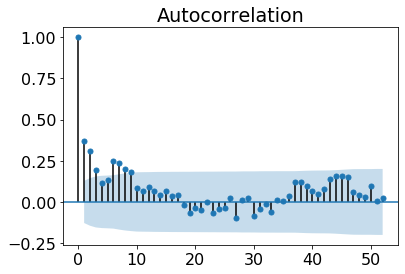

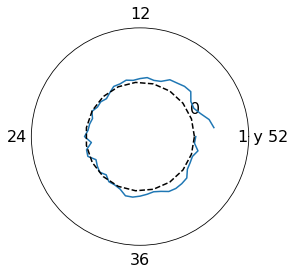

a54.0-a54.2 - https://es.wikipedia.org/wiki/infeccion_gonococica_genitourinaria


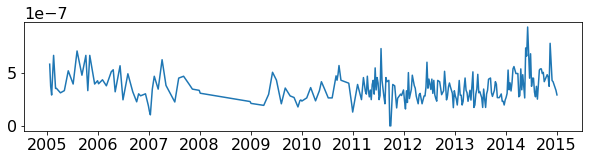

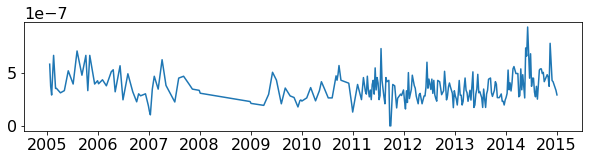

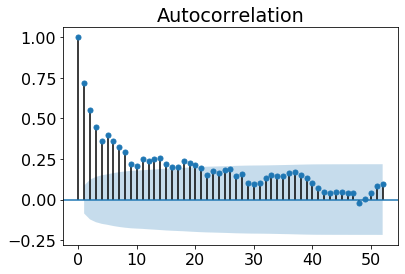

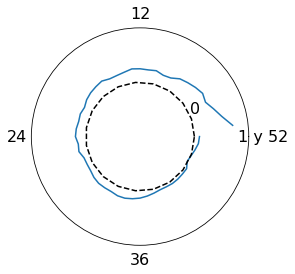

a90 - https://es.wikipedia.org/wiki/dengue_clasico


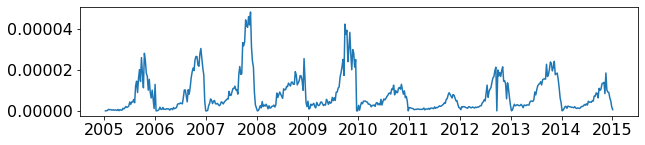

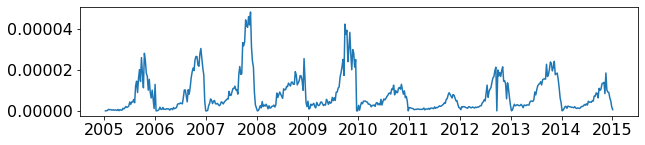

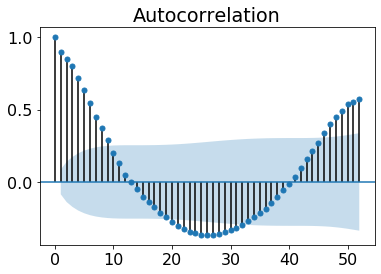

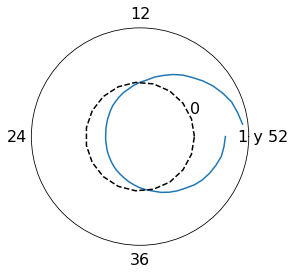

b01 - https://es.wikipedia.org/wiki/varicela


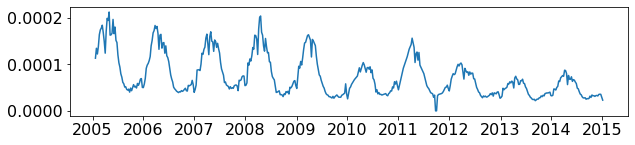

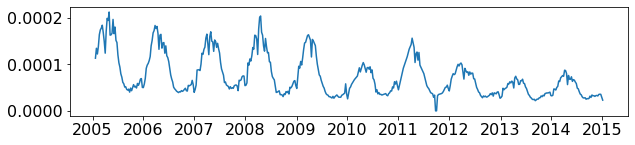

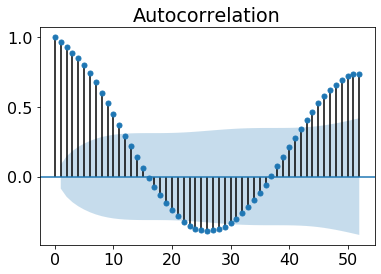

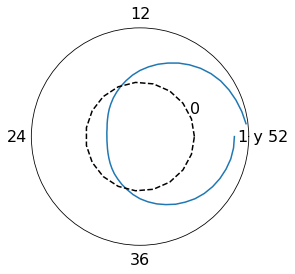

b06 - https://es.wikipedia.org/wiki/rubeola


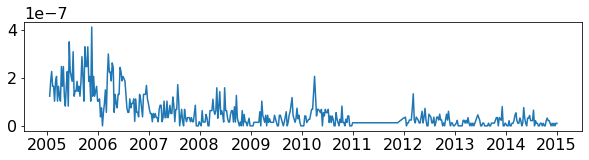

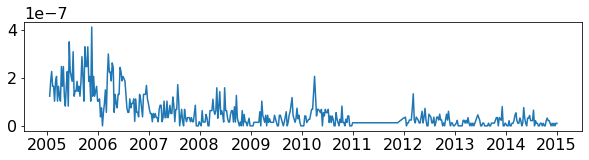

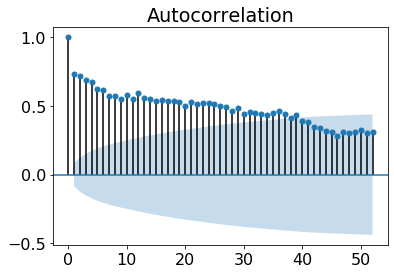

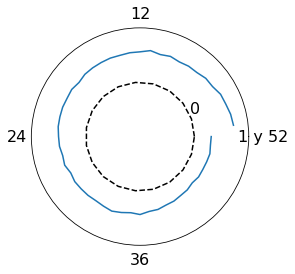

b15 - https://es.wikipedia.org/wiki/hepatitis_virica_a


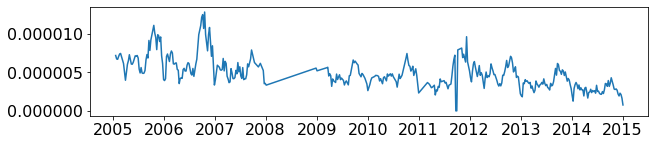

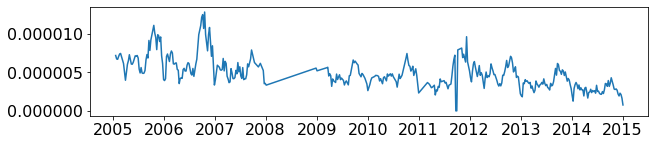

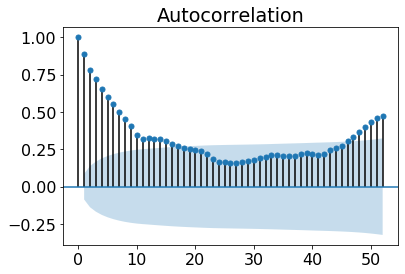

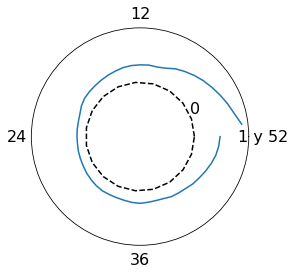

b16 - https://es.wikipedia.org/wiki/hepatitis_virica_b


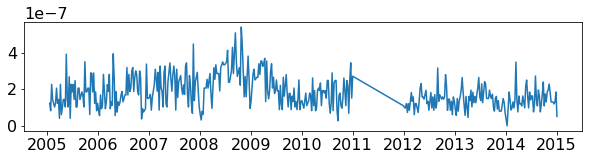

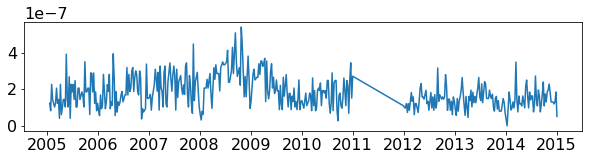

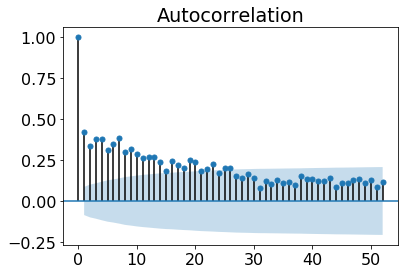

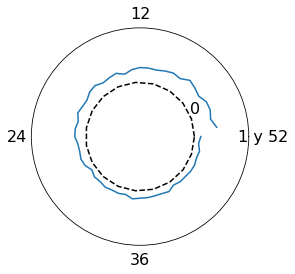

b17.1 - https://es.wikipedia.org/wiki/hepatitis_virica_c


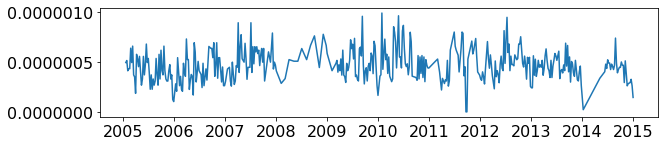

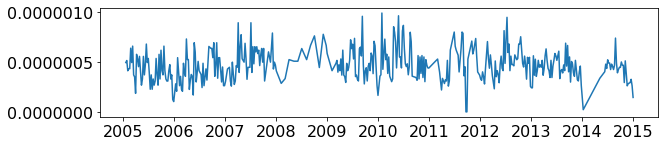

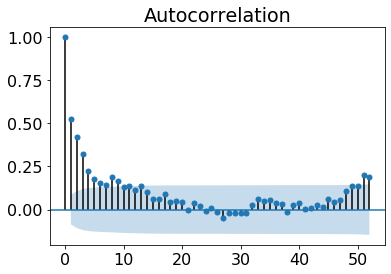

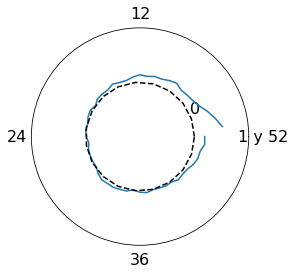

b20-b24 - https://es.wikipedia.org/wiki/sida


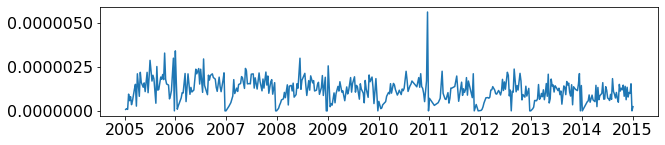

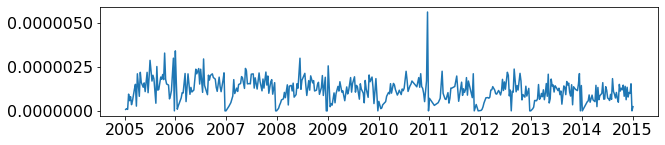

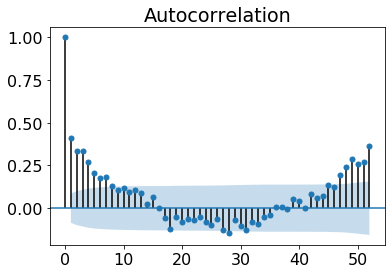

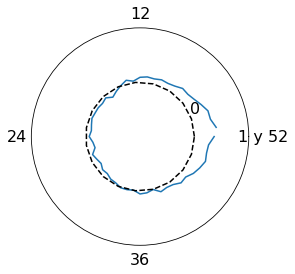

b26 - https://es.wikipedia.org/wiki/parotiditis_infecciosa


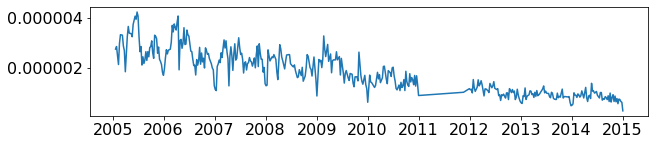

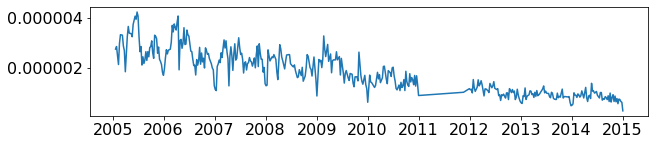

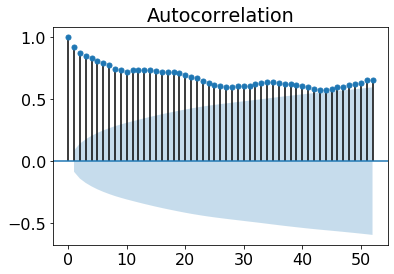

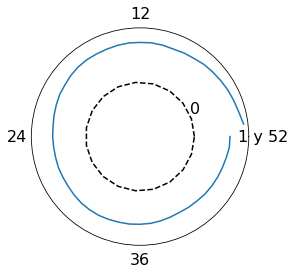

b50 - https://es.wikipedia.org/wiki/paludismo_por_p._falciparum


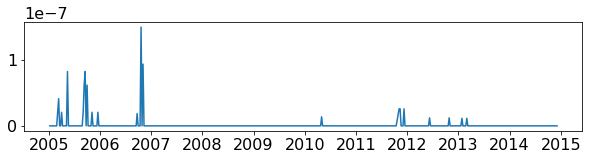

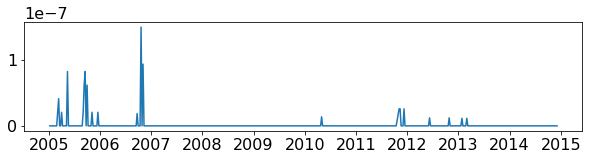

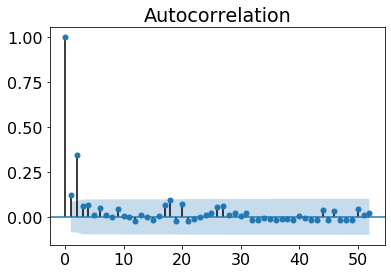

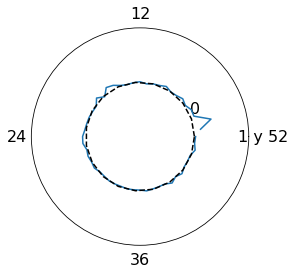

b51 - https://es.wikipedia.org/wiki/paludismo_por_p._vivax


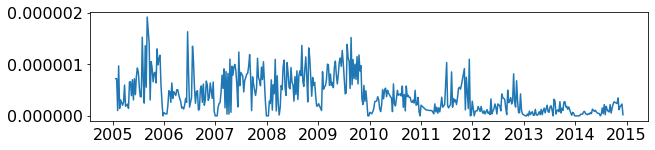

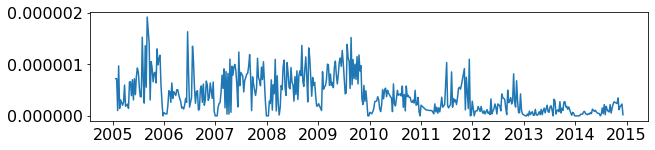

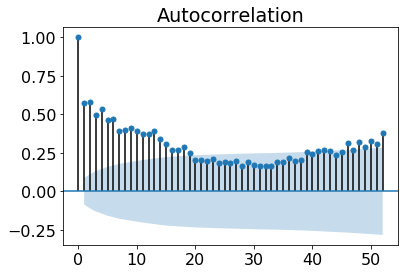

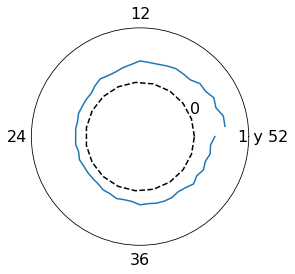

g00-g03 - https://es.wikipedia.org/wiki/meningitis


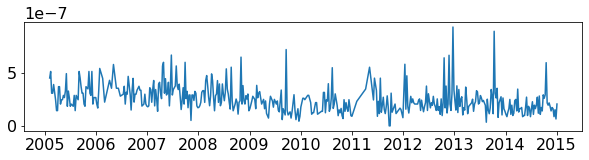

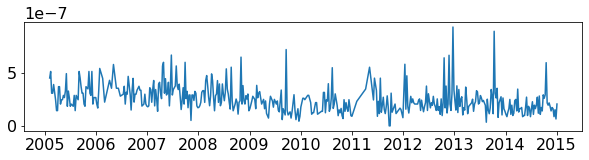

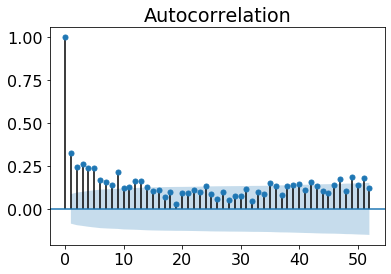

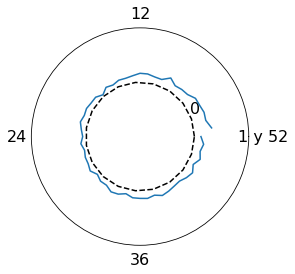

i00-i02 - https://es.wikipedia.org/wiki/fiebre_reumatica_aguda


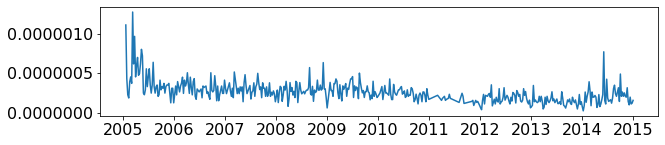

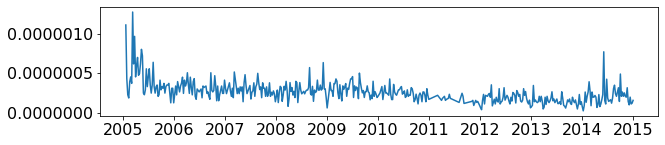

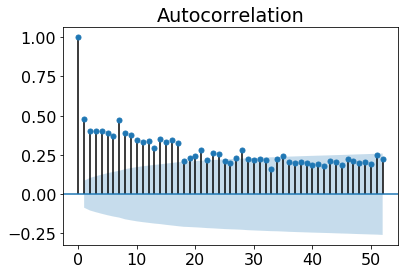

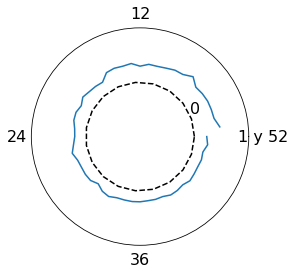

j00-j06 - https://es.wikipedia.org/wiki/infecciones_respiratorias_agudas


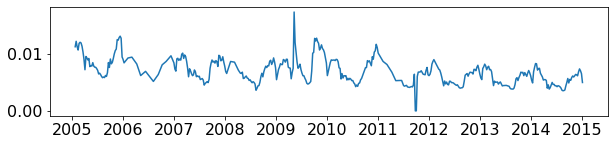

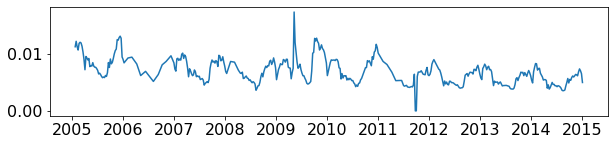

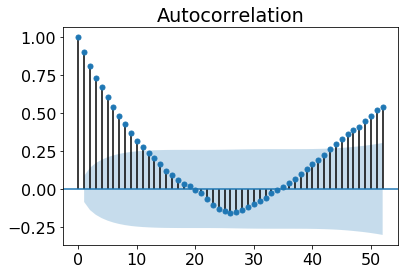

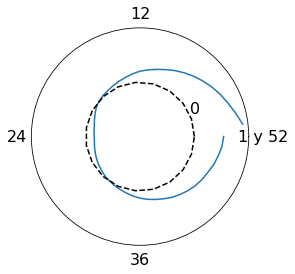

j12 - https://es.wikipedia.org/wiki/neumonias_y_bronconeumonias


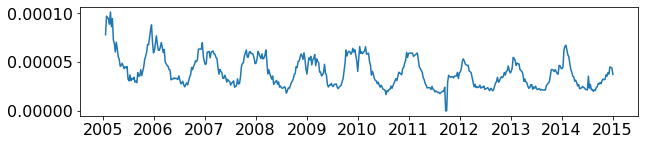

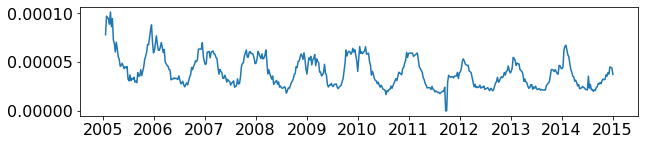

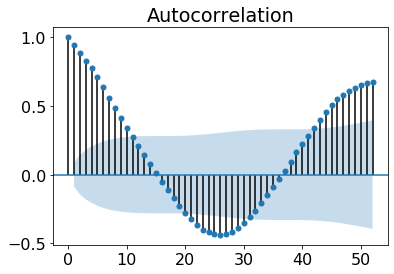

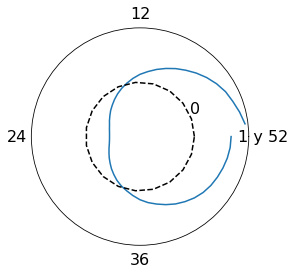

p35.0 - https://es.wikipedia.org/wiki/rubeola_congenita


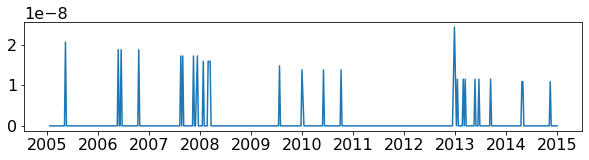

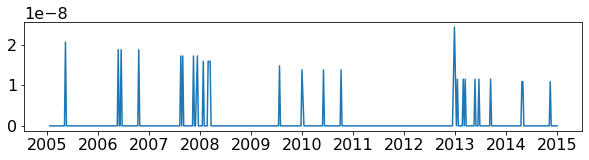

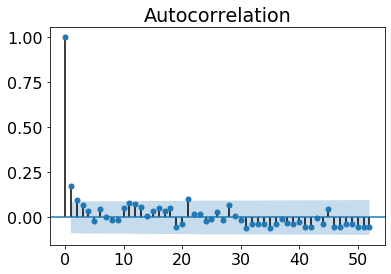

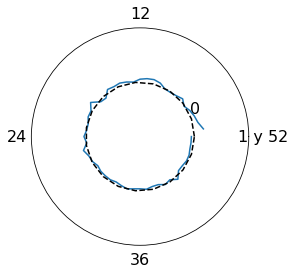

t60 - https://es.wikipedia.org/wiki/intoxicacion_por_plaguicidas


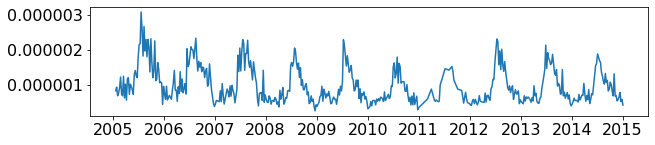

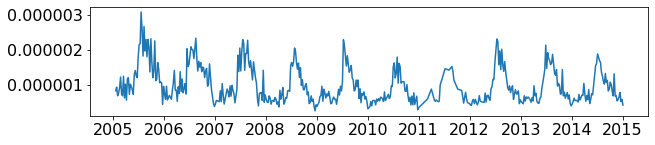

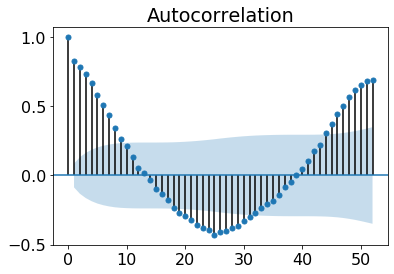

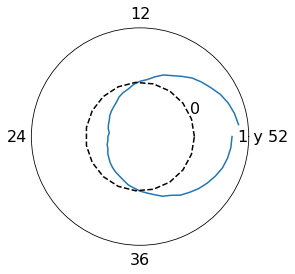

t63.2 - https://es.wikipedia.org/wiki/intoxicacion_por_veneno_de_escorpion


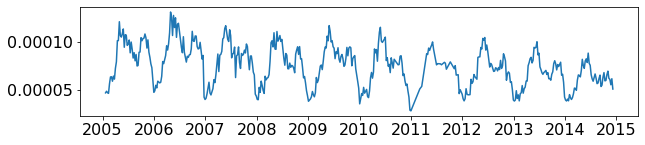

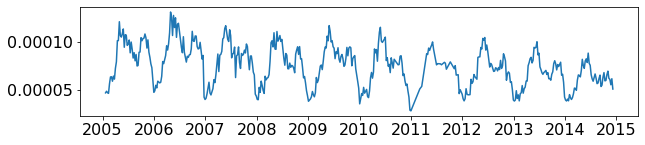

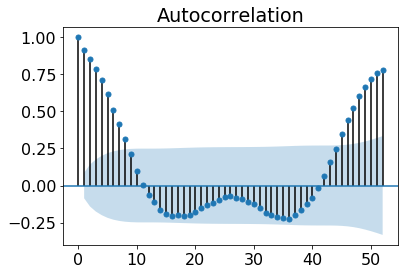

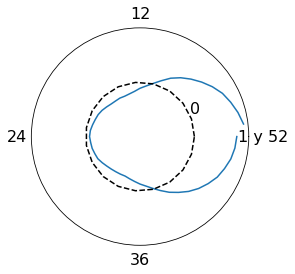

u97 - https://es.wikipedia.org/wiki/enfermedad_febril_exantematica


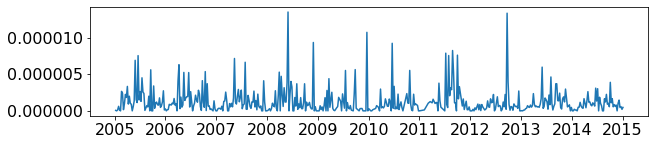

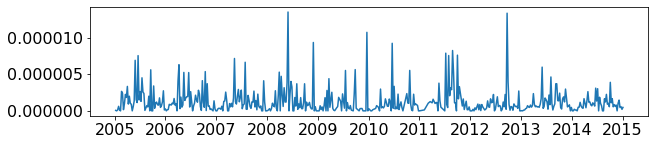

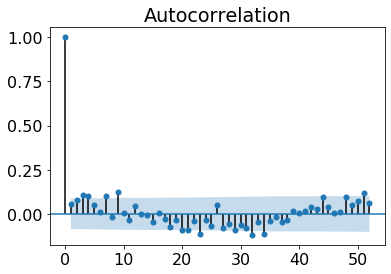

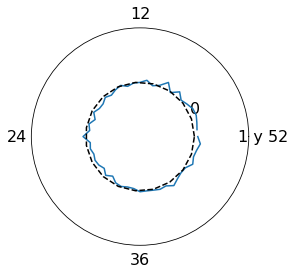

u98 - https://es.wikipedia.org/wiki/paralisis_flacida_aguda


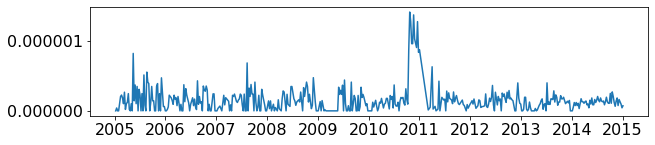

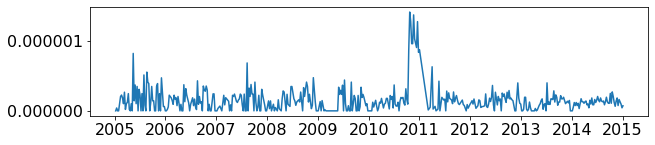

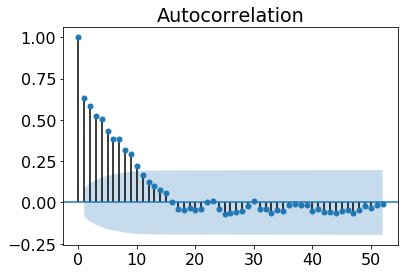

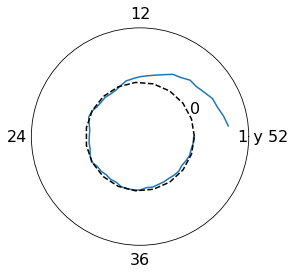

w54 - https://es.wikipedia.org/wiki/mordeduras_por_perro


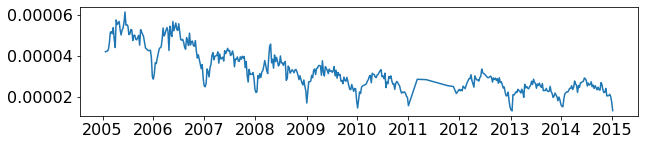

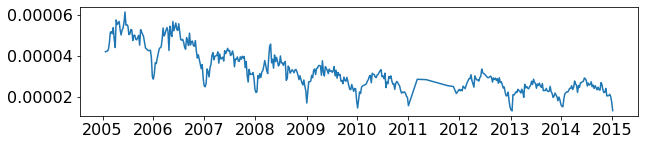

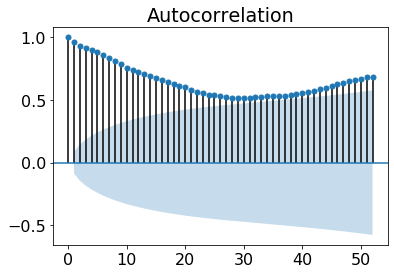

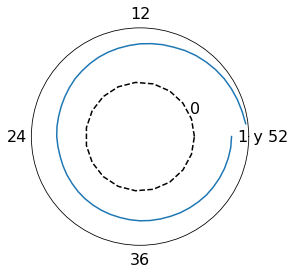

w55 - https://es.wikipedia.org/wiki/mordeduras_por_otros_mamiferos


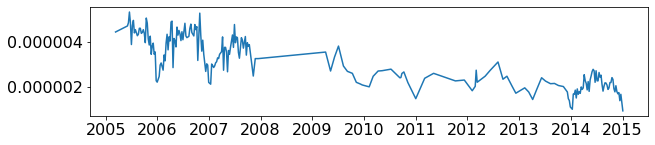

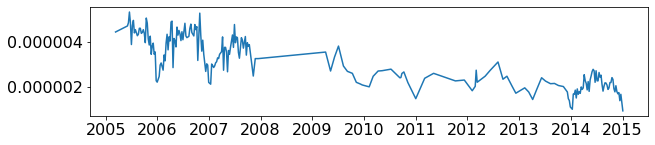

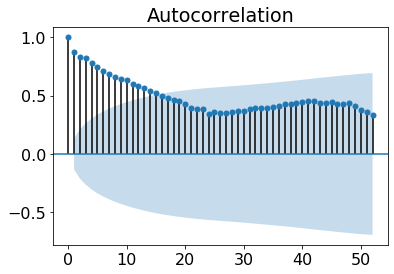

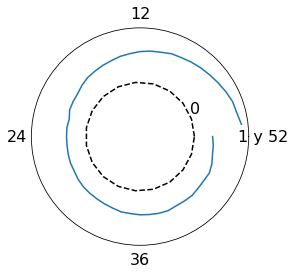

x20 - https://es.wikipedia.org/wiki/mordeduras_por_serpiente


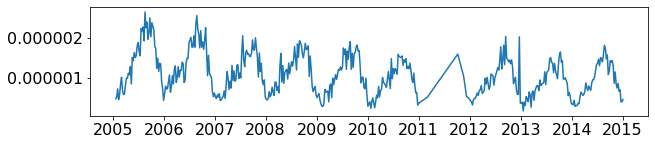

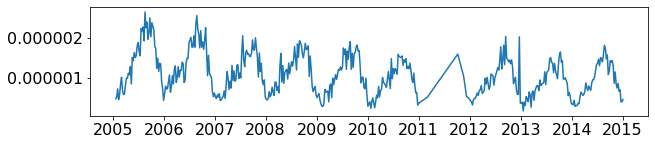

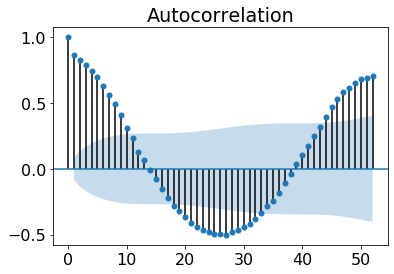

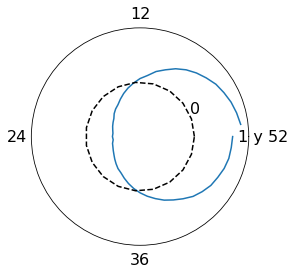

z21 - https://es.wikipedia.org/wiki/infeccion_asintomatica_por_vih


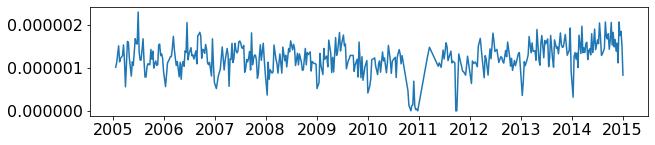

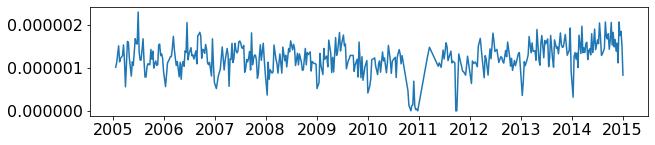

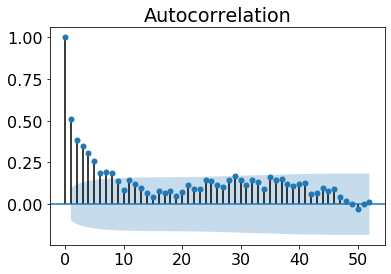

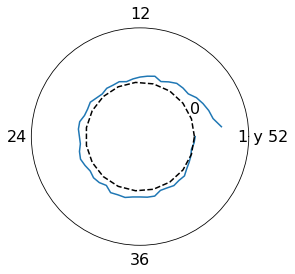

In [16]:
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.stattools import acf
from scipy import signal

cieF = []
for name, group in diezAniosGrupos:
    detrended = group.inter# - group.inter.shift()
    #detrended.dropna(inplace=True)
    #detrended = signal.detrend(group.inter)
    
    temp = [group.cie[0], group.enfermedad[0]]
    # https://stackoverflow.com/a/3748071
    temp.extend(acf(detrended, nlags=52))
    cieF.append(temp)
    
    if debug:
        t = group.iloc[0, 0].replace(' ', '_')
        print('{0} - https://es.wikipedia.org/wiki/{1}'.format(name, t))
        plt.figure(figsize=(10,2))
        plt.plot(group.inter)
        plt.show()

        plt.figure(figsize=(10,2))
        plt.plot(detrended)
        plt.show()

        plot_acf(detrended, lags=52)
        plt.show()

        grados = []
        for i in range(53):
            grados.append(i * 2 * np.pi / 52)
        plt.polar(grados[1:], acf(detrended, nlags=52)[1:])
        # https://stackoverflow.com/a/19131156/3113008
        plt.plot(np.linspace(0, 2*np.pi, 20), np.ones(20)*0, color='k', linestyle='--')
        plt.grid(False)
        plt.ylim(-1, 1)
        plt.yticks([0])
        plt.xticks([0, 0.5 * np.pi, np.pi, 3/2 * np.pi], ['1 y 52', '12', '24', '36'])
        plt.show()

cieF = pd.DataFrame(cieF)

colNames = ['cie', 'enfermedad']
for i in range (53):
    colNames.append('ac' + str(i))
cieF.columns = colNames

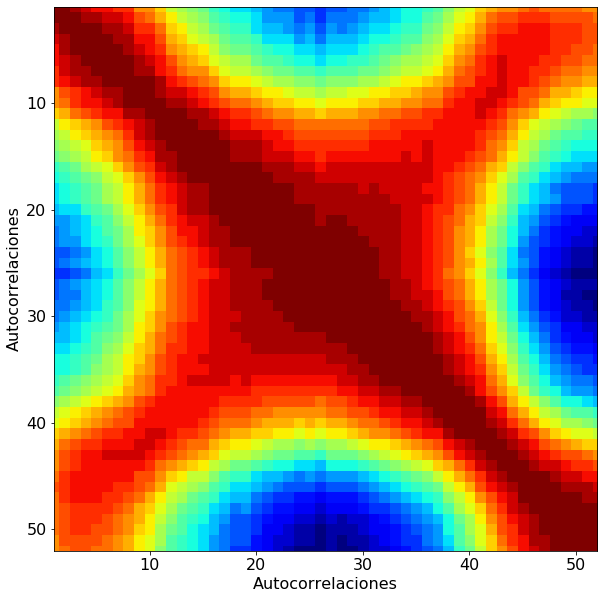

In [17]:
from matplotlib import pyplot as plt
from matplotlib import cm as cm

plt.rcParams.update({'font.size': 16})

# https://datascience.stackexchange.com/a/10461
fig = plt.figure(figsize = (10, 10))
ax1 = fig.add_subplot(111)
cmap = cm.get_cmap('jet', 30)
cax = ax1.imshow(cieF.iloc[:, 1:].corr(), interpolation="nearest", cmap=cmap)
#plt.title('Correlación de características')
# Add colorbar, make sure to specify tick locations to match desired ticklabels
plt.xlabel('Autocorrelaciones')
plt.ylabel('Autocorrelaciones')
plt.xlim([1, 52])
plt.ylim([52, 1])
plt.savefig('corrMatrix.eps', format='eps')

0.05656176383042034


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


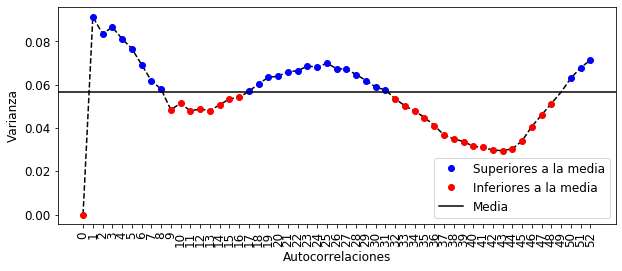

In [18]:
t = np.var(cieF.iloc[:, 2:])
t = pd.DataFrame(t)
tMedian = np.median(np.var(cieF.iloc[:, 2:]))
print(tMedian)

plt.rcParams.update({'font.size': 12})

plt.figure(figsize=(10,4))
plt.plot(t.iloc[:,0], '--k')
plt.plot(t[t.iloc[:,0] > tMedian], 'ob', label='Superiores a la media')
plt.plot(t[t.iloc[:,0] < tMedian], 'or', label='Inferiores a la media')
plt.axhline(y=tMedian, c = 'black', label='Media')
plt.legend()
plt.ylabel("Varianza")
plt.xlabel("Autocorrelaciones")
plt.xticks(range(53), range(53),rotation=90)
plt.savefig('xVT.eps', format='eps')

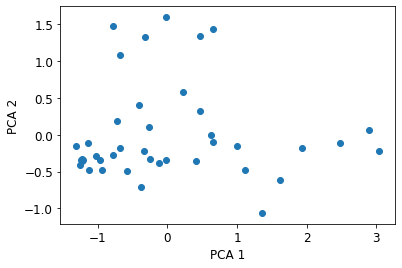

In [19]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler

selected = cieF

for c in selected.columns.values:
    if c in t[t.iloc[:,0] > tMedian].index.values:
        selected = selected.drop(columns=c)

selected.iloc[:, 2:] = MinMaxScaler().fit(selected.iloc[:, 2:]).transform(selected.iloc[:, 2:])

k = 2 # dimensiones deseadas
pca = PCA(n_components = k).fit_transform(selected.iloc[:, 2:])
pca = pd.DataFrame(data=pca)
plt.scatter(pca[0], pca[1])
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.show()

In [20]:
from sklearn.cluster import KMeans

clusters = range(2, len(cieG) + 1)
l = len(clusters)
results_test = []
kmeans = [KMeans(n_clusters=i) for i in clusters]
y_pred_test = [kmeans[i].fit(selected.iloc[:, 2:]).predict(selected.iloc[:, 2:]) for i in range(len(kmeans))]
score = [-kmeans[i].score(selected.iloc[:, 2:]) for i in range(len(kmeans))]
results_test.append(score)
results_test = results_test[0]

In [21]:
from kneed import KneeLocator 
kneedle = KneeLocator(
    clusters, # Entre los clusters definidos
    results_test, 
    curve='convex', 
    direction='decreasing'
)
# Se actualiza el número de clusters
n_clusters = kneedle.knee
print("Clusters elegidos: {}\n". format(n_clusters))

Clusters elegidos: 4



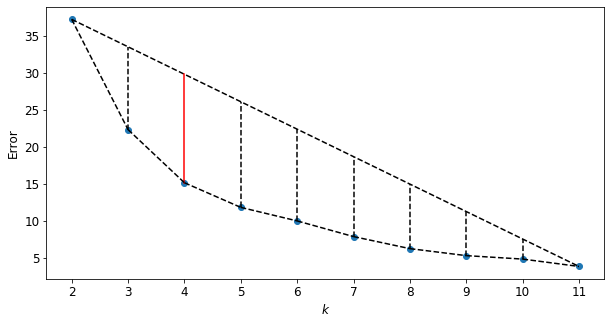

In [22]:
a, b, r, p, e = stats.linregress([0,9], [results_test[0], results_test[-1]])

plt.figure(figsize=(10, 5))
plt.plot(results_test, 'o')
plt.xticks(range(10), range(2,12)) # https://matplotlib.org/gallery/statistics/boxplot_demo.html
#plt.axvline(x=n_clusters - 1)
plt.plot([0, 9], [b, a * 9 + b], '--k')
for i in range(2, 11):
    x1 = i -1
    y1 = results_test[i-1]
    x2 = (x1 / a + y1 - b) / (a + 1 / a)
    y2 = a * x2 + b
    #plt.plot([x1, x2], [y1,y2], '--', c=colors[i-2])
    if i == n_clusters - 1:
        plt.plot([x1, x1], [y1,a * x1 + b], '-r')
    else:
        plt.plot([x1, x1], [y1,a * x1 + b], '--k')
    plt.plot([x1 - 1, x1], [results_test[i -2], y1], '--k')
plt.xlabel('$k$')
plt.ylabel('Error')
plt.savefig('codo.eps', format='eps')

In [23]:
kmeans = KMeans(n_clusters=n_clusters).fit(selected.iloc[:, 2:])
y_pred = kmeans.predict(selected.iloc[:, 2:])
cieK = cieF.assign(k=y_pred)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


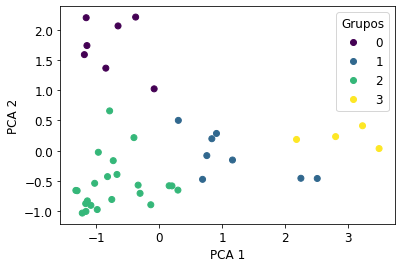

In [24]:
k = 2 # dimensiones deseadas
pca = PCA(n_components = k).fit_transform(cieK.iloc[:, 2:-2])
pca = pd.DataFrame(data=pca)
scatter = plt.scatter(pca[0], pca[1], c=cieK.k)

plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.legend(*scatter.legend_elements(), title="Grupos")
plt.savefig('kmedias.eps', format='eps')
plt.show()

Grupo 0
18                          dengue clasico
19                                varicela
30        infecciones respiratorias agudas
31             neumonias y bronconeumonias
33            intoxicacion por plaguicidas
34    intoxicacion por veneno de escorpion
39                mordeduras por serpiente
Name: enfermedad, dtype: object
18        A90
19        B01
30    J00-J06
31        J12
33        T60
34      T63.2
39        X20
Name: cie, dtype: object


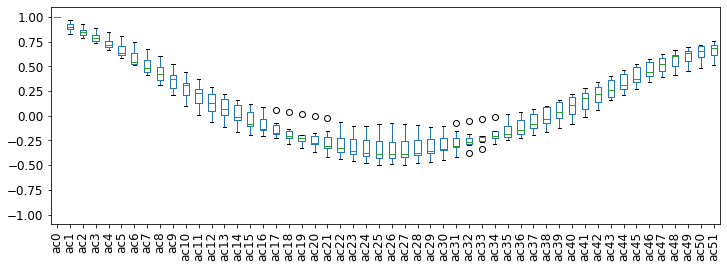

Grupo 1
1     enfermedades infecciosas intestinales
3                              paratifoidea
5       intoxicacion alimentaria bacteriana
6                 tuberculosis respiratoria
20                                  rubeola
21                       hepatitis virica a
27                   paludismo por p. vivax
29                   fiebre reumatica aguda
Name: enfermedad, dtype: object
1       A01-A03
3     A01.1-A02
5           A05
6       A15-A16
20          B06
21          B15
27          B51
29      I00-I02
Name: cie, dtype: object


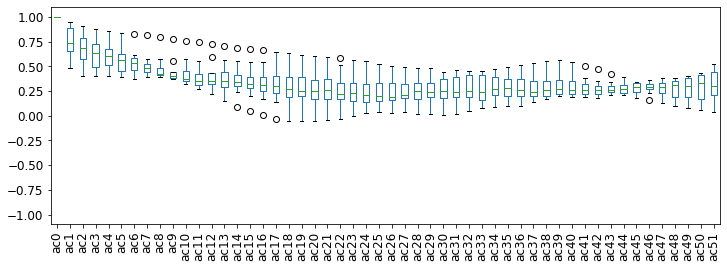

Grupo 2
0                                  colera
2                         fiebre tifoidea
7                  meningitis tuberculosa
8                              brucelosis
9                           leptospirosis
10                       tetanos neonatal
11                                tetanos
12                             tos ferina
13                            escarlatina
14               meningitis meningococica
15                      sifilis congenita
16                      sifilis adquirida
17    infeccion gonococica genitourinaria
22                     hepatitis virica b
23                     hepatitis virica c
24                                   sida
26            paludismo por p. falciparum
28                             meningitis
32                      rubeola congenita
35         enfermedad febril exantematica
36                paralisis flacida aguda
40         infeccion asintomatica por vih
Name: enfermedad, dtype: object
0             A00
2           A01.0


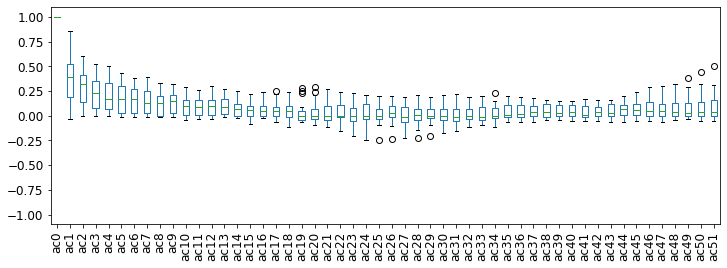

Grupo 3
4                         shigelosis
25            parotiditis infecciosa
37              mordeduras por perro
38    mordeduras por otros mamiferos
Name: enfermedad, dtype: object
4     A03
25    B26
37    W54
38    W55
Name: cie, dtype: object


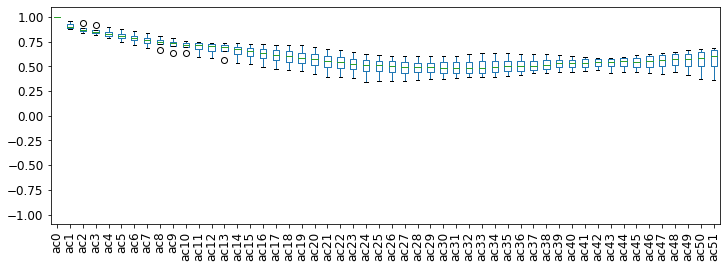

In [25]:
for name, group in cieK.groupby('k'):
    print("Grupo " + str(name))
    print(group.enfermedad)
    print(group.cie)
    plt.figure(figsize=(12, 4))
    group.iloc[:,2:-2].boxplot()
    plt.xticks(rotation=90)
    plt.savefig('grupo{}.eps'.format(name), format='eps')
    plt.ylim([-1.1,1.1])
    plt.grid(False)
    plt.show()